# Tutorials to use

https://www.youtube.com/watch?v=wIvxFEMQVwg - differential expressin python with pyDESeq2, details GSEA as well. 


In [1]:
import scanpy as sc

adata = sc.read_h5ad(r"D:\Dom\Psoriasis project\4th year data\Second Round Data\Xenium outputs - second round\Resegmented Xenium Outputs\ResolVI_subclusters.h5ad")
adata

AnnData object with n_obs × n_vars = 193025 × 5056
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'compartment', 'shape_index', 'solidity', 'replicate', 'condition', 'batch_key', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'n_genes', '_indices', '_scvi_batch', '_scvi_ind_x', '_scvi_labels', 'leiden', 'highlight', 'leiden_0.5', 'leiden_0.65', 'leiden_0.75', 'leiden_0.85', 'leiden_1.0', 'mac_subcluster', '3_subcluster', 'celltype_assignments', 'perimeter', 'circularity', 'eccentricity', 'axis_ratio', 'extent', 'equivalent_diameter'
    var: 'gene_ids', 'feature_types', 'genome', 'me

In [2]:
#only considering dorsal epi/dermis
adata = adata[adata.obs['compartment'].str.contains('orsal')]
adata.obs.compartment.unique()

['dorsal_dermis', 'dorsal_epidermis']
Categories (2, object): ['dorsal_dermis', 'dorsal_epidermis']

# Is there a difference in YAP1 expression between Ctrl and treatment samples?
#### I will do this as a bulk difference, then split by sex as well

## making bulk objects for various conditions

In [3]:
#bulk
import decoupler as dc

adata_epi = adata[adata.obs['compartment'].str.contains('_epidermis')].copy()
adata_derm = adata[adata.obs['compartment'].str.contains('_dermis')].copy()

#convert sc object to pseudobulk
big_bulk = dc.pp.pseudobulk(
    adata,
    sample_col = 'batch_key', #defines replicates
    groups_col = None, #ignore if using batch_key, add in if using celltypes
    layer = None,
    mode = 'sum',
    empty = True
)

big_bulk_epidermis = dc.pp.pseudobulk(
    adata_epi,
    sample_col = 'batch_key', #defines replicates
    groups_col = None, #ignore if using batch_key, add in if using celltypes
    layer = None,
    mode = 'sum',
    empty = True
)

big_bulk_dermis = dc.pp.pseudobulk(
    adata_derm,
    sample_col = 'batch_key', #defines replicates
    groups_col = None, #ignore if using batch_key, add in if using celltypes
    layer = None,
    mode = 'sum',
    empty = True
)

#CELLTYPE bulk

#convert sc object to pseudobulk
celltype_bulk = dc.pp.pseudobulk(
    adata,
    sample_col = 'batch_key', #defines replicates
    groups_col = 'celltype_assignments', #ignore if using batch_key, add in if using celltypes
    layer = None,
    mode = 'sum',
    empty = True
)

celltype_bulk_epidermis = dc.pp.pseudobulk(
    adata_epi,
    sample_col = 'batch_key', #defines replicates
    groups_col = 'celltype_assignments', #ignore if using batch_key, add in if using celltypes
    layer = None,
    mode = 'sum',
    empty = True
)

celltype_bulk_dermis = dc.pp.pseudobulk(
    adata_derm,
    sample_col = 'batch_key', #defines replicates
    groups_col = 'celltype_assignments', #ignore if using batch_key, add in if using celltypes
    layer = None,
    mode = 'sum',
    empty = True
)


d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
def isolate_sex(adata, sex_str):
    bdata = adata[adata.obs.replicate.str.contains(sex_str)].copy()
    return bdata

bulk_objects = {'big_bulk':big_bulk, 'big_bulk_epidermis':big_bulk_epidermis, 'big_bulk_dermis':big_bulk_dermis, 
                'celltype_bulk':celltype_bulk, 'celltype_bulk_epidermis':celltype_bulk_epidermis, 'celltype_bulk_dermis':celltype_bulk_dermis,}

bulk_subtypes = {}
for name, obj in bulk_objects.items():
    bulk_subtypes[name] = obj
    for sex in ['F', 'M']:
        bulk_subtypes[f'{name}_{sex}'] = isolate_sex(obj, sex)



for name, obj in bulk_subtypes.items():
    print(name)
    print(obj)

big_bulk
AnnData object with n_obs × n_vars = 30 × 5056
    obs: 'batch_key', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'region', 'z_level', 'replicate', 'condition', '_scvi_batch', '_scvi_labels', 'highlight', 'psbulk_cells', 'psbulk_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mean_log1p_expression'
    layers: 'psbulk_props'
big_bulk_F
AnnData object with n_obs × n_vars = 15 × 5056
    obs: 'batch_key', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'region', 'z_level', 'replicate', 'condition', '_scvi_batch', '_scvi_labels', 'highlight', 'psbulk_cells', 'psbulk_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mean_log1p_expression'
    layers: 'psbulk_props'
big_bulk_M
AnnData object with n_obs × n_vars = 15 × 5056
    obs: 'batch_key', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts

In [13]:
#generate individual adatas for celltypes
celltypes_bulk_split = {}

for name, object in bulk_subtypes.items():
    if 'celltype' in name:
        for type in object.obs.celltype_assignments.unique():
            celltypes_bulk_split[f'{type}_{name}'] = object[object.obs['celltype_assignments'] == type].copy()

celltypes_bulk_split

{'M2-like_macrophage_celltype_bulk': AnnData object with n_obs × n_vars = 30 × 5056
     obs: 'batch_key', 'celltype_assignments', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'region', 'z_level', 'replicate', 'condition', '_scvi_batch', '_scvi_labels', 'highlight', 'psbulk_cells', 'psbulk_counts'
     var: 'gene_ids', 'feature_types', 'genome', 'mean_log1p_expression'
     layers: 'psbulk_props',
 'activated_basal_KC_celltype_bulk': AnnData object with n_obs × n_vars = 30 × 5056
     obs: 'batch_key', 'celltype_assignments', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'region', 'z_level', 'replicate', 'condition', '_scvi_batch', '_scvi_labels', 'highlight', 'psbulk_cells', 'psbulk_counts'
     var: 'gene_ids', 'feature_types', 'genome', 'mean_log1p_expression'
     layers: 'psbulk_props',
 'activated_intermediate_basal_suprabasal_KC_celltype_bulk': AnnData objec

## Running DESEQ2 on the objects

In [26]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
import pandas as pd
import numpy as np
import seaborn as sns
import gseapy as gp
from gseapy import gseaplot

In [57]:
from pathlib import Path
results_path = Path(r"D:\Dom\Psoriasis project\4th year data\Second Round Data\Xenium outputs - second round\Resegmented Xenium Outputs\DESEQ_celltype_results")

In [31]:
#defining helper function for volcano plotting
import matplotlib.pyplot as plt
import numpy as np
from adjustText import adjust_text   # pip install adjustText

def volcano_plot(df, title, save_dir):
    df = df.dropna(subset=['log2FoldChange', 'padj'])
    df['-log10padj'] = -np.log10(df['padj'])

    fc_thresh = 1.0
    padj_thresh = 0.05
    n_labels = 20  # number of top genes to label

    fig, ax = plt.subplots(figsize=(8, 6))

    # Plot all points
    colours = np.where(
        (df['padj'] < padj_thresh) & (df['log2FoldChange'] > fc_thresh), 'firebrick',
        np.where(
            (df['padj'] < padj_thresh) & (df['log2FoldChange'] < -fc_thresh), 'steelblue', 'lightgrey'
        )
    )
    ax.scatter(df['log2FoldChange'], df['-log10padj'], c=colours, alpha=0.6, s=15)

    # Label top genes by significance
    top_genes = df.nsmallest(n_labels, 'padj')
    texts = [
        ax.text(row['log2FoldChange'], row['-log10padj'], gene, fontsize=7)
        for gene, row in top_genes.iterrows()
    ]
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', lw=0.5))

    ax.axhline(-np.log10(padj_thresh), color='black', linestyle='--', linewidth=0.8)
    ax.axvline(fc_thresh, color='black', linestyle='--', linewidth=0.8)
    ax.axvline(-fc_thresh, color='black', linestyle='--', linewidth=0.8)

    ax.set_xlabel('log2 Fold Change')
    ax.set_ylabel('-log10 adjusted p-value')
    ax.set_title(title)
    
    save_path = save_dir / (title)
    plt.savefig(save_path, bbox_inches='tight')
    plt.close()


In [53]:
#helper function for enrichment map plotting
from gseapy import enrichment_map
import networkx as nx

def enrichment_plot(pre_res, output_path):

    # return two dataframe
    nodes, edges = enrichment_map(pre_res.res2d)
    G = nx.from_pandas_edgelist(edges,
                            source='src_idx',
                            target='targ_idx',
                            edge_attr=['jaccard_coef', 'overlap_coef', 'overlap_genes'])
    
    fig, ax = plt.subplots(figsize=(8, 8))

    # init node cooridnates
    pos=nx.layout.spiral_layout(G)

    # draw node
    nodelist = list(G.nodes())
    nodes_aligned = nodes.loc[nodelist]

    nx.draw_networkx_nodes(G,
                        pos=pos,
                        nodelist=nodelist,
                        cmap=plt.cm.RdYlBu,
                        node_color=list(nodes_aligned.NES),
                        node_size=list(nodes_aligned.Hits_ratio * 1000))

    nx.draw_networkx_labels(G,
                            pos=pos,
                            labels=nodes_aligned.Term.to_dict())
    # draw edge
    edge_weight = nx.get_edge_attributes(G, 'jaccard_coef').values()
    nx.draw_networkx_edges(G,
                        pos=pos,
                        width=list(map(lambda x: x*10, edge_weight)),
                        edge_color='#CDDBD4')
    
    ax.margins(0.3)  # increase margin to give more room for labels

    # after all draw calls, manually extend limits further
    x_values = [pos[n][0] for n in G.nodes()]
    y_values = [pos[n][1] for n in G.nodes()]

    pad = 0.3
    ax.set_xlim(min(x_values) - pad, max(x_values) + pad)
    ax.set_ylim(min(y_values) - pad, max(y_values) + pad)
    
    plt.savefig(output_path)
    plt.close()

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,


Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.98 seconds.

Fitting MAP dispersions...
... done in 1.47 seconds.

Fitting dispersions...
... done in 0.59 seconds.

Fitting MAP dispersions...
... done in 0.81 seconds.

Fitting dispersions...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 8.18 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.48 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.019639       -1.835873  3.274188 -0.560711  0.574995  0.999979
Aanat    0.007720       -0.155146  3.986294 -0.038920  0.968954  0.999979
Aatf    20.581182       -0.228902  2.393388 -0.095639  0.923807  0.999979
Abca1    0.020310        1.376406  3.398297  0.405028  0.685457  0.999979
...           ...             ...       ...       ...       ...       ...
Zswim9   0.007020       -1.141944  3.530348 -0.323465  0.746343  0.999979
Zup1     0.074162       -0.210486  2.399950 -0.087704  0.930112  0.999979
Zyx      0.002463        0.566197  3.846387  0.147202  0.882972  0.999979
Zzef1    0.131002        0.172831  1.749558  0.098785  0.921309  0.999979
a        0.004557        0.566196  3.857372  0.146783  0.883303  0.999979

[5056 rows x 6 columns]


2026-05-27 13:37:56,077 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:37:56,308 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant KEGG terms for corneocyte_celltype_bulk_M_Ctrl_D3IMQ


... done in 0.41 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf     0.000000             NaN       NaN       NaN           NaN       NaN
A2m      0.019639       13.138067  3.013918  4.359133  1.305790e-05  0.000024
Aanat    0.007720       15.099734  3.810340  3.962831  7.406623e-05  0.000083
Aatf    20.581182       11.856571  2.523816  4.697874  2.628833e-06  0.000007
Abca1    0.020310       14.835641  3.426293  4.329939  1.491504e-05  0.000027
...           ...             ...       ...       ...           ...       ...
Zswim9   0.007020       13.958558  3.305795  4.222451  2.416596e-05  0.000039
Zup1     0.074162       12.176285  2.444907  4.980266  6.349700e-07  0.000003
Zyx      0.002463       15.099064  3.810356  3.962639  7.412589e-05  0.000083
Zzef1    0.131002        9.725059  1.909408  5.093233  3.520084e-07  0.000002
a        0.004557       15.105982  3.822628  3.951727  7.758932e-05  0.000085

[

2026-05-27 13:37:57,603 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:37:57,706 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for corneocyte_celltype_bulk_M_Ctrl_D7IMQ
no signficant KEGG terms for corneocyte_celltype_bulk_M_Ctrl_D7IMQ


... done in 0.42 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.019639       11.271534  2.975631  3.787948  0.000152  0.000384
Aanat    0.007720       13.368205  3.784199  3.532638  0.000411  0.000559
Aatf    20.581182        8.773843  2.504711  3.502936  0.000460  0.000559
Abca1    0.020310       12.978245  3.392915  3.825102  0.000131  0.000355
...           ...             ...       ...       ...       ...       ...
Zswim9   0.007020       12.158822  3.272952  3.714940  0.000203  0.000411
Zup1     0.074162       10.031092  2.389147  4.198608  0.000027  0.000248
Zyx      0.002463       13.368202  3.784198  3.532638  0.000411  0.000559
Zzef1    0.131002        7.078171  1.843489  3.839552  0.000123  0.000345
a        0.004557       13.377919  3.796662  3.523600  0.000426  0.000559

[5056 rows x 6 columns]


2026-05-27 13:37:59,768 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:38:00,315 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


no signficant GO terms for corneocyte_celltype_bulk_M_Ctrl_D10IMQ
no signficant KEGG terms for corneocyte_celltype_bulk_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.44 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.073755       -0.920901  4.988039 -0.184622  0.853526       NaN
Aanat    0.163542       -0.199563  4.170112 -0.047856  0.961831       NaN
Aatf     5.632673       -0.174252  0.809106 -0.215363  0.829484  0.961502
Abca1   20.128608       -0.597518  0.462752 -1.291228  0.196625  0.593221
...           ...             ...       ...       ...       ...       ...
Zswim9   0.586471       -2.034261  1.996678 -1.018823  0.308287       NaN
Zup1     1.173342        1.413620  1.688332  0.837288  0.402431       NaN
Zyx      2.439196        0.148212  0.871727  0.170021  0.864994       NaN
Zzef1    5.664502        0.837947  0.763345  1.097730  0.272322  0.661221
a        2.924567        2.991568  1.573667  1.901017  0.057300       NaN

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.40 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf     0.000000             NaN       NaN       NaN       NaN      NaN
A2m      0.073755       -1.498928  4.996598 -0.299990  0.764185  0.99912
Aanat    0.163542       -0.793419  4.179102 -0.189854  0.849424  0.99912
Aatf     5.632673       -0.063134  0.787976 -0.080121  0.936141  0.99912
Abca1   20.128608        0.035123  0.441758  0.079508  0.936629  0.99912
...           ...             ...       ...       ...       ...      ...
Zswim9   0.586471       -0.345314  1.635668 -0.211115  0.832798  0.99912
Zup1     1.173342        0.514954  1.707353  0.301609  0.762950  0.99912
Zyx      2.439196       -0.930931  0.901707 -1.032409  0.301880  0.99912
Zzef1    5.664502        1.018807  0.743380  1.370507  0.170529  0.99912
a        2.924567        2.780789  1.567446  1.774090  0.076048  0.99912

[5056 rows x 6 columns]
no signficant GO terms for dermal_fib

Running Wald tests...
... done in 0.40 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.073755        0.172278  4.873099  0.035353  0.971798  0.999822
Aanat    0.163542        0.172272  4.169279  0.041319  0.967041  0.999822
Aatf     5.632673        0.228063  0.807870  0.282301  0.777712  0.999822
Abca1   20.128608        0.314693  0.450975  0.697805  0.485299  0.999822
...           ...             ...       ...       ...       ...       ...
Zswim9   0.586471       -1.662426  1.998808 -0.831709  0.405573  0.999822
Zup1     1.173342        1.272329  1.723747  0.738118  0.460443  0.999822
Zyx      2.439196       -0.039167  0.910305 -0.043026  0.965681  0.999822
Zzef1    5.664502        0.660047  0.785729  0.840044  0.400884  0.999822
a        2.924567        1.446165  1.654959  0.873838  0.382207  0.999822

[5056 rows x 6 columns]
no signficant KEGG terms

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting LFCs...
... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.037758       -1.322581  4.997430 -0.264652  0.791277  0.999881
Aanat   0.044995       -1.322580  4.997431 -0.264652  0.791278  0.999881
Aatf    2.869502       -1.129924  0.978941 -1.154231  0.248405  0.999881
Abca1   8.808223       -0.487537  0.566568 -0.860509  0.389509  0.999881
...          ...             ...       ...       ...       ...       ...
Zswim9  0.121878        0.066230  4.814441  0.013757  0.989024  0.999881
Zup1    0.620026        1.334802  2.366059  0.564146  0.572655  0.999881
Zyx     0.783759        1.530045  2.168183  0.705681  0.480387  0.999881
Zzef1   2.444000       -0.124824  1.030271 -0.121156  0.903567  0.999881
a       0.013071       -1.322580  4.997431 -0.264652  0.791278  0.999881

[5056 rows x 6 columns]
no signficant GO terms for endothelia

Running Wald tests...
... done in 0.41 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.037758       -1.243247  4.869455 -0.255315  0.798479  0.999825
Aanat   0.044995       -2.155786  5.009454 -0.430344  0.666946  0.999825
Aatf    2.869502       -1.198736  0.933064 -1.284732  0.198886  0.999825
Abca1   8.808223        0.361008  0.519608  0.694769  0.487200  0.999825
...          ...             ...       ...       ...       ...       ...
Zswim9  0.121878       -1.243255  4.869453 -0.255317  0.798478  0.999825
Zup1    0.620026        0.813322  2.350274  0.346054  0.729302  0.999825
Zyx     0.783759        1.203418  2.143392  0.561455  0.574487  0.999825
Zzef1   2.444000        0.750393  0.957417  0.783768  0.433176  0.999825
a       0.013071       -1.521947  4.904465 -0.310319  0.756319  0.999825

[5056 rows x 6 columns]
no signficant GO terms for endothelia

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.037758       -1.168261  4.986730 -0.234274  0.814772  0.992489
Aanat   0.044995       -0.446915  4.873055 -0.091712  0.926927  0.992489
Aatf    2.869502       -0.566052  0.951948 -0.594625  0.552094  0.992489
Abca1   8.808223        0.575274  0.536388  1.072497  0.283497  0.992489
...          ...             ...       ...       ...       ...       ...
Zswim9  0.121878       -1.168269  4.986728 -0.234276  0.814771  0.992489
Zup1    0.620026        0.780401  2.424019  0.321945  0.747494  0.992489
Zyx     0.783759        1.473556  2.184053  0.674689  0.499873  0.992489
Zzef1   2.444000       -0.630113  1.095527 -0.575169  0.565177  0.992489
a       0.013071       -1.168259  4.986730 -0.234274  0.814773  0.992489

[5056 rows x 6 columns]
no signficant GO terms for endotheli

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting LFCs...
... done in 0.54 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022665       -3.079932  4.990146 -0.617203  0.537101  0.922143
A2m     0.381823       -4.041707  4.802129 -0.841649  0.399984  0.922143
Aanat   0.052285       -2.358591  4.876426 -0.483672  0.628619  0.922143
Aatf    4.562067        0.711275  1.115258  0.637767  0.523625  0.922143
Abca1   4.865650       -1.468861  1.075076 -1.366286  0.171849  0.922143
...          ...             ...       ...       ...       ...       ...
Zswim9  0.265368       -1.044195  3.810246 -0.274049  0.784047  0.940980
Zup1    0.493691       -1.648140  2.338911 -0.704661  0.481021  0.922143
Zyx     0.419865       -0.983181  2.446807 -0.401822  0.687815  0.935715
Zzef1   2.303543       -0.003329  1.562539 -0.002131  0.998300  0.998744
a       0.098213       -2.358595  4.876425 -0.483673  0.628618  0.922143

[5056 rows x 6 columns]
no signficant GO terms for follicle_c

Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.022665       -3.176656  4.875283 -0.651584  0.514670   NaN
A2m     0.381823       -4.138432  4.682657 -0.883779  0.376816   NaN
Aanat   0.052285       -3.176660  4.875282 -0.651585  0.514669   NaN
Aatf    4.562067        0.231716  1.109997  0.208754  0.834640   NaN
Abca1   4.865650       -0.252123  1.014172 -0.248600  0.803670   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.265368       -3.898034  4.081467 -0.955057  0.339549   NaN
Zup1    0.493691       -0.646201  2.178761 -0.296591  0.766779   NaN
Zyx     0.419865       -0.302365  2.358920 -0.128180  0.898007   NaN
Zzef1   2.303543        0.755036  1.526061  0.494761  0.620769   NaN
a       0.098213       -2.544398  4.811295 -0.528838  0.596918   NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_cell_celltype_bulk_M_Ctrl_D7IMQ
no signficant KEG

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022665       -1.788563  5.007126 -0.357203  0.720940  0.999826
A2m     0.381823       -1.924889  4.687141 -0.410675  0.681311  0.999826
Aanat   0.052285       -1.788567  5.007125 -0.357204  0.720939  0.999826
Aatf    4.562067        0.794526  1.144512  0.694205  0.487553  0.999826
Abca1   4.865650        0.902762  1.034131  0.872967  0.382681  0.999826
...          ...             ...       ...       ...       ...       ...
Zswim9  0.265368       -0.323708  3.866189 -0.083728  0.933273  0.999826
Zup1    0.493691        0.387230  2.244093  0.172555  0.863001  0.999826
Zyx     0.419865       -0.595872  2.548442 -0.233818  0.815126  0.999826
Zzef1   2.303543        0.542526  1.594324  0.340286  0.733641  0.999826
a       0.098213       -1.788570  5.007124 -0.357205  0.720938  0.999826

[5056 rows x 6 columns]
no signficant GO terms for follicle_

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting LFCs...
... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.055437        0.586687  2.630025  0.223073  0.823479       NaN
Aanat   0.155330       -1.977212  2.128452 -0.928944  0.352918       NaN
Aatf    8.889196       -0.229589  0.552891 -0.415251  0.677958  0.913727
Abca1   4.179739       -0.795750  0.681661 -1.167370  0.243061  0.684823
...          ...             ...       ...       ...       ...       ...
Zswim9  0.435596       -1.821675  1.295236 -1.406443  0.159593       NaN
Zup1    0.539145       -0.260659  1.125825 -0.231527  0.816905       NaN
Zyx     0.672650       -1.356734  1.175936 -1.153748  0.248603       NaN
Zzef1   3.176674       -0.750683  0.823252 -0.911851  0.361847  0.768935
a       0.026318       -1.067534  2.776361 -0.384508  0.700602       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedia

Running Wald tests...
... done in 0.81 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.055437        3.459613  2.604328  1.328409  0.184043       NaN
Aanat   0.155330        1.363664  1.804391  0.755748  0.449801       NaN
Aatf    8.889196       -0.598526  0.710536 -0.842358  0.399588  0.675546
Abca1   4.179739       -0.138463  0.832633 -0.166296  0.867924       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.435596       -0.431363  1.419925 -0.303793  0.761286       NaN
Zup1    0.539145        0.161748  1.387194  0.116601  0.907177       NaN
Zyx     0.672650        0.423987  1.260430  0.336383  0.736582       NaN
Zzef1   3.176674       -0.770726  1.038625 -0.742064  0.458049       NaN
a       0.026318        2.709010  2.623377  1.032642  0.301771       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedia

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.055437        1.318380  2.615489  0.504066  0.614215       NaN
Aanat   0.155330        0.120615  1.716021  0.070288  0.943965       NaN
Aatf    8.889196        0.321578  0.556412  0.577949  0.563299  0.929094
Abca1   4.179739        0.453072  0.662525  0.683856  0.494066  0.895344
...          ...             ...       ...       ...       ...       ...
Zswim9  0.435596       -0.322006  1.156523 -0.278426  0.780685       NaN
Zup1    0.539145       -1.024890  1.305604 -0.784993  0.432458  0.866375
Zyx     0.672650        0.207685  1.068409  0.194388  0.845872  0.981789
Zzef1   3.176674       -0.800223  0.851789 -0.939461  0.347494  0.835925
a       0.026318       -0.364758  2.763122 -0.132009  0.894977       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedi

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting LFCs...
... done in 0.60 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.013182       -0.409610  5.019321 -0.081607  0.934959   NaN
A2m     0.112093       -0.409635  4.034681 -0.101529  0.919131   NaN
Aanat   0.044657       -0.409616  5.019319 -0.081608  0.934958   NaN
Aatf    0.231700        0.311711  3.839483  0.081186  0.935294   NaN
Abca1   0.162977       -0.409642  3.337172 -0.122751  0.902304   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.051454       -0.409614  5.019320 -0.081608  0.934959   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.032412       -0.409614  5.019320 -0.081607  0.934959   NaN
Zzef1   0.039547       -0.409616  5.019319 -0.081608  0.934958   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 13:38:35,041 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:38:35,042 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:38:35,043 [ERROR] The first 5 genes look like this : [ Krt1, Cdsn, Chil1, Krt16, Il1f9 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_M_Ctrl_D3IMQ


... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.013182       -3.287153  4.906711 -0.669930  0.502902  0.832673
A2m     0.112093       -2.093688  3.768799 -0.555532  0.578531  0.832673
Aanat   0.044657       -2.216469  4.812315 -0.460583  0.645098  0.832673
Aatf    0.231700       -2.868753  3.782441 -0.758440  0.448188  0.832673
Abca1   0.162977       -1.811105  2.993561 -0.605000  0.545179  0.832673
...          ...             ...       ...       ...       ...       ...
Zswim9  0.051454       -3.287157  4.906710 -0.669931  0.502902  0.832673
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.032412       -3.339342  4.913198 -0.679668  0.496715  0.832673
Zzef1   0.039547       -2.215096  4.812232 -0.460305  0.645297  0.832673
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:38:36,209 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:38:36,210 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:38:36,211 [ERROR] The first 5 genes look like this : [ Flg, Krt1, Dmkn, Cdsn, Krt10 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_M_Ctrl_D7IMQ


... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.013182       -3.155991  5.015798 -0.629210  0.529212   NaN
A2m     0.112093       -1.564446  3.791556 -0.412613  0.679890   NaN
Aanat   0.044657       -3.155997  5.015797 -0.629211  0.529211   NaN
Aatf    0.231700       -1.779301  3.754486 -0.473913  0.635562   NaN
Abca1   0.162977       -1.019669  2.996618 -0.340273  0.733651   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.051454       -2.434650  4.903123 -0.496551  0.619506   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.032412       -2.434650  4.903123 -0.496551  0.619506   NaN
Zzef1   0.039547       -3.155997  5.015797 -0.629211  0.529211   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 13:38:37,326 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:38:37,328 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:38:37,328 [ERROR] The first 5 genes look like this : [ Flg, Krt1, Dmkn, Cdsn, Krt78 ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, can

no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 0.61 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.64 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting dispersions...
... done in 0.83 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
           baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf       0.009169      -16.147172  3.182338 -5.073996  3.895465e-07   
A2m        0.012610      -16.147213  2.856085 -5.653617  1.571063e-08   
Aanat   2006.858126      -17.109029  2.247657 -7.611939  2.700140e-14   
Aatf       0.345778      -13.111432  2.111302 -6.210117  5.294501e-10   
Abca1      0.041462      -15.414494  2.386839 -6.458121  1.060106e-10   
...             ...             ...       ...       ...           ...   
Zswim9     0.009183      -16.147150  3.354117 -4.814128  1.478440e-06   
Zup1       0.014187      -16.147238  2.613770 -6.177757  6.501860e-10   
Zyx        0.015563      -16.147194  3.024947 -5.338008  9.397331e-08   
Zzef1      0.416842      -13.562765  2.115994 -6.409642  1.458616e-10   
a          0.007231      -16.147180  3.107847 -5.195616  2.040427e-07   

                padj  
A1cf    5.268132e-07  
A2m     2.46645

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8, 6))
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:715: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self._figure = plt.figure(figsize=figsize)


no signficant GO terms for late_activated_suprabasal_KC_celltype_bulk_M_Ctrl_D3IMQ
no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_M_Ctrl_D3IMQ


Running Wald tests...
... done in 0.31 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
           baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf       0.009169      -19.597442  3.041458 -6.443437  1.167976e-10   
A2m        0.012610      -17.645354  2.486353 -7.096882  1.276030e-12   
Aanat   2006.858126      -20.576339  2.090329 -9.843591  7.305567e-23   
Aatf       0.345778      -16.051597  2.072343 -7.745629  9.510971e-15   
Abca1      0.041462      -17.007409  2.139883 -7.947822  1.898187e-15   
...             ...             ...       ...       ...           ...   
Zswim9     0.009183      -17.826075  3.021715 -5.899323  3.649958e-09   
Zup1       0.014187      -17.220822  2.202505 -7.818743  5.335338e-15   
Zyx        0.015563      -17.155765  2.641374 -6.495015  8.302516e-11   
Zzef1      0.416842      -14.646597  2.032204 -7.207249  5.709350e-13   
a          0.007231      -20.344574  3.145919 -6.466973  9.998568e-11   

                padj  
A1cf    1.694098e-10  
A2m     2.47344

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
           baseMean  log2FoldChange     lfcSE       stat        pvalue  \
A1cf       0.009169      -17.779184  2.861429  -6.213394  5.185218e-10   
A2m        0.012610      -18.493978  2.595331  -7.125864  1.034299e-12   
Aanat   2006.858126      -18.572985  1.811231 -10.254346  1.131387e-24   
Aatf       0.345778      -14.628719  2.054097  -7.121729  1.065816e-12   
Abca1      0.041462      -17.622796  2.199653  -8.011626  1.132018e-15   
...             ...             ...       ...        ...           ...   
Zswim9     0.009183      -19.268475  3.215668  -5.992059  2.072008e-09   
Zup1       0.014187      -18.609027  2.363202  -7.874496  3.421198e-15   
Zyx        0.015563      -18.605487  2.782343  -6.686985  2.278146e-11   
Zzef1      0.416842      -14.950561  2.039777  -7.329506  2.310031e-13   
a          0.007231      -17.892844  2.792735  -6.406924  1.484848e-10   

                padj  
A1cf    7.180918e-10  
A2

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting LFCs...
... done in 0.40 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.31 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.000000             NaN       NaN       NaN       NaN      NaN
Aanat   0.000000             NaN       NaN       NaN       NaN      NaN
Aatf    1.319460       -0.016406  2.015075 -0.008142  0.993504  0.99638
Abca1   0.885617        0.894909  3.057280  0.292714  0.769741  0.97922
...          ...             ...       ...       ...       ...      ...
Zswim9  0.000000             NaN       NaN       NaN       NaN      NaN
Zup1    0.095896        1.252202  4.651409  0.269209  0.787769  0.97922
Zyx     0.496483        0.289263  4.204657  0.068796  0.945152  0.97922
Zzef1   0.555156        0.322160  3.502379  0.091983  0.926711  0.97922
a       0.117024        0.482181  4.785346  0.100762  0.919739  0.97922

[5056 rows x 6 columns]


2026-05-27 13:40:22,908 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:22,909 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:40:22,910 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Plec, Gata2, Ndst2 ]
2026-05-27 13:40:22,925 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:22,927 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.319460       -1.013588  2.006843 -0.505066  0.613513  0.994362
Abca1   0.885617        2.426882  2.895881  0.838046  0.402005  0.994362
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.095896        0.149272  4.648177  0.032114  0.974381  0.994362
Zyx     0.496483       -0.812512  4.201687 -0.193378  0.846663  0.994362
Zzef1   0.555156       -1.079883  3.528356 -0.306058  0.759560  0.994362
a       0.117024        0.149271  4.656131  0.032059  0.974425  0.994362

[5056 rows x 6 columns]


2026-05-27 13:40:23,492 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:23,493 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:40:23,494 [ERROR] The first 5 genes look like this : [ Tpsb2, Plec, Vim, Ndst2, Kit ]
Running Wald tests...
... done in 0.33 seconds.

2026-05-27 13:40:24,055 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web service

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.319460       -1.209663  2.091199 -0.578454  0.562958  0.999912
Abca1   0.885617        1.047310  3.007393  0.348245  0.727656  0.999912
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.095896        0.165774  4.778633  0.034691  0.972326  0.999912
Zyx     0.496483        1.320224  4.077196  0.323807  0.746084  0.999912
Zzef1   0.555156        0.109162  3.494240  0.031240  0.975078  0.999912
a       0.117024        0.988656  4.653570  0.212451  0.831755  0.999912

[5056 rows x 6 columns]


2026-05-27 13:40:24,073 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:24,074 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:40:24,075 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Kit, Ndst2, Plec ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.43 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting LFCs...
... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.156730       -1.796195  5.018630 -0.357905  0.720414       NaN
A2m      0.238000       -1.152145  3.883793 -0.296655  0.766730       NaN
Aanat    0.333107       -1.796223  3.402680 -0.527885  0.597579       NaN
Aatf     6.259371       -1.069775  0.767741 -1.393405  0.163497  0.729982
Abca1   12.466104       -0.171198  0.672930 -0.254406  0.799182  0.947669
...           ...             ...       ...       ...       ...       ...
Zswim9   0.128047       -1.796203  5.018628 -0.357907  0.720413       NaN
Zup1     1.441579       -0.152799  1.576123 -0.096946  0.922769       NaN
Zyx      4.462093       -1.756116  0.705191 -2.490272  0.012765  0.300823
Zzef1    3.673990        1.989515  1.469889  1.353514  0.175892  0.729982
a        0.406250       -1.847011  3.495318 -0.528424  0.597205       NaN

[5056 rows x 6 columns]


2026-05-27 13:40:26,987 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:26,988 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:40:26,988 [ERROR] The first 5 genes look like this : [ Vim, Anxa2, Itgam, Pkm, Msn ]


no signficant GO terms for myeloid_celltype_bulk_M_Ctrl_D3IMQ


Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.156730       -3.688510  5.002780 -0.737292  0.460945       NaN
A2m      0.238000       -1.811050  3.735085 -0.484875  0.627765       NaN
Aanat    0.333107       -2.068063  3.142550 -0.658084  0.510484       NaN
Aatf     6.259371       -0.756871  0.705798 -1.072363  0.283557  0.909233
Abca1   12.466104        0.545568  0.630330  0.865528  0.386749  0.909233
...           ...             ...       ...       ...       ...       ...
Zswim9   0.128047       -1.637128  4.770875 -0.343150  0.731485       NaN
Zup1     1.441579        0.167143  1.484349  0.112604  0.910345       NaN
Zyx      4.462093       -1.662351  0.623019 -2.668218  0.007625  0.364831
Zzef1    3.673990        1.631207  1.450085  1.124904  0.260630  0.909233
a        0.406250       -2.978240  3.393669 -0.877587  0.380168       NaN

[5056 rows x 6 columns]


2026-05-27 13:40:27,873 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:27,874 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:40:27,875 [ERROR] The first 5 genes look like this : [ Krt1, Sirpa, Ccl8, Il10ra, Ctss ]
Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf     0.156730       -0.106984  4.788552 -0.022342  0.982176      NaN
A2m      0.238000       -0.149082  3.749138 -0.039764  0.968281      NaN
Aanat    0.333107        0.545589  3.079811  0.177150  0.859391      NaN
Aatf     6.259371       -0.632369  0.751670 -0.841286  0.400187  0.99662
Abca1   12.466104        1.546579  0.638959  2.420466  0.015501  0.99662
...           ...             ...       ...       ...       ...      ...
Zswim9   0.128047       -0.752454  4.842631 -0.155381  0.876521      NaN
Zup1     1.441579        0.624788  1.535460  0.406906  0.684077  0.99662
Zyx      4.462093       -1.948756  0.733896 -2.655359  0.007922  0.99662
Zzef1    3.673990        1.058492  1.500838  0.705267  0.480644  0.99662
a        0.406250       -1.696462  3.458330 -0.490544  0.623749      NaN

[5056 rows x 6 columns]


2026-05-27 13:40:29,250 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:40:29,251 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:40:29,252 [ERROR] The first 5 genes look like this : [ Krt1, Sirpa, Maf, Rsrp1, Krt10 ]


no signficant GO terms for myeloid_celltype_bulk_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000006      -13.573416  5.005041 -2.711949  0.006689  0.007876
Abca1   2.765630      -13.573417  5.005038 -2.711951  0.006689  0.007876
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.028893      -12.132243  4.859089 -2.496814  0.012531  0.012786
Zzef1   2.765626      -13.573421  5.005039 -2.711951  0.006689  0.007876
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:41:54,465 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:41:54,553 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:41:54,553 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:41:54,554 [ERROR] The first 5 genes look like this : [ S100a8, S100a9, Adrb2, Cd74, Cxcr4 ]
2026-05-27 13:41:54,556 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:41:54,567 [ERROR] No gene sets passed through filtering condition !!!

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000006       -9.973816  5.005748 -1.992473  0.046319  0.050373
Abca1   2.765630       -9.973759  5.005739 -1.992465  0.046320  0.050373
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.028893       -9.973894  5.005755 -1.992486  0.046318  0.050373
Zzef1   2.765626       -9.973958  5.005763 -1.992495  0.046317  0.050373
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:41:55,474 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:41:55,534 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:41:55,535 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:41:55,535 [ERROR] The first 5 genes look like this : [ S100a8, Cd74, S100a9, Lfng, Cpeb2 ]
2026-05-27 13:41:55,538 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:41:55,550 [ERROR] No gene sets passed through filtering condition !!! 

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000006       -3.539930  5.033754 -0.703239  0.481907  0.537965
Abca1   2.765630       -2.374125  4.948612 -0.479756  0.631401  0.636861
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.028893       -3.539939  5.033751 -0.703241  0.481906  0.537965
Zzef1   2.765626       -2.374124  4.948612 -0.479756  0.631401  0.636861
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:41:57,191 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:41:57,267 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:41:57,268 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:41:57,269 [ERROR] The first 5 genes look like this : [ S100a8, Cd74, S100a9, Kdm6b, Selplg ]
2026-05-27 13:41:57,271 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 13:41:57,284 [ERROR] No gene sets passed through filtering condition !!

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.31 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting LFCs...
... done in 0.40 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.032797       -0.319311  4.991774 -0.063968  0.948996  0.965864
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.382816        1.179619  4.367430  0.270095  0.787088  0.965864
Abca1   1.054966       -2.915582  3.136901 -0.929447  0.352658  0.965864
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.113342        0.402030  4.878671  0.082406  0.934324  0.965864
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.39 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.032797       -0.734207  4.890944 -0.150116  0.880673  0.991255
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.382816       -1.574649  4.593630 -0.342790  0.731757  0.991255
Abca1   1.054966       -2.339682  2.949144 -0.793343  0.427578  0.991255
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.113342       -0.915714  4.913757 -0.186357  0.852165  0.991255
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.032797       -0.053577  5.005427 -0.010704  0.991460  0.993057
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.382816        1.677544  4.357230  0.385002  0.700236  0.993057
Abca1   1.054966       -1.125432  2.959521 -0.380275  0.703741  0.993057
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.113342       -0.053580  5.005426 -0.010704  0.991459  0.993057
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.42 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.40 seconds.

Fitting LFCs...
... done in 0.51 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.54 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.228569       -1.965146  4.803228 -0.409130  0.682444  0.989296
Aatf    0.336329       -0.754026  5.030295 -0.149897  0.880846  0.989296
Abca1   0.628996        0.713385  3.188316  0.223750  0.822952  0.989296
...          ...             ...       ...       ...       ...       ...
Zswim9  0.016154       -0.754014  5.030298 -0.149895  0.880848  0.989296
Zup1    0.094522       -0.754019  5.030297 -0.149895  0.880847  0.989296
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.162309       -0.754023  4.915961 -0.153383  0.878096  0.989296
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:03,729 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:03,731 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:03,732 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
2026-05-27 13:42:03,755 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:03,757 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGAL

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.228569       -1.270873  4.652727 -0.273146  0.784741  0.994687
Aatf    0.336329       -0.059757  4.886793 -0.012228  0.990244  0.994687
Abca1   0.628996       -0.392812  3.257275 -0.120595  0.904012  0.994687
...          ...             ...       ...       ...       ...       ...
Zswim9  0.016154       -0.527352  4.944608 -0.106652  0.915065  0.994687
Zup1    0.094522       -0.527356  4.944607 -0.106653  0.915064  0.994687
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.162309        0.411654  4.724615  0.087130  0.930569  0.994687
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:04,549 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:04,550 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:04,551 [ERROR] The first 5 genes look like this : [ Mbp, Vim, Mpz, Dcn ]
2026-05-27 13:42:04,569 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:04,570 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGAL

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.228569       -1.631806  4.795754 -0.340260  0.733660  0.970784
Aatf    0.336329        1.174597  4.825087  0.243435  0.807668  0.970784
Abca1   0.628996        1.258170  3.172192  0.396625  0.691644  0.970784
...          ...             ...       ...       ...       ...       ...
Zswim9  0.016154       -0.420674  5.023162 -0.083747  0.933258  0.970784
Zup1    0.094522        0.323236  4.906710  0.065876  0.947476  0.970784
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.162309        0.286832  4.795036  0.059819  0.952300  0.970784
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:05,444 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:05,445 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:05,445 [ERROR] The first 5 genes look like this : [ Vim, Mbp, Mpz, Dcn ]
2026-05-27 13:42:05,464 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:05,465 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGAL

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.37 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.48 seconds.

Fitting LFCs...
... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.120660       -1.722445  5.014703 -0.343479  0.731238  0.999998
Aanat   0.167736       -3.561422  4.733446 -0.752395  0.451813  0.999998
Aatf    0.992726        2.279230  2.229901  1.022122  0.306723  0.999998
Abca1   7.443009       -0.441485  0.847397 -0.520990  0.602374  0.999998
...          ...             ...       ...       ...       ...       ...
Zswim9  0.092814       -2.684211  4.827001 -0.556083  0.578154  0.999998
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.020085       -1.087007  4.909125 -0.221426  0.824761  0.999998
Zzef1   0.543641        2.018517  2.110231  0.956538  0.338800  0.999998
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:09,543 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:09,545 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:09,546 [ERROR] The first 5 genes look like this : [ Krt14, Lcn2, Cd36, Krt5, Plin2 ]
2026-05-27 13:42:09,571 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:09,573 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.120660        0.020683  4.999921  0.004137  0.996699  0.999701
Aanat   0.167736       -1.818291  4.717783 -0.385412  0.699932  0.999701
Aatf    0.992726        1.245806  2.366053  0.526533  0.598518  0.999701
Abca1   7.443009        0.474037  0.868673  0.545702  0.585271  0.999701
...          ...             ...       ...       ...       ...       ...
Zswim9  0.092814       -0.941082  4.811643 -0.195584  0.844936  0.999701
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.020085        0.294081  4.955232  0.059348  0.952675  0.999701
Zzef1   0.543641        1.213264  2.221632  0.546114  0.584988  0.999701
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:11,072 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:11,074 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:11,075 [ERROR] The first 5 genes look like this : [ Krt14, Lcn2, S100a9, S100a8, Krt5 ]
2026-05-27 13:42:11,102 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:11,103 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: 

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.120660        1.277914  4.876432  0.262059  0.793276  0.959613
Aanat   0.167736       -1.282407  4.707087 -0.272442  0.785282  0.959613
Aatf    0.992726        3.291012  2.281208  1.442662  0.149116  0.959613
Abca1   7.443009        1.434422  0.854627  1.678419  0.093265  0.959613
...          ...             ...       ...       ...       ...       ...
Zswim9  0.092814       -0.405197  4.801156 -0.084396  0.932742  0.959613
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.020085        0.556569  4.989830  0.111541  0.911188  0.959613
Zzef1   0.543641        1.972949  2.297308  0.858809  0.390446  0.959613
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:13,057 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:13,058 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:13,059 [ERROR] The first 5 genes look like this : [ Krt1, Krt14, P4hb, Krt79, Cd36 ]
2026-05-27 13:42:13,076 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:13,078 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.44 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.97 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.119215       -2.918189  4.819285 -0.605523  0.544831  0.999324
Aatf    1.804843       -0.264103  1.025218 -0.257607  0.796710  0.999324
Abca1   3.623979        0.523071  0.966382  0.541267  0.588323  0.999324
...          ...             ...       ...       ...       ...       ...
Zswim9  0.146960       -1.936252  5.011160 -0.386388  0.699209  0.999324
Zup1    0.249203       -0.515311  2.301860 -0.223867  0.822861  0.999324
Zyx     0.111821       -0.624391  3.459483 -0.180487  0.856770  0.999324
Zzef1   1.719773        2.043290  2.055447  0.994085  0.320181  0.999324
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:17,516 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:17,518 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:17,518 [ERROR] The first 5 genes look like this : [ Cryab, Vim, Mcl1, Des, Atp2a2 ]
Running Wald tests...


no signficant KEGG terms for smc_celltype_bulk_M_Ctrl_D3IMQ


... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.119215       -2.849738  4.851654 -0.587375  0.556952  0.999544
Aatf    1.804843        0.086863  1.001236  0.086755  0.930866  0.999544
Abca1   3.623979        0.649646  0.958664  0.677658  0.497989  0.999544
...          ...             ...       ...       ...       ...       ...
Zswim9  0.146960       -0.707037  4.880319 -0.144875  0.884809  0.999544
Zup1    0.249203        0.671081  2.177678  0.308164  0.757958  0.999544
Zyx     0.111821        0.002927  3.424976  0.000854  0.999318  0.999544
Zzef1   1.719773        2.220253  2.051778  1.082112  0.279203  0.999544
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:18,446 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:18,447 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:18,448 [ERROR] The first 5 genes look like this : [ Vim, Cryab, Atp2a2, Des, Col3a1 ]
Running Wald tests...


no signficant KEGG terms for smc_celltype_bulk_M_Ctrl_D7IMQ


... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.119215       -1.161647  4.819453 -0.241033  0.809530  0.981617
Aatf    1.804843        0.314260  1.118291  0.281018  0.778697  0.981617
Abca1   3.623979        1.781354  0.985816  1.806984  0.070765  0.981617
...          ...             ...       ...       ...       ...       ...
Zswim9  0.146960        0.615248  4.887891  0.125872  0.899833  0.981617
Zup1    0.249203        0.524436  2.428900  0.215915  0.829054  0.981617
Zyx     0.111821       -0.179716  3.685194 -0.048767  0.961105  0.981617
Zzef1   1.719773        2.561529  2.108834  1.214666  0.224494  0.981617
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 13:42:20,150 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:42:20,150 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 13:42:20,151 [ERROR] The first 5 genes look like this : [ Vim, Krt1, Col3a1, Cdh13, Cryab ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, 

no signficant KEGG terms for smc_celltype_bulk_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.003324       -0.252323  4.216033 -0.059848  0.952276  0.999955
A2m     0.005451       -1.782032  3.671099 -0.485422  0.627377  0.999955
Aanat   0.004585       -0.563715  3.419477 -0.164854  0.869059  0.999955
Aatf    0.172335       -0.312340  1.677030 -0.186246  0.852252  0.999955
Abca1   0.081646       -1.649436  1.863351 -0.885199  0.376049  0.999955
...          ...             ...       ...       ...       ...       ...
Zswim9  0.003855       -0.375808  3.582167 -0.104911  0.916447  0.999955
Zup1    0.015424       -0.545389  3.154274 -0.172905  0.862726  0.999955
Zyx     0.013732        2.205516  3.303201  0.667691  0.504331  0.999955
Zzef1   0.157702        0.107610  1.666416  0.064576  0.948512  0.999955
a       0.001970        0.668537  4.067927  0.164343  0.869461  0.999955

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])
2026-05-27 13:43:48,963 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:43:48,964 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
20

no signficant GO terms for suprabasal_KC_celltype_bulk_M_Ctrl_D3IMQ


Running Wald tests...
... done in 0.34 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.003324       21.004936  4.146431  5.065787  4.067161e-07   
A2m     0.005451       19.413735  3.575867  5.429098  5.663958e-08   
Aanat   0.004585       19.967273  3.424142  5.831322  5.499002e-09   
Aatf    0.172335       14.933878  1.920265  7.776990  7.427075e-15   
Abca1   0.081646       15.490238  2.057041  7.530352  5.060390e-14   
...          ...             ...       ...       ...           ...   
Zswim9  0.003855       19.881400  3.662196  5.428820  5.672800e-08   
Zup1    0.015424       19.305891  3.254590  5.931896  2.994555e-09   
Zyx     0.013732       20.793784  3.488904  5.959976  2.522756e-09   
Zzef1   0.157702       15.092127  1.912440  7.891554  2.984472e-15   
a       0.001970       21.006175  4.152164  5.059091  4.212593e-07   

                padj  
A1cf    4.255238e-07  
A2m     7.744388e-08  
Aanat   8.759686e-09  
Aatf 

2026-05-27 13:43:50,977 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:43:50,979 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:43:50,979 [ERROR] The first 5 genes look like this : [ S100a8, Krt17, S100a9, Krt6b, Kdm7a ]


no signficant GO terms for suprabasal_KC_celltype_bulk_M_Ctrl_D7IMQ


Running Wald tests...
... done in 0.35 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.003324       16.873627  4.037212  4.179524  2.921193e-05   
A2m     0.005451       15.156146  3.441056  4.404504  1.060262e-05   
Aanat   0.004585       15.550962  3.280759  4.740050  2.136650e-06   
Aatf    0.172335        8.720257  1.750678  4.981075  6.323193e-07   
Abca1   0.081646        9.627553  1.883505  5.111510  3.195940e-07   
...          ...             ...       ...       ...           ...   
Zswim9  0.003855       15.632819  3.531001  4.427305  9.541792e-06   
Zup1    0.015424       14.842898  3.103659  4.782387  1.732259e-06   
Zyx     0.013732       16.239968  3.349807  4.848030  1.246933e-06   
Zzef1   0.157702        8.838197  1.743861  5.068179  4.016406e-07   
a       0.001970       16.877265  4.043295  4.174136  2.991191e-05   

                padj  
A1cf    3.182032e-05  
A2m     1.406468e-05  
Aanat   3.841143e-06  
Aatf

2026-05-27 13:43:52,964 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 13:43:52,965 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 13:43:52,965 [ERROR] The first 5 genes look like this : [ Krt1, Krt16, S100a8, S100a9, Mafb ]


no signficant GO terms for suprabasal_KC_celltype_bulk_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.003031       -0.143778  4.679821 -0.030723  0.975491  0.988618
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.003031       -0.180899  4.674978 -0.038695  0.969134  0.988618
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.46 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.003031       -4.481587  4.677530 -0.958110  0.338007  0.365689
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.003031       -4.879380  4.709151 -1.036149  0.300133  0.365689
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.37 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.003031       -0.604526  4.682829 -0.129094  0.897283  0.904095
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.003031       -0.641647  4.677989 -0.137163  0.890902  0.904095
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed 

Fitting dispersions...
... done in 0.47 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.42 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.130947       -7.543767  1.481413 -5.092279  3.537846e-07  0.000015
A2m     0.195377       -7.699245  1.687045 -4.563747  5.024854e-06  0.000033
Aanat   0.237723       -7.263798  1.497728 -4.849878  1.235374e-06  0.000019
Aatf    8.658881       -1.455626  1.069961 -1.360447  1.736885e-01  0.186042
Abca1   7.286760       -3.845225  1.085723 -3.541628  3.976660e-04  0.000800
...          ...             ...       ...       ...           ...       ...
Zswim9  0.285203       -6.377439  1.488105 -4.285610  1.822381e-05  0.000070
Zup1    1.699415       -5.477669  1.208295 -4.533387  5.804529e-06  0.000035
Zyx     0.922479       -3.499098  1.308754 -2.673609  7.503984e-03  0.010572
Zzef1   5.658456       -2.819775  1.073879 -2.625784  8.644959e-03  0.012002
a       0.007466       -7.726631  3.263287 -2.367745  1.789686e-02  0.022870

[5056 rows x 

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.130947       -7.279946  1.392978 -5.226174  1.730537e-07  0.000005
A2m     0.195377       -6.072163  1.536629 -3.951612  7.762637e-05  0.000197
Aanat   0.237723       -6.448100  1.400299 -4.604803  4.128555e-06  0.000023
Aatf    8.658881       -1.686486  1.067787 -1.579421  1.142395e-01  0.124965
Abca1   7.286760       -2.819601  1.073786 -2.625850  8.643286e-03  0.011830
...          ...             ...       ...       ...           ...       ...
Zswim9  0.285203       -6.312984  1.444206 -4.371248  1.235383e-05  0.000048
Zup1    1.699415       -5.906108  1.193142 -4.950048  7.419523e-07  0.000009
Zyx     0.922479       -3.977148  1.302206 -3.054161  2.256906e-03  0.003579
Zzef1   5.658456       -2.833436  1.069110 -2.650276  8.042613e-03  0.011092
a       0.007466       -9.592415  3.318604 -2.890497  3.846335e-03  0.005786

[5056 rows x 

Running Wald tests...
... done in 1.22 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.130947       -5.637671  1.434909 -3.928940  0.000085  0.000809
A2m     0.195377       -5.641283  1.618729 -3.485007  0.000492  0.001539
Aanat   0.237723       -5.533160  1.468693 -3.767405  0.000165  0.000942
Aatf    8.658881       -1.370361  1.072786 -1.277385  0.201466  0.212502
Abca1   7.286760       -2.454387  1.083842 -2.264525  0.023542  0.030761
...          ...             ...       ...       ...       ...       ...
Zswim9  0.285203       -5.088804  1.486824 -3.422599  0.000620  0.001771
Zup1    1.699415       -4.743345  1.224525 -3.873621  0.000107  0.000831
Zyx     0.922479       -5.691796  1.425344 -3.993279  0.000065  0.000751
Zzef1   5.658456       -2.649263  1.081052 -2.450634  0.014260  0.019847
a       0.007466       -7.469595  3.325226 -2.246342  0.024682  0.031945

[5056 rows x 6 columns]
no signficant KEGG terms for activat

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.59 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.58 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting dispersions...
... done in 0.58 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting dispersions...
... done in 0.56 seconds.

Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting dispersions...
... done in 0.51 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.008093      -11.335392  1.837722 -6.168176  6.908226e-10   
A2m     0.030152      -11.557944  1.861691 -6.208304  5.355961e-10   
Aanat   0.016987      -11.307926  1.761438 -6.419711  1.365331e-10   
Aatf    1.739694       -6.714659  1.648306 -4.073674  4.627730e-05   
Abca1   0.094390      -10.122142  1.601407 -6.320781  2.602451e-10   
...          ...             ...       ...       ...           ...   
Zswim9  0.007012      -10.925140  2.012194 -5.429467  5.652248e-08   
Zup1    0.044970      -10.856799  1.674422 -6.483909  8.937623e-11   
Zyx     0.043321      -10.253712  1.658902 -6.181025  6.368683e-10   
Zzef1   0.371803       -7.917397  1.477968 -5.356948  8.463932e-08   
a       0.003583      -11.230368  2.237825 -5.018429  5.209573e-07   

                padj  
A1cf    4.799500e-09  
A2m     4.229275e-09  
Aanat   2.878701e-09  
Aatf 

Running Wald tests...
... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.008093      -12.096785  1.737572 -6.961889  3.357400e-12   
A2m     0.030152      -11.544325  1.734718 -6.654871  2.835496e-11   
Aanat   0.016987      -11.865858  1.662553 -7.137132  9.529813e-13   
Aatf    1.739694       -7.402322  1.631071 -4.538320  5.670422e-06   
Abca1   0.094390       -9.632925  1.541578 -6.248743  4.137699e-10   
...          ...             ...       ...       ...           ...   
Zswim9  0.007012      -12.330985  1.931299 -6.384812  1.716079e-10   
Zup1    0.044970      -10.837429  1.590218 -6.815058  9.422544e-12   
Zyx     0.043321      -11.169837  1.603750 -6.964824  3.288149e-12   
Zzef1   0.371803       -7.791674  1.459590 -5.338262  9.384192e-08   
a       0.003583      -14.023854  2.201959 -6.368807  1.905041e-10   

                padj  
A1cf    2.293401e-11  
A2m     9.676081e-11  
Aanat   1.297477e-11  
Aatf 

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.008093       -7.948186  1.770042 -4.490393  7.109185e-06  0.000020
A2m     0.030152       -7.395898  1.771780 -4.174276  2.989355e-05  0.000061
Aanat   0.016987       -8.136433  1.693070 -4.805728  1.541895e-06  0.000006
Aatf    1.739694       -6.536854  1.675192 -3.902151  9.534161e-05  0.000162
Abca1   0.094390       -7.841146  1.578627 -4.967066  6.797341e-07  0.000004
...          ...             ...       ...       ...           ...       ...
Zswim9  0.007012       -7.138674  1.968863 -3.625785  2.880847e-04  0.000430
Zup1    0.044970       -8.376175  1.631543 -5.133897  2.838027e-07  0.000002
Zyx     0.043321       -8.170599  1.639431 -4.983803  6.234664e-07  0.000003
Zzef1   0.371803       -7.322660  1.484689 -4.932117  8.134321e-07  0.000004
a       0.003583       -6.592431  2.177936 -3.026917  2.470621e-03  0.003009

[5056 rows x

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.63 seconds.

Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting dispersions...
... done in 0.57 seconds.

Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting dispersions...
... done in 0.50 seconds.

Fitting MAP dispersions...
... done in 0.69 seconds.

Fitting dispersions...
... done in 0.48 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000196       -3.527204  2.796410 -1.261333  0.207189       NaN
A2m     0.000339       -3.926153  2.346286 -1.673348  0.094259       NaN
Aanat   0.000654       -3.594755  2.690360 -1.336161  0.181497  0.210470
Aatf    0.004949       -4.472838  2.058311 -2.173062  0.029776  0.061035
Abca1   0.000256       -3.988247  2.301853 -1.732624  0.083162       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000125       -4.077645  2.244856 -1.816439  0.069303       NaN
Zup1    0.000209       -3.903354  2.363649 -1.651411  0.098655       NaN
Zyx     0.000192       -4.031073  2.273567 -1.773017  0.076226       NaN
Zzef1   0.001432       -4.306716  2.126994 -2.024789  0.042889  0.071887
a       0.000023       -3.469538  2.903568 -1.194922  0.232117       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.000196      -12.420328  2.677807 -4.638246  3.513792e-06   
A2m     0.000339      -13.889138  2.244194 -6.188920  6.057767e-10   
Aanat   0.000654      -12.668605  2.574064 -4.921637  8.582349e-07   
Aatf    0.004949      -14.077163  1.976377 -7.122712  1.058238e-12   
Abca1   0.000256      -13.714243  2.202040 -6.227973  4.725084e-10   
...          ...             ...       ...       ...           ...   
Zswim9  0.000125      -14.427590  2.149601 -6.711752  1.923012e-11   
Zup1    0.000209      -13.901678  2.260653 -6.149407  7.777320e-10   
Zyx     0.000192      -14.182384  2.176079 -6.517402  7.153534e-11   
Zzef1   0.001432      -13.784736  2.039055 -6.760356  1.376530e-11   
a       0.000023      -12.248668  2.783424 -4.400576  1.079639e-05   

                padj  
A1cf    4.619623e-06  
A2m     1.500626e-09  
Aanat   1.286832e-06  
Aatf 

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000196       -2.794115  2.818415 -0.991378  0.321501  0.430812
A2m     0.000339       -3.033457  2.374983 -1.277254  0.201512  0.430812
Aanat   0.000654       -2.834448  2.713741 -1.044480  0.296263  0.430812
Aatf    0.004949       -3.365754  2.092094 -1.608797  0.107661  0.430812
Abca1   0.000256       -3.070844  2.331331 -1.317206  0.187770  0.430812
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000125       -3.124538  2.275352 -1.373211  0.169687  0.430812
Zup1    0.000209       -3.019938  2.392051 -1.262489  0.206773  0.430812
Zyx     0.000192       -3.096591  2.303548 -1.344270  0.178861  0.430812
Zzef1   0.001432       -3.262605  2.159603 -1.510743  0.130854  0.430812
a       0.000023       -2.759465  2.924266 -0.943644  0.345352  0.430812

[5056 rows x 6 columns]
no signficant GO terms for activated

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 4 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 s

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.042269       -7.627614  2.282992 -3.341061  8.345896e-04  0.002948
A2m     0.077733       -7.585982  2.052007 -3.696860  2.182828e-04  0.001535
Aanat   0.079403       -6.738685  1.690608 -3.985952  6.721006e-05  0.001072
Aatf    2.237237       -1.743370  1.208529 -1.442556  1.491456e-01  0.158619
Abca1   6.604155       -5.207048  1.031978 -5.045695  4.518752e-07  0.000547
...          ...             ...       ...       ...           ...       ...
Zswim9  0.457251       -5.810482  1.737962 -3.343274  8.279609e-04  0.002937
Zup1    0.140067       -5.932579  1.532006 -3.872425  1.077579e-04  0.001215
Zyx     0.064583       -6.821447  1.726571 -3.950864  7.786957e-05  0.001111
Zzef1   4.080581       -2.638448  1.030945 -2.559252  1.048976e-02  0.016664
a       0.000000             NaN       NaN       NaN           NaN       NaN

[5056 rows x 

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.042269       -7.003171  2.137544 -3.276270  1.051879e-03  0.002393
A2m     0.077733       -5.732589  1.802571 -3.180230  1.471583e-03  0.003081
Aanat   0.079403       -6.749979  1.600348 -4.217819  2.466771e-05  0.000292
Aatf    2.237237       -2.875387  1.220309 -2.356277  1.845914e-02  0.024299
Abca1   6.604155       -5.375337  1.008045 -5.332435  9.690424e-08  0.000033
...          ...             ...       ...       ...           ...       ...
Zswim9  0.457251       -7.326951  1.817254 -4.031880  5.533244e-05  0.000373
Zup1    0.140067       -6.015190  1.483397 -4.055010  5.013220e-05  0.000356
Zyx     0.064583       -6.397979  1.605887 -3.984079  6.774226e-05  0.000407
Zzef1   4.080581       -3.365924  1.035092 -3.251811  1.146723e-03  0.002541
a       0.000000             NaN       NaN       NaN           NaN       NaN

[5056 rows x 

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.042269       -7.353935  2.065377 -3.560578  3.700393e-04  0.000722
A2m     0.077733       -7.298644  1.816169 -4.018704  5.851909e-05  0.000176
Aanat   0.079403       -7.049968  1.562462 -4.512089  6.419233e-06  0.000044
Aatf    2.237237       -2.879440  1.205503 -2.388579  1.691367e-02  0.018484
Abca1   6.604155       -4.928380  0.975917 -5.050001  4.418069e-07  0.000016
...          ...             ...       ...       ...           ...       ...
Zswim9  0.457251       -8.551311  1.856625 -4.605836  4.108129e-06  0.000036
Zup1    0.140067       -6.653745  1.469955 -4.526496  5.996982e-06  0.000043
Zyx     0.064583       -8.363764  1.728392 -4.839044  1.304649e-06  0.000023
Zzef1   4.080581       -3.764757  1.026135 -3.668872  2.436229e-04  0.000512
a       0.000000             NaN       NaN       NaN           NaN       NaN

[5056 rows x

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.35 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.32 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting LFCs...
... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022370       -0.273322  4.611161 -0.059274  0.952734       NaN
A2m     0.089725        0.600085  4.640373  0.129318  0.897106  0.999086
Aanat   0.011255       -0.220189  4.616967 -0.047691  0.961962       NaN
Aatf    1.419795        0.108848  0.643942  0.169034  0.865770  0.999086
Abca1   0.686151       -0.517506  0.971571 -0.532649  0.594276  0.999086
...          ...             ...       ...       ...       ...       ...
Zswim9  0.045649        0.999109  4.609263  0.216761  0.828394  0.999086
Zup1    0.152588       -0.669369  2.477294 -0.270202  0.787005  0.999086
Zyx     0.104616       -0.718567  2.829490 -0.253957  0.799529  0.999086
Zzef1   1.076901        0.181182  0.770278  0.235217  0.814040  0.999086
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 14:07:16,185 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:07:16,186 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:07:16,187 [ERROR] The first 5 genes look like this : [ Krt14, Krt6a, S100a8, S100a9, Fabp5 ]
2026-05-27 14:07:16,202 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:07:16,203 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022370       -0.149476  4.605823 -0.032454  0.974110       NaN
A2m     0.089725        0.363259  4.670777  0.077773  0.938009       NaN
Aanat   0.011255       -0.096343  4.611636 -0.020891  0.983332       NaN
Aatf    1.419795       -0.359663  0.693716 -0.518460  0.604138  0.860515
Abca1   0.686151       -1.391093  1.122498 -1.239284  0.215240       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.045649        0.363259  4.670777  0.077773  0.938009       NaN
Zup1    0.152588        0.156116  2.370543  0.065857  0.947492       NaN
Zyx     0.104616       -0.591980  2.827178 -0.209389  0.834145       NaN
Zzef1   1.076901       -0.442755  0.849225 -0.521363  0.602114       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 14:07:17,188 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:07:17,188 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:07:17,189 [ERROR] The first 5 genes look like this : [ Krt1, Fabp5, S100a8, Krt16, S100a9 ]
2026-05-27 14:07:17,202 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:07:17,204 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.022370        0.230441  4.598744  0.050110  0.960035   NaN
A2m     0.089725        1.103848  4.629539  0.238436  0.811543   NaN
Aanat   0.011255        0.283574  4.604566  0.061585  0.950893   NaN
Aatf    1.419795       -0.042227  0.705437 -0.059860  0.952267   NaN
Abca1   0.686151       -0.089998  0.987979 -0.091093  0.927419   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.045649        0.743176  4.663796  0.159350  0.873393   NaN
Zup1    0.152588        0.555419  2.364270  0.234922  0.814269   NaN
Zyx     0.104616       -0.575476  2.876829 -0.200038  0.841451   NaN
Zzef1   1.076901        0.575879  0.786466  0.732235  0.464025   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 14:07:18,193 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:07:18,194 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:07:18,195 [ERROR] The first 5 genes look like this : [ Krt1, Fabp5, S100a8, Krt14, S100a9 ]
2026-05-27 14:07:18,209 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:07:18,210 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.44 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.62 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.62 seconds.

Fitting dispersions...
... done in 0.50 seconds.

Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP dispersions...
... done in 0.61 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.016963       -2.064035  2.466687 -0.836764  0.402725  0.999997
Aanat   0.006464       -0.739807  3.232522 -0.228864  0.818975  0.999997
Aatf    5.002262       -0.530057  1.349346 -0.392825  0.694449  0.999997
Abca1   0.025863        0.208722  1.815644  0.114957  0.908479  0.999997
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004271       -1.220700  3.139111 -0.388868  0.697374  0.999997
Zup1    0.051102       -1.226302  1.591123 -0.770715  0.440876  0.999997
Zyx     0.003959        0.575344  2.830391  0.203274  0.838921  0.999997
Zzef1   0.124821       -0.613934  0.856452 -0.716834  0.473477  0.999997
a       0.003284       -0.379134  3.168525 -0.119656  0.904755  0.999997

[5056 rows x 6 columns]
no signficant GO terms for corneocyte

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.000000             NaN       NaN       NaN           NaN   
A2m     0.016963       13.346062  2.372365  5.625636  1.848253e-08   
Aanat   0.006464       14.854488  3.212884  4.623413  3.774770e-06   
Aatf    5.002262       10.757838  1.502232  7.161235  7.995368e-13   
Abca1   0.025863       13.297243  1.891008  7.031828  2.038457e-12   
...          ...             ...       ...       ...           ...   
Zswim9  0.004271       14.371341  3.117964  4.609206  4.042093e-06   
Zup1    0.051102       12.154100  1.601221  7.590520  3.186230e-14   
Zyx     0.003959       14.789941  2.929243  5.049065  4.439766e-07   
Zzef1   0.124821        8.433887  0.994387  8.481497  2.223153e-17   
a       0.003284       14.851161  3.196167  4.646553  3.375273e-06   

                padj  
A1cf             NaN  
A2m     3.144280e-08  
Aanat   4.703726e-06  
Aatf 

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
2026-05-27 14:11:05,711 [WARNING] Duplicated values found in preranked stats: 0.22% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:11:05,820 [WARNING] Duplicated values found in preranked stats: 0.22% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for corneocyte_celltype_bulk_epidermis_Ctrl_D7IMQ
no signficant KEGG terms for corneocyte_celltype_bulk_epidermis_Ctrl_D7IMQ


... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.000000             NaN       NaN       NaN           NaN       NaN
A2m     0.016963        9.568937  2.285550  4.186711  2.830257e-05  0.000067
Aanat   0.006464       11.462137  3.152383  3.636023  2.768792e-04  0.000403
Aatf    5.002262        5.775190  1.412212  4.089465  4.323697e-05  0.000092
Abca1   0.025863        8.818515  1.801651  4.894686  9.846285e-07  0.000009
...          ...             ...       ...       ...           ...       ...
Zswim9  0.004271       10.972756  3.055368  3.591304  3.290273e-04  0.000448
Zup1    0.051102        7.444986  1.508551  4.935191  8.007223e-07  0.000009
Zyx     0.003959       11.259747  2.858701  3.938764  8.190257e-05  0.000155
Zzef1   0.124821        3.239795  0.931750  3.477108  5.068527e-04  0.000654
a       0.003284       11.450580  3.135030  3.652462  2.597375e-04  0.000384

[5056 rows x

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


no signficant GO terms for corneocyte_celltype_bulk_epidermis_Ctrl_D10IMQ
no signficant KEGG terms for corneocyte_celltype_bulk_epidermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 1.17 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.37 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.37 seconds.

Fitting dispersions...
... done in 0.51 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.025281       -3.854536  4.274116 -0.901832  0.367146  0.539231
Abca1   0.152548       -1.969509  2.607305 -0.755381  0.450020  0.539231
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.004136       -3.400958  4.719356 -0.720640  0.471131  0.539231
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.039407       -3.182111  4.271480 -0.744967  0.456292  0.539231
a       0.024682       -2.458541  3.928866 -0.625764  0.531470  0.555391

[5056 rows x 6 columns]


2026-05-27 14:14:33,354 [WARNING] Duplicated values found in preranked stats: 12.07% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:14:33,463 [WARNING] Duplicated values found in preranked stats: 12.07% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:14:33,483 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:14:33,484 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 14:14:33,485 [ERROR] The first 5 genes

no signficant GO terms for dermal_fibroblast_celltype_bulk_epidermis_Ctrl_D3IMQ


... done in 0.47 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.025281       -5.153256  4.250896 -1.212275  0.225407  0.341295
Abca1   0.152548       -4.968614  2.673619 -1.858385  0.063114  0.341295
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.004136       -5.446548  4.743897 -1.148117  0.250920  0.341295
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.039407       -5.593285  4.313217 -1.296778  0.194708  0.341295
a       0.024682       -4.780311  3.960105 -1.207117  0.227387  0.341295

[5056 rows x 6 columns]


2026-05-27 14:14:35,368 [WARNING] Duplicated values found in preranked stats: 12.07% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:14:35,489 [WARNING] Duplicated values found in preranked stats: 12.07% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:14:35,507 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:14:35,508 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 14:14:35,508 [ERROR] The first 5 genes

no signficant GO terms for dermal_fibroblast_celltype_bulk_epidermis_Ctrl_D7IMQ


... done in 0.43 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.025281        4.540518  4.290692  1.058225  0.289953  0.373442
Abca1   0.152548        4.370004  2.706476  1.614647  0.106387  0.373442
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.004136        4.634512  4.760027  0.973631  0.330240  0.373442
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.039407        4.276482  4.341751  0.984967  0.324640  0.373442
a       0.024682        4.668924  4.012189  1.163685  0.244552  0.373442

[5056 rows x 6 columns]


2026-05-27 14:14:38,529 [WARNING] Duplicated values found in preranked stats: 12.07% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:14:38,619 [WARNING] Duplicated values found in preranked stats: 12.07% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:14:38,634 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:14:38,635 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 14:14:38,636 [ERROR] The first 5 genes

no signficant GO terms for dermal_fibroblast_celltype_bulk_epidermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    1.049634e+00       -3.428285  4.709730 -0.727915  0.466665  0.484588
Abca1   9.383979e-04       -3.428283  4.709731 -0.727915  0.466666  0.484588
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   4.997156e-09       -3.428282  4.709731 -0.727915  0.466666  0.484588
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5056 rows x 

Running Wald tests...
... done in 0.50 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    1.049634e+00       -5.235455  4.686243 -1.117197  0.263910  0.283559
Abca1   9.383979e-04       -5.220104  4.685517 -1.114094  0.265239  0.283559
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   4.997156e-09       -5.235451  4.686243 -1.117196  0.263911  0.283559
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5056 rows x 

... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    1.049634e+00       -0.219165  4.638942 -0.047245  0.962318  0.962318
Abca1   9.383979e-04       -0.604283  4.675607 -0.129242  0.897166  0.929532
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   4.997156e-09       -0.604283  4.675607 -0.129242  0.897166  0.929532
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5056 rows x

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.75 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.094720       -3.009251  4.608379 -0.652996  0.513759       NaN
A2m     0.246147       -3.009268  4.119766 -0.730446  0.465117       NaN
Aanat   0.470391       -2.461158  1.453055 -1.693782  0.090307       NaN
Aatf    4.033137       -0.676052  0.578335 -1.168962  0.242419  0.687149
Abca1   3.564485       -1.579564  0.739634 -2.135603  0.032712  0.288954
...          ...             ...       ...       ...       ...       ...
Zswim9  0.245389       -1.931605  2.219363 -0.870342  0.384113       NaN
Zup1    0.518518       -1.430903  1.709317 -0.837120  0.402525       NaN
Zyx     0.324352       -1.186627  1.609784 -0.737134  0.461041       NaN
Zzef1   2.264362       -0.060707  0.913683 -0.066443  0.947025  0.984635
a       0.128678       -2.648590  4.272995 -0.619844  0.535360       NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_c

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.094720       -4.104407  4.557321 -0.900618  0.367791       NaN
A2m     0.246147       -4.104425  4.065493 -1.009576  0.312698       NaN
Aanat   0.470391       -3.548113  1.416793 -2.504327  0.012268       NaN
Aatf    4.033137       -1.033923  0.557738 -1.853777  0.063771  0.382461
Abca1   3.564485       -0.494293  0.673791 -0.733600  0.463193  0.866541
...          ...             ...       ...       ...       ...       ...
Zswim9  0.245389       -4.104462  2.308422 -1.778038  0.075398       NaN
Zup1    0.518518       -1.311226  1.595362 -0.821899  0.411135       NaN
Zyx     0.324352       -0.835056  1.501961 -0.555977  0.578226       NaN
Zzef1   2.264362        0.295151  0.880538  0.335193  0.737479  0.960583
a       0.128678       -3.711462  4.227086 -0.878019  0.379933       NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_c

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.094720       -2.227658  4.602301 -0.484031  0.628364       NaN
A2m     0.246147       -1.450027  4.037833 -0.359110  0.719513       NaN
Aanat   0.470391       -2.361559  1.579077 -1.495531  0.134776       NaN
Aatf    4.033137       -0.534305  0.600991 -0.889039  0.373982  0.830573
Abca1   3.564485        0.087507  0.705593  0.124019  0.901300  0.975620
...          ...             ...       ...       ...       ...       ...
Zswim9  0.245389       -1.070306  2.208753 -0.484575  0.627978       NaN
Zup1    0.518518        0.624424  1.609329  0.388003  0.698014       NaN
Zyx     0.324352       -0.187739  1.593499 -0.117815  0.906214       NaN
Zzef1   2.264362        0.124363  0.938779  0.132473  0.894610       NaN
a       0.128678       -2.227670  4.305943 -0.517348  0.604913       NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.70 seconds.

Fitting LFCs...
... done in 1.13 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.006559       -1.046097  3.653664 -0.286314  0.774637       NaN
A2m     0.088373       -0.837226  1.771002 -0.472741  0.636398       NaN
Aanat   0.329321       -2.188051  1.243298 -1.759876  0.078429  0.128013
Aatf    8.711904       -1.030724  0.319530 -3.225755  0.001256  0.004991
Abca1   4.480412       -1.619551  0.434635 -3.726230  0.000194  0.001092
...          ...             ...       ...       ...       ...       ...
Zswim9  0.362956       -1.954798  1.001909 -1.951073  0.051048  0.092169
Zup1    0.508121       -1.445695  0.889658 -1.625001  0.104162  0.160061
Zyx     0.733605       -1.174701  0.794757 -1.478064  0.139391  0.201034
Zzef1   4.394446       -1.585038  0.457521 -3.464403  0.000531  0.002446
a       0.048971       -1.997812  2.524222 -0.791457  0.428678       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedia

Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.006559        4.175403  3.691617  1.131050  0.258034       NaN
A2m     0.088373        2.562591  1.721246  1.488800  0.136540       NaN
Aanat   0.329321        0.476022  1.136728  0.418765  0.675388       NaN
Aatf    8.711904       -1.385430  0.380992 -3.636372  0.000277  0.001873
Abca1   4.480412       -1.010679  0.492140 -2.053643  0.040010  0.089410
...          ...             ...       ...       ...       ...       ...
Zswim9  0.362956       -0.447031  1.031672 -0.433308  0.664791       NaN
Zup1    0.508121        0.223191  0.923482  0.241684  0.809025       NaN
Zyx     0.733605       -0.002431  0.844295 -0.002879  0.997703       NaN
Zzef1   4.394446       -1.410334  0.531151 -2.655241  0.007925  0.025847
a       0.048971        2.923170  2.487574  1.175109  0.239951       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedia

Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.006559        0.051932  3.717586  0.013969  0.988855       NaN
A2m     0.088373       -0.060979  1.849450 -0.032971  0.973697       NaN
Aanat   0.329321       -0.433997  1.175265 -0.369276  0.711922       NaN
Aatf    8.711904       -0.749888  0.339853 -2.206506  0.027349  0.061080
Abca1   4.480412       -0.809899  0.452515 -1.789772  0.073491  0.130587
...          ...             ...       ...       ...       ...       ...
Zswim9  0.362956       -0.655352  1.003834 -0.652849  0.513853       NaN
Zup1    0.508121       -1.361425  1.009684 -1.348368  0.177540  0.261518
Zyx     0.733605       -0.339948  0.829151 -0.409995  0.681810  0.744480
Zzef1   4.394446       -1.562623  0.497847 -3.138763  0.001697  0.007042
a       0.048971       -0.899782  2.584066 -0.348204  0.727687       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedi

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.61 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.006514       -0.924127  4.693357 -0.196901  0.843905   NaN
A2m     0.069053       -0.924160  2.778915 -0.332562  0.739465   NaN
Aanat   0.059372       -0.924154  3.395591 -0.272163  0.785497   NaN
Aatf    0.208818       -0.558649  2.215723 -0.252129  0.800941   NaN
Abca1   0.091662       -0.924163  2.452109 -0.376885  0.706259   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.024629       -0.924129  4.693357 -0.196901  0.843905   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.016330       -0.924129  4.693357 -0.196901  0.843905   NaN
Zzef1   0.065763       -0.924138  4.693356 -0.196903  0.843903   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 14:16:52,458 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:16:52,460 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:16:52,461 [ERROR] The first 5 genes look like this : [ Krt1, Chil1, S100a9, Krt16, Cdsn ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_Ctrl_D3IMQ


... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.006514       -3.508428  4.678171 -0.749957  0.453280   NaN
A2m     0.069053       -2.094735  2.601683 -0.805146  0.420735   NaN
Aanat   0.059372       -2.062840  3.250478 -0.634627  0.525672   NaN
Aatf    0.208818       -2.703495  2.108558 -1.282153  0.199789   NaN
Abca1   0.091662       -2.036409  2.247191 -0.906202  0.364829   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.024629       -3.508430  4.678171 -0.749958  0.453280   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.016330       -3.512620  4.678538 -0.750794  0.452776   NaN
Zzef1   0.065763       -1.864866  4.582763 -0.406930  0.684059   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 14:16:54,868 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:16:54,870 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:16:54,870 [ERROR] The first 5 genes look like this : [ Flg, Cdsn, Krt1, Chil1, S100a9 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_Ctrl_D7IMQ


... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.006514       -3.104554  4.681485 -0.663156  0.507231   NaN
A2m     0.069053       -2.383246  2.672893 -0.891635  0.372588   NaN
Aanat   0.059372       -2.743912  3.339150 -0.821740  0.411225   NaN
Aatf    0.208818       -0.988970  2.038131 -0.485234  0.627511   NaN
Abca1   0.091662       -2.008513  2.297046 -0.874390  0.381906   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.024629       -2.743883  4.647550 -0.590394  0.554927   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.016330       -2.743883  4.647550 -0.590394  0.554927   NaN
Zzef1   0.065763       -2.743892  4.647548 -0.590396  0.554925   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 14:16:57,377 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:16:57,378 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:16:57,379 [ERROR] The first 5 genes look like this : [ Flg, Krt1, Cdsn, Krt78, Dmkn ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, can

no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.58 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting dispersions...
... done in 0.65 seconds.

Fitting MAP dispersions...
... done in 0.66 seconds.

Fitting dispersions...
... done in 0.59 seconds.

Fitting MAP dispersions...
... done in 0.69 seconds.

Fitting dispersions...
... done in 0.54 seconds.

Fitting MAP dispersions...
... done in 0.71 seconds.

Fitting dispersions...
... done in 0.48 seconds.

Fitting MAP dispersions...
... done in 0.66 seconds.

Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.71 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fitting MAP dispersions...
... done in 0.71 seconds.

Fitting dispersions...
... done in 0.50 seconds.

Fitting MAP dispersions...
... done in 0.68 seconds.

Fitting dispersions...
... done in 0.44 seconds.

Fitting MAP dispersions...
... done in 0.64 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf      0.007010      -13.786978  3.166184 -4.354446  1.334036e-05   
A2m       0.015051      -13.502713  2.152039 -6.274382  3.510267e-10   
Aanat   179.341794      -14.282362  1.957942 -7.294578  2.995971e-13   
Aatf      0.212130      -10.932819  1.164871 -9.385433  6.265869e-21   
Abca1     0.032078      -12.897195  1.435279 -8.985847  2.567494e-19   
...            ...             ...       ...       ...           ...   
Zswim9    0.006912      -13.787738  3.221396 -4.280051  1.868508e-05   
Zup1      0.028426      -13.551971  1.589170 -8.527703  1.492821e-17   
Zyx       0.013787      -13.734932  2.113057 -6.500028  8.030518e-11   
Zzef1     0.313357      -10.746288  1.153278 -9.318037  1.185121e-20   
a         0.004377      -13.793066  3.814498 -3.615958  2.992384e-04   

                padj  
A1cf    1.777523e-05  
A2m     5.732130e-10  
Aana

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
2026-05-27 14:22:33,332 [WARNING] Duplicated values found in preranked stats: 0.18% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 14:22:33,437 [WARNING] Duplicated values found in preranked stats: 0.18% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_Ctrl_D3IMQ
no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_Ctrl_D3IMQ


... done in 0.40 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE       stat        pvalue  \
A1cf      0.007010      -11.231392  2.997035  -3.747501  1.786048e-04   
A2m       0.015051      -12.418939  1.949242  -6.371164  1.875987e-10   
Aanat   179.341794      -13.721168  1.707877  -8.034047  9.430919e-16   
Aatf      0.212130      -12.229444  1.113127 -10.986563  4.434955e-28   
Abca1     0.032078      -13.251060  1.245763 -10.636899  2.006987e-26   
...            ...             ...       ...        ...           ...   
Zswim9    0.006912      -10.932967  3.055109  -3.578585  3.454597e-04   
Zup1      0.028426      -12.866949  1.294521  -9.939543  2.801093e-23   
Zyx       0.013787      -12.255274  1.867059  -6.563947  5.240181e-11   
Zzef1     0.313357      -10.780967  1.094189  -9.852931  6.657377e-23   
a         0.004377      -10.838926  3.689951  -2.937417  3.309583e-03   

                padj  
A1cf    2.367752e-04  
A2m     3.03156

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


no signficant GO terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_Ctrl_D7IMQ
no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_Ctrl_D7IMQ


Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE       stat        pvalue  \
A1cf      0.007010      -15.283888  3.016061  -5.067499  4.030762e-07   
A2m       0.015051      -14.784904  1.999947  -7.392648  1.439327e-13   
Aanat   179.341794      -15.388158  1.764333  -8.721799  2.738160e-18   
Aatf      0.212130      -11.139246  1.101621 -10.111684  4.903433e-24   
Abca1     0.032078      -13.846682  1.288382 -10.747340  6.099519e-27   
...            ...             ...       ...        ...           ...   
Zswim9    0.006912      -15.979584  3.125279  -5.113010  3.170654e-07   
Zup1      0.028426      -14.019283  1.350916 -10.377614  3.135119e-25   
Zyx       0.013787      -15.243416  1.963099  -7.764974  8.166169e-15   
Zzef1     0.313357      -11.501885  1.103691 -10.421290  1.982468e-25   
a         0.004377      -15.647280  3.692598  -4.237472  2.260508e-05   

                padj  
A1cf    5.327933e-07  
A2m     2.3380

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


no signficant GO terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_Ctrl_D10IMQ
no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.44 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.26 seconds.

Fitting MAP dispersions...
... done in 0.29 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.26 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.010302       -1.043473  4.759363 -0.219246  0.826458  0.98596
Aanat   0.000000             NaN       NaN       NaN       NaN      NaN
Aatf    0.548853       -2.178026  4.307310 -0.505658  0.613097  0.98596
Abca1   0.011730       -0.751420  4.690808 -0.160190  0.872732  0.98596
...          ...             ...       ...       ...       ...      ...
Zswim9  0.004824       -0.959555  4.766971 -0.201292  0.840470  0.98596
Zup1    0.000000             NaN       NaN       NaN       NaN      NaN
Zyx     0.019915       -0.597535  4.751176 -0.125766  0.899917  0.98596
Zzef1   0.000777       -0.876459  4.774656 -0.183565  0.854355  0.98596
a       0.000000             NaN       NaN       NaN       NaN      NaN

[5056 rows x 6 columns]


2026-05-27 14:35:38,423 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:35:38,424 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:35:38,425 [ERROR] The first 5 genes look like this : [ Vim, Cd74 ]
2026-05-27 14:35:38,443 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:35:38,444 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CH

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.010302       -2.318849  4.768917 -0.486242  0.626795  0.757068
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.548853       -3.533412  4.317323 -0.818427  0.413114  0.757068
Abca1   0.011730       -1.959868  4.697579 -0.417208  0.676526  0.757068
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004824       -2.234930  4.776511 -0.467900  0.639856  0.757068
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.019915       -2.151839  4.784179 -0.449782  0.652868  0.757068
Zzef1   0.000777       -2.109053  4.781436 -0.441092  0.659146  0.757068
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 14:35:39,127 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:35:39,128 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 14:35:39,129 [ERROR] The first 5 genes look like this : [ Vim, Cd74 ]
Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.010302       -0.820791  4.747287 -0.172897  0.862733  0.984991
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.548853       -2.066607  4.296736 -0.480971  0.630537  0.984991
Abca1   0.011730       -0.653303  4.687869 -0.139360  0.889165  0.984991
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004824       -0.736873  4.754915 -0.154971  0.876844  0.984991
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.019915       -0.653781  4.762619 -0.137273  0.890815  0.984991
Zzef1   0.000777       -0.653777  4.762619 -0.137273  0.890815  0.984991
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 14:35:39,864 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:35:39,865 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:35:39,866 [ERROR] The first 5 genes look like this : [ Vim, Cd74 ]
2026-05-27 14:35:39,882 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:35:39,883 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CH

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat   pvalue      padj
A1cf    0.000000             NaN       NaN       NaN      NaN       NaN
A2m     0.000000             NaN       NaN       NaN      NaN       NaN
Aanat   0.000000             NaN       NaN       NaN      NaN       NaN
Aatf    0.000005        -0.25044  4.693977 -0.053353  0.95745  0.980644
Abca1   0.000000             NaN       NaN       NaN      NaN       NaN
...          ...             ...       ...       ...      ...       ...
Zswim9  0.000000             NaN       NaN       NaN      NaN       NaN
Zup1    0.000000             NaN       NaN       NaN      NaN       NaN
Zyx     0.000000             NaN       NaN       NaN      NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN      NaN       NaN
a       0.000000             NaN       NaN       NaN      NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.40 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000005       -2.757444  4.713528 -0.585007  0.558543  0.558855
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000005        0.526657  4.715699  0.111682  0.911076  0.911078
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed 

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.102596        1.556436  4.737660  0.328524  0.742515  0.813059
Abca1   0.006189        1.428533  4.736516  0.301600  0.762957  0.813059
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.102596        2.028858  4.712664  0.430512  0.666823  0.730677
Abca1   0.006189        1.906117  4.711098  0.404601  0.685770  0.730677
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE     stat    pvalue      padj
A1cf    0.000000             NaN       NaN      NaN       NaN       NaN
A2m     0.000000             NaN       NaN      NaN       NaN       NaN
Aanat   0.000000             NaN       NaN      NaN       NaN       NaN
Aatf    0.102596       -0.176333  4.635456 -0.03804  0.969656  0.970774
Abca1   0.006189       -1.035979  4.693422 -0.22073  0.825303  0.919894
...          ...             ...       ...      ...       ...       ...
Zswim9  0.000000             NaN       NaN      NaN       NaN       NaN
Zup1    0.000000             NaN       NaN      NaN       NaN       NaN
Zyx     0.000000             NaN       NaN      NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN      NaN       NaN       NaN
a       0.000000             NaN       NaN      NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqData

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.02 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.06 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.42 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.111316       -0.965954  4.626530 -0.208786  0.834615  0.998905
Aanat   0.094476       -2.416629  4.556965 -0.530315  0.595893  0.998905
Aatf    1.025707        0.973528  1.162919  0.837141  0.402513  0.998905
Abca1   6.213779       -0.810575  0.502262 -1.613850  0.106560  0.998905
...          ...             ...       ...       ...       ...       ...
Zswim9  0.068480       -1.446838  4.566005 -0.316872  0.751341  0.998905
Zup1    0.086821       -1.374937  4.666949 -0.294612  0.768291  0.998905
Zyx     0.017847       -1.046931  4.633727 -0.225937  0.821250  0.998905
Zzef1   0.625556        0.361405  1.046465  0.345358  0.729825  0.998905
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 14:55:25,985 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:55:25,986 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:55:25,988 [ERROR] The first 5 genes look like this : [ Krt14, Plin2, Lcn2, Krt5, Krt79 ]
2026-05-27 14:55:26,009 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:55:26,010 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.111316       -1.033898  4.701637 -0.219902  0.825948      NaN
Aanat   0.094476       -2.075587  4.592483 -0.451953  0.651303      NaN
Aatf    1.025707        1.051540  1.158712  0.907508  0.364138      NaN
Abca1   6.213779       -0.573972  0.502091 -1.143163  0.252971  0.47488
...          ...             ...       ...       ...       ...      ...
Zswim9  0.068480       -1.514782  4.642092 -0.326314  0.744186      NaN
Zup1    0.086821       -0.867086  4.684474 -0.185098  0.853152      NaN
Zyx     0.017847       -0.523378  4.652837 -0.112486  0.910438      NaN
Zzef1   0.625556       -0.141839  1.061491 -0.133623  0.893701      NaN
a       0.000000             NaN       NaN       NaN       NaN      NaN

[5056 rows x 6 columns]


2026-05-27 14:55:28,287 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:55:28,289 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:55:28,290 [ERROR] The first 5 genes look like this : [ Krt14, Plin2, Lcn2, S100a9, S100a8 ]
2026-05-27 14:55:28,309 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:55:28,310 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.111316        1.216570  4.628170  0.262862  0.792657  0.987184
Aanat   0.094476       -0.185793  4.553625 -0.040801  0.967454  0.989113
Aatf    1.025707        2.083092  1.227620  1.696854  0.089724  0.987184
Abca1   6.213779        0.456927  0.532556  0.857989  0.390899  0.987184
...          ...             ...       ...       ...       ...       ...
Zswim9  0.068480        0.375013  4.603652  0.081460  0.935076  0.987184
Zup1    0.086821        1.216571  4.628170  0.262862  0.792657  0.987184
Zyx     0.017847        0.855897  4.663688  0.183524  0.854387  0.987184
Zzef1   0.625556        1.085586  1.172631  0.925769  0.354566  0.987184
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 14:55:30,253 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:55:30,255 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 14:55:30,256 [ERROR] The first 5 genes look like this : [ Krt1, Krt14, Lcn2, S100a8, P4hb ]
2026-05-27 14:55:30,273 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 14:55:30,274 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 1.87 seconds.

Fitting dispersions...
... done in 0.63 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting dispersions...
... done in 0.56 seconds.

Fitting MAP dispersions...
... done in 0.68 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fitting MAP dispersions...
... done in 0.62 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.68 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.70 seconds.

Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.75 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.66 seconds.

Fitting dispersions...
... done in 0.53 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.015755       -1.207495  4.139668 -0.291689  0.770525       NaN
A2m     0.012191       -1.582648  4.583639 -0.345282  0.729882       NaN
Aanat   0.056570       -0.852440  2.480291 -0.343685  0.731083       NaN
Aatf    0.773041       -0.458967  0.531435 -0.863636  0.387788  0.988294
Abca1   0.291526       -2.018720  0.822918 -2.453125  0.014162  0.334341
...          ...             ...       ...       ...       ...       ...
Zswim9  0.014797       -0.578974  3.327027 -0.174022  0.861849       NaN
Zup1    0.071373       -0.857418  1.640536 -0.522645  0.601221       NaN
Zyx     0.045536        1.143280  1.657698  0.689679  0.490396       NaN
Zzef1   0.740530        0.333156  0.623629  0.534221  0.593189  0.988294
a       0.004159       -0.356943  4.646309 -0.076823  0.938764       NaN

[5056 rows x 6 columns]


2026-05-27 15:00:29,007 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:00:29,008 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:00:29,009 [ERROR] The first 5 genes look like this : [ Krt1, Krt14, Krt10, Serpinb3a, S100a8 ]
Running Wald tests...


no signficant KEGG terms for suprabasal_KC_celltype_bulk_epidermis_Ctrl_D3IMQ


... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.015755       13.343193  4.157585  3.209361  1.330302e-03   
A2m     0.012191       13.015091  4.615423  2.819913  4.803668e-03   
Aanat   0.056570       12.761819  2.412815  5.289184  1.228636e-07   
Aatf    0.773041        1.875055  0.597922  3.135955  1.712955e-03   
Abca1   0.291526        4.366161  0.808601  5.399647  6.677204e-08   
...          ...             ...       ...       ...           ...   
Zswim9  0.014797       13.212494  3.380414  3.908543  9.285436e-05   
Zup1    0.071373       10.625867  1.599449  6.643456  3.064120e-11   
Zyx     0.045536       11.250433  1.669057  6.740592  1.577421e-11   
Zzef1   0.740530        3.106181  0.698874  4.444548  8.807696e-06   
a       0.004159       13.871100  4.713991  2.942538  3.255336e-03   

                padj  
A1cf    1.801600e-03  
A2m     5.093810e-03  
Aanat   3.105682e-07  
Aatf 

2026-05-27 15:00:31,518 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:00:31,519 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:00:31,520 [ERROR] The first 5 genes look like this : [ S100a8, Serpinb3a, S100a9, Krt6b, Krt1 ]
Running Wald tests...


no signficant KEGG terms for suprabasal_KC_celltype_bulk_epidermis_Ctrl_D7IMQ


... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.015755        4.857662  4.063422  1.195461  0.231907       NaN
A2m     0.012191        4.491394  4.539952  0.989304  0.322514       NaN
Aanat   0.056570        4.247119  2.315933  1.833870  0.066673       NaN
Aatf    0.773041        0.114712  0.555178  0.206622  0.836305  0.925620
Abca1   0.291526       -0.213708  0.793949 -0.269171  0.787798  0.899875
...          ...             ...       ...       ...       ...       ...
Zswim9  0.014797        4.385024  3.270413  1.340816  0.179980       NaN
Zup1    0.071373        2.673547  1.545890  1.729455  0.083728       NaN
Zyx     0.045536        2.395203  1.673961  1.430860  0.152470       NaN
Zzef1   0.740530        0.625830  0.656054  0.953930  0.340119  0.610077
a       0.004159        5.212998  4.641005  1.123248  0.261332       NaN

[5056 rows x 6 columns]


2026-05-27 15:00:32,945 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:00:32,947 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:00:32,947 [ERROR] The first 5 genes look like this : [ Krt1, Krt16, Krt10, S100a8, Fabp5 ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero

no signficant KEGG terms for suprabasal_KC_celltype_bulk_epidermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.11 seconds.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Fitting dispersions...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.09 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 60.54 seconds.

Fitting dispersions...
... done in 0.11 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.01 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange    lfcSE      stat    pvalue    padj
A1cf    0.000000             NaN      NaN       NaN       NaN     NaN
A2m     0.000000             NaN      NaN       NaN       NaN     NaN
Aanat   0.000000             NaN      NaN       NaN       NaN     NaN
Aatf    0.000000             NaN      NaN       NaN       NaN     NaN
Abca1   0.000992       -0.429191  4.97201 -0.086322  0.931211  0.9349
...          ...             ...      ...       ...       ...     ...
Zswim9  0.000000             NaN      NaN       NaN       NaN     NaN
Zup1    0.000000             NaN      NaN       NaN       NaN     NaN
Zyx     0.000000             NaN      NaN       NaN       NaN     NaN
Zzef1   0.000000             NaN      NaN       NaN       NaN     NaN
a       0.000000             NaN      NaN       NaN       NaN     NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.000992       -4.075114  4.952743 -0.822799  0.410622  0.472255
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.43 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE    stat    pvalue      padj
A1cf    0.000000             NaN       NaN     NaN       NaN       NaN
A2m     0.000000             NaN       NaN     NaN       NaN       NaN
Aanat   0.000000             NaN       NaN     NaN       NaN       NaN
Aatf    0.000000             NaN       NaN     NaN       NaN       NaN
Abca1   0.000992        0.035863  4.981232  0.0072  0.994256  0.994257
...          ...             ...       ...     ...       ...       ...
Zswim9  0.000000             NaN       NaN     NaN       NaN       NaN
Zup1    0.000000             NaN       NaN     NaN       NaN       NaN
Zyx     0.000000             NaN       NaN     NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN     NaN       NaN       NaN
a       0.000000             NaN       NaN     NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initiali

... done in 0.00 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.64 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.167636       -5.799528  2.188823 -2.649611  0.008058       NaN
A2m      0.372752       -6.196690  2.466509 -2.512332  0.011994       NaN
Aanat    0.314485       -5.293821  2.261473 -2.340872  0.019239       NaN
Aatf    11.864116       -0.290355  1.391608 -0.208647  0.834724  0.948703
Abca1    3.205449       -1.603519  1.958866 -0.818596  0.413017  0.766785
...           ...             ...       ...       ...       ...       ...
Zswim9   0.499981       -4.345285  2.184542 -1.989106  0.046690       NaN
Zup1     2.224334       -4.134708  1.586932 -2.605472  0.009175  0.155194
Zyx      0.954080       -2.652662  2.023372 -1.311011  0.189854  0.652615
Zzef1    7.160949       -1.393854  1.392547 -1.000939  0.316856  0.729644
a        0.008865       -6.276956  4.949086 -1.268306  0.204689       NaN

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.167636       -5.429194  2.109443 -2.573758  0.010060       NaN
A2m      0.372752       -4.166086  2.280647 -1.826713  0.067743       NaN
Aanat    0.314485       -4.516697  2.188938 -2.063420  0.039073       NaN
Aatf    11.864116       -0.278175  1.390906 -0.199995  0.841484  0.942039
Abca1    3.205449       -0.832472  1.951744 -0.426527  0.669724  0.874708
...           ...             ...       ...       ...       ...       ...
Zswim9   0.499981       -4.702814  2.182321 -2.154960  0.031165  0.345179
Zup1     2.224334       -4.627625  1.589994 -2.910467  0.003609  0.099175
Zyx      0.954080       -2.437645  2.015323 -1.209555  0.226450  0.611446
Zzef1    7.160949       -1.493362  1.391345 -1.073323  0.283126  0.664749
a        0.008865       -7.289046  5.049802 -1.443432  0.148899       NaN

[5056 rows x 6 columns]
4 [ 0.92727613 -0.3978132

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.167636       -3.757495  2.118562 -1.773606  0.076128       NaN
A2m      0.372752       -3.284769  2.306210 -1.424315  0.154355       NaN
Aanat    0.314485       -4.555823  2.325115 -1.959397  0.050066       NaN
Aatf    11.864116        0.038490  1.393973  0.027611  0.977972  0.997877
Abca1    3.205449       -0.353668  1.956538 -0.180762  0.856554  0.972618
...           ...             ...       ...       ...       ...       ...
Zswim9   0.499981       -2.891045  2.172115 -1.330982  0.183195       NaN
Zup1     2.224334       -3.967715  1.636882 -2.423947  0.015353  0.287877
Zyx      0.954080       -3.757904  2.122986 -1.770103  0.076710  0.656120
Zzef1    7.160949       -1.441402  1.403292 -1.027158  0.304346  0.883388
a        0.008865       -5.950207  5.023180 -1.184550  0.236195       NaN

[5056 rows x 6 columns]
no signficant GO terms f

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.53 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting dispersions...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting dispersions...
... done in 0.50 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.003442      -12.856604  3.013907 -4.265760  0.000020  0.000052
A2m      0.014242      -13.235175  2.832531 -4.672561  0.000003  0.000024
Aanat    0.006603      -13.014231  2.933326 -4.436680  0.000009  0.000031
Aatf    14.968746       -6.988097  2.980302 -2.344761  0.019039  0.019787
Abca1    0.042416      -12.407266  2.607955 -4.757470  0.000002  0.000024
...           ...             ...       ...       ...       ...       ...
Zswim9   0.005281      -12.158911  3.217978 -3.778432  0.000158  0.000242
Zup1     0.013241      -13.017399  2.700990 -4.819491  0.000001  0.000024
Zyx      0.015973      -12.608766  2.772488 -4.547816  0.000005  0.000026
Zzef1    0.163755      -10.932715  2.489483 -4.391561  0.000011  0.000035
a        0.002525      -12.570950  3.185495 -3.946310  0.000079  0.000147

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.003442      -13.083189  2.995573 -4.367508  0.000013  0.000029
A2m      0.014242      -13.112005  2.805864 -4.673072  0.000003  0.000011
Aanat    0.006603      -13.298017  2.912730 -4.565481  0.000005  0.000015
Aatf    14.968746       -7.545365  2.980687 -2.531418  0.011360  0.011849
Abca1    0.042416      -12.671325  2.592706 -4.887298  0.000001  0.000008
...           ...             ...       ...       ...       ...       ...
Zswim9   0.005281      -12.815069  3.208782 -3.993749  0.000065  0.000104
Zup1     0.013241      -12.924483  2.677108 -4.827777  0.000001  0.000008
Zyx      0.015973      -13.161420  2.757143 -4.773572  0.000002  0.000009
Zzef1    0.163755      -11.046903  2.483219 -4.448622  0.000009  0.000022
a        0.002525      -13.187138  3.172774 -4.156344  0.000032  0.000063

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf     0.003442      -13.131498  3.013015 -4.358258  1.311017e-05  0.000033
A2m      0.014242      -12.412447  2.814369 -4.410383  1.031880e-05  0.000028
Aanat    0.006603      -12.764670  2.924172 -4.365225  1.269921e-05  0.000032
Aatf    14.968746      -10.723475  3.022163 -3.548278  3.877587e-04  0.000467
Abca1    0.042416      -12.039698  2.600128 -4.630426  3.649148e-06  0.000015
...           ...             ...       ...       ...           ...       ...
Zswim9   0.005281      -13.064353  3.225244 -4.050656  5.107422e-05  0.000091
Zup1     0.013241      -13.282942  2.699995 -4.919618  8.671350e-07  0.000012
Zyx      0.015973      -12.790734  2.770408 -4.616914  3.894888e-06  0.000015
Zzef1    0.163755      -11.415966  2.490302 -4.584169  4.557960e-06  0.000016
a        0.002525      -12.746829  3.183194 -4.004415  6.217114e-05  0.000104



C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.53 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.48 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.43 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000034       -6.687250  3.883174 -1.722109  0.085050       NaN
A2m     0.001228       -7.358283  3.265032 -2.253663  0.024217  0.037440
Aanat   0.002316       -7.012981  3.521709 -1.991357  0.046442  0.056772
Aatf    0.021096       -7.717683  3.012349 -2.562015  0.010407  0.024731
Abca1   0.000453       -7.235127  3.346121 -2.162243  0.030599  0.045051
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000379       -7.723300  3.071662 -2.514372  0.011924  0.025915
Zup1    0.000267       -7.171347  3.391786 -2.114328  0.034487  0.046942
Zyx     0.000624       -7.642000  3.109129 -2.457923  0.013974  0.027876
Zzef1   0.004325       -7.956384  2.967271 -2.681381  0.007332  0.019341
a       0.000017       -6.709363  3.853121 -1.741280  0.081634       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000034       -5.349755  3.882188 -1.378026  0.168195       NaN
A2m     0.001228       -6.035488  3.263099 -1.849619  0.064369  0.076029
Aanat   0.002316       -5.681168  3.520315 -1.613824  0.106566  0.113317
Aatf    0.021096       -6.559011  3.009756 -2.179250  0.029313  0.051058
Abca1   0.000453       -5.908012  3.344394 -1.766542  0.077305       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000379       -6.416510  3.069001 -2.090749  0.036551       NaN
Zup1    0.000267       -5.844047  3.390162 -1.723825  0.084739       NaN
Zyx     0.000624       -6.331927  3.106647 -2.038187  0.041531       NaN
Zzef1   0.004325       -6.680713  2.964040 -2.253921  0.024201  0.045094
a       0.000017       -5.372207  3.852109 -1.394614  0.163132       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000034       -5.381942  3.882217 -1.386306  0.165653       NaN
A2m     0.001228       -6.065070  3.263152 -1.858654  0.063076  0.074567
Aanat   0.002316       -5.709391  3.520344 -1.621827  0.104840  0.111526
Aatf    0.021096       -6.588303  3.009844 -2.188918  0.028603  0.049821
Abca1   0.000453       -5.940754  3.344446 -1.776304  0.075683       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000379       -6.447779  3.069080 -2.100884  0.035651       NaN
Zup1    0.000267       -5.875710  3.390209 -1.733141  0.083071       NaN
Zyx     0.000624       -6.363644  3.106721 -2.048347  0.040526       NaN
Zzef1   0.004325       -6.714430  2.964141 -2.265220  0.023499  0.043995
a       0.000017       -5.404364  3.852139 -1.402952  0.160631       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting LFCs...
... done in 0.97 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.121710       -5.968839  3.492076 -1.709252  0.087404  0.411122
A2m     0.046497       -5.968807  4.246165 -1.405694  0.159815  0.411122
Aanat   0.117152       -5.968793  4.659926 -1.280877  0.200237  0.411122
Aatf    2.356051       -0.510337  1.833571 -0.278330  0.780759  0.838628
Abca1   4.875050       -4.266187  1.270577 -3.357676  0.000786  0.411122
...          ...             ...       ...       ...       ...       ...
Zswim9  0.759856       -3.590223  1.666482 -2.154373  0.031211  0.411122
Zup1    0.175438       -3.234824  2.395803 -1.350204  0.176951  0.411122
Zyx     0.035199       -5.235032  4.112377 -1.272994  0.203020  0.411122
Zzef1   4.088344       -1.403531  1.416989 -0.990503  0.321929  0.445160
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.121710       -3.897529  3.267045 -1.192983  0.232876  0.648420
A2m     0.046497       -3.132512  4.097324 -0.764526  0.444554  0.648420
Aanat   0.117152       -2.879184  4.547957 -0.633072  0.526687  0.653489
Aatf    2.356051       -0.417220  1.834840 -0.227388  0.820122  0.870804
Abca1   4.875050       -3.832905  1.251907 -3.061652  0.002201  0.648420
...          ...             ...       ...       ...       ...       ...
Zswim9  0.759856       -5.182581  1.795574 -2.886309  0.003898  0.648420
Zup1    0.175438       -3.021491  2.417107 -1.250044  0.211283  0.648420
Zyx     0.035199       -3.132512  4.097324 -0.764526  0.444554  0.648420
Zzef1   4.088344       -1.354836  1.423828 -0.951545  0.341328  0.648420
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.40 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.121710       -3.174062  3.161396 -1.004007  0.315375  0.504319
A2m     0.046497       -4.709421  4.106218 -1.146900  0.251423  0.504319
Aanat   0.117152       -3.609154  4.427512 -0.815165  0.414978  0.548293
Aatf    2.356051        0.095886  1.832297  0.052331  0.958265  0.970893
Abca1   4.875050       -2.913110  1.228410 -2.371447  0.017719  0.504319
...          ...             ...       ...       ...       ...       ...
Zswim9  0.759856       -5.071030  1.892677 -2.679290  0.007378  0.504319
Zup1    0.175438       -4.772863  2.642606 -1.806120  0.070900  0.504319
Zyx     0.035199       -5.476654  4.245294 -1.290053  0.197032  0.504319
Zzef1   4.088344       -1.334649  1.424251 -0.937088  0.348713  0.513357
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.03 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.08 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.39 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.43 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.43 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.126492        0.118932  4.993367  0.023818  0.980998  0.992240
Aanat   0.029730       -0.818571  4.807141 -0.170282  0.864788  0.992240
Aatf    1.935788        0.036258  0.820612  0.044184  0.964757  0.992240
Abca1   0.656710       -0.286539  1.469767 -0.194956  0.845428  0.992240
...          ...             ...       ...       ...       ...       ...
Zswim9  0.043791        0.840276  4.880266  0.172178  0.863297  0.992240
Zup1    0.403859       -1.711689  2.339835 -0.731542  0.464448  0.992240
Zyx     0.112753       -0.870710  4.599022 -0.189325  0.849838  0.992240
Zzef1   1.745423       -0.011906  0.936984 -0.012706  0.989862  0.995319
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:05:46,503 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:05:46,504 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:05:46,505 [ERROR] The first 5 genes look like this : [ Krt14, Krt6a, Pkm, S100a9, S100a8 ]
2026-05-27 15:05:46,537 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:05:46,538 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: 

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.000000             NaN       NaN       NaN       NaN   NaN
A2m     0.126492        0.614984  5.003183  0.122919  0.902172   NaN
Aanat   0.029730       -0.322519  4.817337 -0.066950  0.946622   NaN
Aatf    1.935788       -0.650583  0.932093 -0.697981  0.485189   NaN
Abca1   0.656710       -2.060130  1.856860 -1.109470  0.267227   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.043791        0.614984  5.003183  0.122919  0.902172   NaN
Zup1    0.403859        0.208417  1.926106  0.108207  0.913832   NaN
Zyx     0.112753       -1.096002  4.729254 -0.231749  0.816733   NaN
Zzef1   1.745423       -0.500733  1.043641 -0.479794  0.631374   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 15:05:47,522 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:05:47,523 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:05:47,524 [ERROR] The first 5 genes look like this : [ S100a8, Fabp5, Vim, Krt1, S100a9 ]
2026-05-27 15:05:47,541 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:05:47,541 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.126492        1.921348  4.882392  0.393526  0.693931  0.99403
Aanat   0.029730        0.262501  4.809777  0.054577  0.956476  0.99403
Aatf    1.935788       -0.274640  0.967219 -0.283948  0.776450  0.99403
Abca1   0.656710       -1.475108  1.868195 -0.789590  0.429767  0.99403
...          ...             ...       ...       ...       ...      ...
Zswim9  0.043791        1.200004  4.995905  0.240198  0.810177  0.99403
Zup1    0.403859        0.746799  1.937878  0.385369  0.699964  0.99403
Zyx     0.112753       -0.510982  4.721554 -0.108223  0.913819  0.99403
Zzef1   1.745423        0.707159  0.970877  0.728371  0.466386  0.99403
a       0.000000             NaN       NaN       NaN       NaN      NaN

[5056 rows x 6 columns]


2026-05-27 15:05:48,628 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:05:48,630 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:05:48,630 [ERROR] The first 5 genes look like this : [ Krt1, Fabp5, S100a8, S100a9, Krt14 ]
2026-05-27 15:05:48,647 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:05:48,648 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.004964       -2.380928  3.292993 -0.723029  0.469662  0.998677
Aanat   0.001811       -1.465356  3.671771 -0.399087  0.689829  0.998677
Aatf    0.030061       -1.032657  1.687640 -0.611894       NaN       NaN
Abca1   0.012674       -0.791487  2.313248 -0.342154  0.732235  0.998677
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.008600       -2.401313  2.620546 -0.916341  0.359488  0.998677
Zyx     0.002195        0.429740  3.209733  0.133887  0.893492  0.998677
Zzef1   0.044980       -1.516818  1.551652 -0.977550       NaN       NaN
a       0.000501       -1.465356  3.671771 -0.399087  0.689829  0.998677

[5056 rows x 6 columns]
no signficant GO terms for corneocyte

Running Wald tests...
... done in 0.44 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.000000             NaN       NaN       NaN           NaN   
A2m     0.004964       17.713017  3.190497  5.551805  2.827356e-08   
Aanat   0.001811       18.669092  3.596527  5.190867  2.093177e-07   
Aatf    0.030061       14.781841  2.026287  7.295038           NaN   
Abca1   0.012674       16.740855  2.565062  6.526491  6.732825e-11   
...          ...             ...       ...       ...           ...   
Zswim9  0.000000             NaN       NaN       NaN           NaN   
Zup1    0.008600       16.830072  2.642733  6.368435  1.909665e-10   
Zyx     0.002195       18.623838  3.417654  5.449305  5.056696e-08   
Zzef1   0.044980       13.782877  1.911386  7.210932           NaN   
a       0.000501       18.669095  3.596527  5.190868  2.093164e-07   

                padj  
A1cf             NaN  
A2m     4.914600e-08  
Aanat   2.216908e-07  
Aatf 

Running Wald tests...
... done in 0.40 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.004964       12.637588  2.975618  4.247046  0.000022  0.000044
Aanat   0.001811       13.798029  3.408249  4.048421  0.000052  0.000059
Aatf    0.030061        7.363098  1.730860  4.254010       NaN       NaN
Abca1   0.012674       10.711479  2.307107  4.642819  0.000003  0.000033
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.008600       10.981594  2.389512  4.595748  0.000004  0.000033
Zyx     0.002195       13.522279  3.218022  4.202047  0.000026  0.000045
Zzef1   0.044980        5.997408  1.607154  3.731695       NaN       NaN
a       0.000501       13.797429  3.408251  4.048244  0.000052  0.000059

[5056 rows x 6 columns]
no signficant GO terms for corneocyt

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.28 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.067900       -0.108456  4.386912 -0.024723  0.980276  0.982413
Abca1   0.135680        0.788186  3.380675  0.233144  0.815649  0.982413
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.033836        1.492122  4.976922  0.299808  0.764323  0.982413
a       0.038737        1.500017  4.807858  0.311993  0.755046  0.982413

[5056 rows x 6 columns]


2026-05-27 15:08:38,069 [WARNING] Duplicated values found in preranked stats: 17.65% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:08:38,146 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:08:38,147 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:08:38,148 [ERROR] The first 5 genes look like this : [ Col6a3, Col3a1, Col7a1, Plpp3, Krt1 ]
2026-05-27 15:08:38,151 [WARNING] Duplicated values found in preranked stats: 17.65% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:08:38,164 [ERROR] No gene sets passed through filtering condition !!

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.067900       -4.281904  4.282911 -0.999765  0.317424  0.567495
Abca1   0.135680       -4.215947  3.352270 -1.257639  0.208522  0.567495
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.033836       -4.660078  5.039799 -0.924656  0.355145  0.567495
a       0.038737       -2.828411  4.710165 -0.600491  0.548179  0.588432

[5056 rows x 6 columns]


2026-05-27 15:08:39,890 [WARNING] Duplicated values found in preranked stats: 17.65% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:08:39,991 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:08:39,993 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:08:39,994 [ERROR] The first 5 genes look like this : [ Col6a3, Neat1, Krt1, Lrp1, Prelp ]
2026-05-27 15:08:39,996 [WARNING] Duplicated values found in preranked stats: 17.65% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:08:40,011 [ERROR] No gene sets passed through filtering condition !!! 


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.067900        5.122075  4.335388  1.181457  0.237421  0.303639
Abca1   0.135680        4.356526  3.424206  1.272273  0.203276  0.303639
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.033836        5.963398  4.995939  1.193649  0.232615  0.303639
a       0.038737        5.954033  4.824156  1.234212  0.217124  0.303639

[5056 rows x 6 columns]


2026-05-27 15:08:41,743 [WARNING] Duplicated values found in preranked stats: 17.65% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:08:41,831 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:08:41,832 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:08:41,832 [ERROR] The first 5 genes look like this : [ Krt1, Col3a1, Sema3b, Neat1, Mia2 ]
2026-05-27 15:08:41,836 [WARNING] Duplicated values found in preranked stats: 17.65% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:08:41,848 [ERROR] No gene sets passed through filtering condition !!! 

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 1.86 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done i

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.004343       -3.166493  4.973371 -0.636689  0.524327  0.537647
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange    lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN      NaN       NaN       NaN       NaN
A2m     0.000000             NaN      NaN       NaN       NaN       NaN
Aanat   0.000000             NaN      NaN       NaN       NaN       NaN
Aatf    0.000000             NaN      NaN       NaN       NaN       NaN
Abca1   0.004343       -6.408895  4.98361 -1.285995  0.198445  0.216512
...          ...             ...      ...       ...       ...       ...
Zswim9  0.000000             NaN      NaN       NaN       NaN       NaN
Zup1    0.000000             NaN      NaN       NaN       NaN       NaN
Zyx     0.000000             NaN      NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN      NaN       NaN       NaN       NaN
a       0.000000             NaN      NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.48 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat   pvalue      padj
A1cf    0.000000             NaN       NaN       NaN      NaN       NaN
A2m     0.000000             NaN       NaN       NaN      NaN       NaN
Aanat   0.000000             NaN       NaN       NaN      NaN       NaN
Aatf    0.000000             NaN       NaN       NaN      NaN       NaN
Abca1   0.004343       -0.064255  5.046058 -0.012734  0.98984  0.990746
...          ...             ...       ...       ...      ...       ...
Zswim9  0.000000             NaN       NaN       NaN      NaN       NaN
Zup1    0.000000             NaN       NaN       NaN      NaN       NaN
Zyx     0.000000             NaN       NaN       NaN      NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN      NaN       NaN
a       0.000000             NaN       NaN       NaN      NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqData

Fitting dispersions...
... done in 0.45 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting LFCs...
... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.166661       -2.482547  4.820318 -0.515017  0.606541   NaN
A2m     0.061318       -1.520781  5.008434 -0.303644  0.761399   NaN
Aanat   0.799190       -2.198958  1.731937 -1.269652  0.204209   NaN
Aatf    3.874774       -1.513345  0.814681 -1.857591  0.063227   NaN
Abca1   3.133005       -1.834462  0.872862 -2.101663  0.035583   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.234866       -2.482555  4.820317 -0.515019  0.606540   NaN
Zup1    0.572406       -0.644930  3.280294 -0.196607  0.844135   NaN
Zyx     0.270759       -0.933940  2.772491 -0.336859  0.736223   NaN
Zzef1   2.255057        0.375495  1.196336  0.313871  0.753619   NaN
a       0.166661       -2.482547  4.820318 -0.515017  0.606541   NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_cell_celltype_bulk_epidermis_F_Ctrl_D3IMQ
no sign

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.166661       -4.633849  4.810243 -0.963329  0.335382   NaN
A2m     0.061318       -3.672082  4.998739 -0.734602  0.462582   NaN
Aanat   0.799190       -3.588059  1.621022 -2.213455  0.026866   NaN
Aatf    3.874774       -1.459066  0.714939 -2.040824  0.041268   NaN
Abca1   3.133005       -1.023483  0.724802 -1.412086  0.157925   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.234866       -3.946751  4.695367 -0.840563  0.400593   NaN
Zup1    0.572406       -1.994827  3.177196 -0.627858  0.530097   NaN
Zyx     0.270759       -1.220134  2.544752 -0.479471  0.631604   NaN
Zzef1   2.255057        0.288102  1.135590  0.253702  0.799726   NaN
a       0.166661       -4.633849  4.810243 -0.963329  0.335382   NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_cell_celltype_bulk_epidermis_F_Ctrl_D7IMQ
no sign

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.166661       -2.357833  4.806092 -0.490593  0.623715  0.99967
A2m     0.061318       -0.674722  4.880853 -0.138238  0.890052  0.99967
Aanat   0.799190       -2.578732  1.894055 -1.361488  0.173360  0.99967
Aatf    3.874774       -1.015439  0.797531 -1.273228  0.202937  0.99967
Abca1   3.133005       -1.809284  0.910157 -1.987882  0.046825  0.99967
...          ...             ...       ...       ...       ...      ...
Zswim9  0.234866       -1.636496  4.687619 -0.349110  0.727006  0.99967
Zup1    0.572406        1.375456  3.099450  0.443774  0.657206  0.99967
Zyx     0.270759        0.394821  2.601103  0.151790  0.879353  0.99967
Zzef1   2.255057        0.144997  1.227670  0.118108  0.905982  0.99967
a       0.166661       -2.357833  4.806092 -0.490593  0.623715  0.99967

[5056 rows x 6 columns]
no signficant GO terms for follicle_cell_celltyp

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting LFCs...
... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.37 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.018318       -0.214549  4.888191 -0.043891  0.964991       NaN
A2m      0.145304       -0.439857  3.337694 -0.131785  0.895155       NaN
Aanat    0.642848       -0.792411  1.803634 -0.439341  0.660414       NaN
Aatf    10.721765       -0.032124  0.439592 -0.073076  0.941745  0.990007
Abca1    5.903443       -0.645693  0.604004 -1.069020  0.285061  0.646571
...           ...             ...       ...       ...       ...       ...
Zswim9   0.266667        0.570812  2.582137  0.221062  0.825044       NaN
Zup1     0.561977       -0.933382  1.725817 -0.540835  0.588621       NaN
Zyx      1.028691        1.100198  1.409115  0.780772  0.434937       NaN
Zzef1    6.340471       -0.662089  0.543423 -1.218369  0.223084  0.585536
a        0.052475       -1.167760  4.695359 -0.248705  0.803589       NaN

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.36 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.018318        1.357174  5.020798  0.270310  0.786921       NaN
A2m      0.145304        0.665794  3.494998  0.190499  0.848918       NaN
Aanat    0.642848       -0.305143  1.992421 -0.153152  0.878279       NaN
Aatf    10.721765       -0.287036  0.495105 -0.579747  0.562085  0.805862
Abca1    5.903443       -0.228559  0.660818 -0.345873  0.729438  0.890556
...           ...             ...       ...       ...       ...       ...
Zswim9   0.266667        0.300639  2.876658  0.104510  0.916765       NaN
Zup1     0.561977        1.481333  1.662325  0.891121  0.372864       NaN
Zyx      1.028691        0.972823  1.552179  0.626747  0.530825       NaN
Zzef1    6.340471       -0.583850  0.609571 -0.957806  0.338161  0.680912
a        0.052475        0.403964  4.833259  0.083580  0.933390       NaN

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.38 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.018318        1.516509  5.035851  0.301143  0.763306       NaN
A2m      0.145304        0.523286  3.591558  0.145699  0.884159       NaN
Aanat    0.642848        1.031526  1.862944  0.553707  0.579779       NaN
Aatf    10.721765       -0.017928  0.503758 -0.035589  0.971610  0.991148
Abca1    5.903443       -0.429021  0.698723 -0.614008  0.539210  0.897984
...           ...             ...       ...       ...       ...       ...
Zswim9   0.266667        1.820815  2.711521  0.671511  0.501895       NaN
Zup1     0.561977        0.526497  1.836198  0.286732  0.774317       NaN
Zyx      1.028691        1.397442  1.564010  0.893500  0.371590       NaN
Zzef1    6.340471       -0.458706  0.629911 -0.728207  0.466487  0.865447
a        0.052475        0.563299  4.848894  0.116171  0.907517       NaN

[5056 rows x 6 columns]
no signficant GO terms f

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.43 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarnin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.027830       -1.522332  5.037995 -0.302170  0.762522  0.926331
Aanat   0.064853       -1.522337  5.037994 -0.302171  0.762522  0.926331
Aatf    0.163707       -1.522357  4.153247 -0.366546  0.713957  0.926331
Abca1   0.025030       -1.522331  5.037995 -0.302170  0.762522  0.926331
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.078726       -1.522339  5.037993 -0.302172  0.762521  0.926331
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:12:35,330 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:12:35,331 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:12:35,331 [ERROR] The first 5 genes look like this : [ Chil1, S100a9, Krt1, Cdsn, S100a8 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_F_Ctrl_D3IMQ


... done in 0.44 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.000000             NaN       NaN       NaN       NaN   NaN
A2m     0.027830       -2.346759  4.875570 -0.481330  0.630282   NaN
Aanat   0.064853       -2.256210  4.868388 -0.463441  0.643048   NaN
Aatf    0.163707       -2.828528  3.993145 -0.708346  0.478730   NaN
Abca1   0.025030       -2.475567  4.886301 -0.506634  0.612412   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.000000             NaN       NaN       NaN       NaN   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.000000             NaN       NaN       NaN       NaN   NaN
Zzef1   0.078726       -1.872378  4.841054 -0.386771  0.698926   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 15:12:37,367 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:12:37,368 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:12:37,369 [ERROR] The first 5 genes look like this : [ Flg, Cdsn, S100a9, Krt1, Chil1 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_F_Ctrl_D7IMQ


... done in 0.38 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.027830       -3.395551  5.018983 -0.676542  0.498697  0.838344
Aanat   0.064853       -2.674212  4.906329 -0.545053  0.585717  0.838344
Aatf    0.163707       -0.794467  3.847404 -0.206494  0.836405  0.899814
Abca1   0.025030       -3.395551  5.018983 -0.676542  0.498697  0.838344
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.078726       -2.674214  4.906328 -0.545054  0.585716  0.838344
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:12:39,368 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:12:39,370 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:12:39,370 [ERROR] The first 5 genes look like this : [ Flg, Cdsn, Krt1, Krt78, S100a9 ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_F_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.45 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.64 seconds.

Fitting LFCs...
... done in 1.49 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.011449       -7.651295  5.039780 -1.518180  0.128969       NaN
A2m     0.041140       -7.055886  3.167818 -2.227365  0.025923  0.042301
Aanat   0.015600       -7.621766  3.982341 -1.913891  0.055634       NaN
Aatf    0.338895       -5.215744  1.746385 -2.986595  0.002821  0.014771
Abca1   0.062001       -6.808324  2.104938 -3.234453  0.001219  0.014166
...          ...             ...       ...       ...       ...       ...
Zswim9  0.010510       -7.651295  5.039780 -1.518180  0.128969       NaN
Zup1    0.106083       -7.400250  2.270571 -3.259202  0.001117  0.014166
Zyx     0.028146       -7.551739  3.037355 -2.486288  0.012908  0.027117
Zzef1   0.705177       -4.278189  1.657606 -2.580944  0.009853  0.023730
a       0.002457       -7.651289  5.039782 -1.518179  0.128969       NaN

[5056 rows x 6 columns]


2026-05-27 15:12:44,253 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:12:44,254 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:12:44,256 [ERROR] The first 5 genes look like this : [ Krt16, Krt17, Krt6b, Krt1, S100a8 ]
Running Wald tests...


no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_F_Ctrl_D3IMQ


... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.011449       -5.215825  4.972767 -1.048878  0.294234       NaN
A2m     0.041140       -5.786328  3.022462 -1.914442  0.055564  0.078055
Aanat   0.015600       -5.528343  3.814335 -1.449360  0.147237       NaN
Aatf    0.338895       -5.460987  1.658854 -3.292023  0.000995  0.008553
Abca1   0.062001       -6.828809  1.865547 -3.660485  0.000252  0.005955
...          ...             ...       ...       ...       ...       ...
Zswim9  0.010510       -5.247091  4.973909 -1.054923  0.291461       NaN
Zup1    0.106083       -5.719447  1.853898 -3.085093  0.002035  0.010897
Zyx     0.028146       -5.803576  2.758454 -2.103924  0.035385  0.054948
Zzef1   0.705177       -3.630572  1.603412 -2.264278  0.023557  0.040945
a       0.002457       -5.334821  4.977114 -1.071870  0.283778       NaN

[5056 rows x 6 columns]


2026-05-27 15:12:46,808 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:12:46,809 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:12:46,810 [ERROR] The first 5 genes look like this : [ Krt1, Krt16, S100a8, S100a9, Krt6b ]
Running Wald tests...


no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_F_Ctrl_D7IMQ


... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.011449       -8.969386  4.910026 -1.826749  0.067737  0.076591
A2m     0.041140       -7.695059  2.987746 -2.575540  0.010008  0.019750
Aanat   0.015600       -8.462002  3.785509 -2.235367  0.025393  0.038944
Aatf    0.338895       -4.376734  1.620577 -2.700726  0.006919  0.014883
Abca1   0.062001       -6.701570  1.860232 -3.602544  0.000315  0.003844
...          ...             ...       ...       ...       ...       ...
Zswim9  0.010510       -8.969386  4.910026 -1.826749  0.067737  0.076591
Zup1    0.106083       -6.421452  1.862384 -3.447975  0.000565  0.004254
Zyx     0.028146       -8.139562  2.803055 -2.903818  0.003686  0.009739
Zzef1   0.705177       -4.796777  1.606620 -2.985633  0.002830  0.008324
a       0.002457       -9.668096  5.021387 -1.925384  0.054181       NaN

[5056 rows x 6 columns]


2026-05-27 15:12:48,421 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:12:48,423 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:12:48,424 [ERROR] The first 5 genes look like this : [ Krt1, Krt16, S100a8, S100a9, Krt6b ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zer

no signficant KEGG terms for late_activated_suprabasal_KC_celltype_bulk_epidermis_F_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.138361       -3.575356  4.845169 -0.737922  0.460562  0.744046
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.232984       -4.216961  4.190083 -1.006415  0.314216  0.744046
Abca1   0.043634       -2.517540  5.048127 -0.498708  0.617985  0.744046
...          ...             ...       ...       ...       ...       ...
Zswim9  0.123239       -3.487808  4.858337 -0.717902  0.472818  0.744046
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.043634       -2.517540  5.048127 -0.498708  0.617985  0.744046
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:16:34,460 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:16:34,461 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:16:34,463 [ERROR] The first 5 genes look like this : [ Vim, Cd74 ]
2026-05-27 15:16:34,477 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:16:34,478 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CH

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.138361       -3.628878  4.844890 -0.749011  0.453850  0.874466
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.232984       -4.270482  4.189840 -1.019247  0.308086  0.874466
Abca1   0.043634       -1.849717  4.936382 -0.374711  0.707875  0.874466
...          ...             ...       ...       ...       ...       ...
Zswim9  0.123239       -3.541330  4.858058 -0.728960  0.466026  0.874466
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.043634       -1.849717  4.936382 -0.374711  0.707875  0.874466
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:16:35,121 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:16:35,122 [ERROR] The first 5 genes look like this : [ Vim, Cd74 ]
2026-05-27 15:16:35,136 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:16:35,137 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 15:16:35,138 [ERROR] The first 5 genes look like this : [ Vim, Cd74 ]
Running Wald tests...
... done in 0.44 seconds.

202

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.138361       -3.317560  4.848112 -0.684299  0.493786  0.789054
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.232984       -4.680510  4.323574 -1.082556  0.279006  0.789054
Abca1   0.043634       -2.259744  5.050951 -0.447390  0.654594  0.789054
...          ...             ...       ...       ...       ...       ...
Zswim9  0.123239       -3.230012  4.861271 -0.664438  0.506410  0.789054
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.043634       -2.259744  5.050951 -0.447390  0.654594  0.789054
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:16:35,823 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 15:16:35,823 [ERROR] The first 5 genes look like this : [ Cd74, Vim ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...


Using None as control genes, passed at DeseqDataSet initialization


... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.14 seconds.

Fitting dispersions...
... done in 0.13 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.14 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.14 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.13 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done i

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000749         0.30224  4.974844  0.060754  0.951555  0.951557
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000749       -2.641897  4.969318 -0.531642  0.594974  0.617394
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.41 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000749       -0.038301  4.972369 -0.007703  0.993854  0.994252
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed 

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.27 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting MAP dispersions...
... done in 0.27 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.26 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... do

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange    lfcSE      stat    pvalue      padj
A1cf     0.00000             NaN      NaN       NaN       NaN       NaN
A2m      0.00000             NaN      NaN       NaN       NaN       NaN
Aanat    0.00000             NaN      NaN       NaN       NaN       NaN
Aatf     0.03272        0.510252  4.98021  0.102456  0.918395  0.937514
Abca1    0.00000             NaN      NaN       NaN       NaN       NaN
...          ...             ...      ...       ...       ...       ...
Zswim9   0.00000             NaN      NaN       NaN       NaN       NaN
Zup1     0.00000             NaN      NaN       NaN       NaN       NaN
Zyx      0.00000             NaN      NaN       NaN       NaN       NaN
Zzef1    0.00000             NaN      NaN       NaN       NaN       NaN
a        0.00000             NaN      NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.40 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange    lfcSE      stat    pvalue     padj
A1cf     0.00000             NaN      NaN       NaN       NaN      NaN
A2m      0.00000             NaN      NaN       NaN       NaN      NaN
Aanat    0.00000             NaN      NaN       NaN       NaN      NaN
Aatf     0.03272       -1.721688  4.93195 -0.349089  0.727023  0.79592
Abca1    0.00000             NaN      NaN       NaN       NaN      NaN
...          ...             ...      ...       ...       ...      ...
Zswim9   0.00000             NaN      NaN       NaN       NaN      NaN
Zup1     0.00000             NaN      NaN       NaN       NaN      NaN
Zyx      0.00000             NaN      NaN       NaN       NaN      NaN
Zzef1    0.00000             NaN      NaN       NaN       NaN      NaN
a        0.00000             NaN      NaN       NaN       NaN      NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange    lfcSE     stat   pvalue      padj
A1cf     0.00000             NaN      NaN      NaN      NaN       NaN
A2m      0.00000             NaN      NaN      NaN      NaN       NaN
Aanat    0.00000             NaN      NaN      NaN      NaN       NaN
Aatf     0.03272       -4.165089  4.82937 -0.86245  0.38844  0.390996
Abca1    0.00000             NaN      NaN      NaN      NaN       NaN
...          ...             ...      ...      ...      ...       ...
Zswim9   0.00000             NaN      NaN      NaN      NaN       NaN
Zup1     0.00000             NaN      NaN      NaN      NaN       NaN
Zyx      0.00000             NaN      NaN      NaN      NaN       NaN
Zzef1    0.00000             NaN      NaN      NaN      NaN       NaN
a        0.00000             NaN      NaN      NaN      NaN       NaN

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.02 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.06 seconds.

Fitting dispersions...
... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.41 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.39 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.38 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.45 seconds.

Fitting LFCs...
... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.097606       -0.239318  4.896803 -0.048872  0.961021  0.985256
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.105921       -0.076311  1.252045 -0.060949  0.951400  0.985256
Abca1   5.000046       -1.065006  0.618131 -1.722945  0.084898  0.985256
...          ...             ...       ...       ...       ...       ...
Zswim9  0.027774       -0.256448  4.898938 -0.052348  0.958252  0.985256
Zup1    0.180141       -0.971187  5.011814 -0.193780  0.846348  0.985256
Zyx     0.013842       -0.971185  5.011814 -0.193779  0.846349  0.985256
Zzef1   0.762797       -0.945176  1.296078 -0.729258  0.465844  0.985256
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:22:22,620 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:22:22,622 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:22:22,622 [ERROR] The first 5 genes look like this : [ Krt5, Plin2, Krt14, Lss, Lcn2 ]
2026-05-27 15:22:22,649 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:22:22,650 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3G

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.097606       -2.050841  5.018973 -0.408618  0.682820       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.105921        0.803550  1.118430  0.718462  0.472472       NaN
Abca1   5.000046       -0.918019  0.579592 -1.583905  0.113215  0.491282
...          ...             ...       ...       ...       ...       ...
Zswim9  0.027774       -2.050841  5.018973 -0.408618  0.682820       NaN
Zup1    0.180141       -1.487489  4.924964 -0.302030  0.762629       NaN
Zyx     0.013842       -1.145876  4.881718 -0.234728  0.814420       NaN
Zzef1   0.762797       -0.871539  1.171740 -0.743799  0.456998       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:22:23,340 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:22:23,341 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:22:23,342 [ERROR] The first 5 genes look like this : [ Plin2, Apoe, Krt14, Aldoa, Krt5 ]
2026-05-27 15:22:23,363 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:22:23,365 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.097606        1.065792  5.017011  0.212436  0.831767  0.999476
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.105921        0.687397  1.454993  0.472440  0.636613  0.999476
Abca1   5.000046       -1.073740  0.788200 -1.362268  0.173113  0.999476
...          ...             ...       ...       ...       ...       ...
Zswim9  0.027774        1.065792  5.017011  0.212436  0.831767  0.999476
Zup1    0.180141        1.891865  4.889140  0.386953  0.698791  0.999476
Zyx     0.013842        1.065791  5.017010  0.212435  0.831767  0.999476
Zzef1   0.762797        0.547652  1.380620  0.396671  0.691610  0.999476
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:22:25,188 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:22:25,189 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:22:25,189 [ERROR] The first 5 genes look like this : [ Neat1, Lcn2, S100a8, Hmgcr, Krt5 ]
2026-05-27 15:22:25,212 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:22:25,213 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.56 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.50 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.43 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.026594       -2.244229  2.718312 -0.825597  0.409033  0.996082
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.175962       -1.185770  3.054453 -0.388210  0.697861  0.996082
Aatf    1.612397       -0.453174  1.298049 -0.349119  0.727000  0.996082
Abca1   0.416084       -2.713708  1.529632 -1.774092  0.076048  0.996082
...          ...             ...       ...       ...       ...       ...
Zswim9  0.019568       -1.185768  3.037321 -0.390399  0.696241  0.996082
Zup1    0.125634       -1.330486  2.099926 -0.633587  0.526350  0.996082
Zyx     0.058260        0.110145  2.114940  0.052079  0.958465  0.996082
Zzef1   1.629739        0.652781  1.316410  0.495880  0.619979  0.996082
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


no signficant KEGG terms for suprabasal_KC_celltype_bulk_epidermis_F_Ctrl_D3IMQ


Running Wald tests...
... done in 0.42 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.026594        8.485918  2.315505  3.664823  0.000248  0.000635
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.175962        9.664361  2.705869  3.571629  0.000355  0.000635
Aatf    1.612397        4.009673  1.462673  2.741332  0.006119  0.006637
Abca1   0.416084        4.642935  1.543836  3.007401  0.002635  0.003030
...          ...             ...       ...       ...       ...       ...
Zswim9  0.019568        9.597299  2.685448  3.573817  0.000352  0.000635
Zup1    0.125634        7.565784  1.997995  3.786687  0.000153  0.000635
Zyx     0.058260        8.133570  2.138648  3.803137  0.000143  0.000635
Zzef1   1.629739        4.666086  1.481922  3.148671  0.001640  0.001952
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
suprabasal_KC_celltype_bulk_epidermis

Running Wald tests...
... done in 0.45 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.026594        0.195658  2.459513  0.079552  0.936594  0.992873
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.175962        2.602821  2.710412  0.960304  0.336902  0.992873
Aatf    1.612397        0.636377  1.342934  0.473871  0.635592  0.992873
Abca1   0.416084       -0.844736  1.522494 -0.554837  0.579006  0.992873
...          ...             ...       ...       ...       ...       ...
Zswim9  0.019568        1.604826  2.772012  0.578939  0.562630  0.992873
Zup1    0.125634        0.971493  2.017027  0.481646  0.630058  0.992873
Zyx     0.058260       -0.339117  2.378576 -0.142571  0.886629  0.992873
Zzef1   1.629739        1.403825  1.365225  1.028273  0.303821  0.992873
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for suprabasa

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.09 seconds.

No gen

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000111        0.373196  4.968402  0.075114  0.940124  0.940927
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.36 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000111       -3.698322  4.979543 -0.742703  0.457661  0.613359
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.37 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000111        0.366759  4.962143  0.073911  0.941081  0.941885
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed 

Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.66 seconds.

Fitting LFCs...
... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.104163       -8.318961  2.219881 -3.747481  0.000179  0.003284
A2m      0.080447       -8.232608  2.605990 -3.159110  0.001583  0.006263
Aanat    0.212555       -8.307797  2.254403 -3.685142  0.000229  0.003284
Aatf     6.175885       -1.772352  1.832677 -0.967083  0.333502  0.350664
Abca1   10.592143       -5.203706  1.374058 -3.787108  0.000152  0.003284
...           ...             ...       ...       ...       ...       ...
Zswim9   0.140061       -7.491008  2.316832 -3.233298  0.001224  0.005439
Zup1     0.611759       -5.950491  2.082192 -2.857802  0.004266  0.011553
Zyx      0.998283       -3.698459  1.871750 -1.975936  0.048162  0.065929
Zzef1    2.651494       -3.498956  1.853465 -1.887792  0.059054  0.078077
a        0.007059       -8.092489  4.959910 -1.631580  0.102768       NaN

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.50 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.104163       -8.107854  2.058401 -3.938909  0.000082  0.002215
A2m      0.080447       -7.081680  2.375445 -2.981202  0.002871  0.008372
Aanat    0.212555       -7.287917  2.044537 -3.564580  0.000364  0.002805
Aatf     6.175885       -2.204472  1.828681 -1.205498  0.228011  0.245638
Abca1   10.592143       -3.969747  1.347440 -2.946141  0.003218  0.009012
...           ...             ...       ...       ...       ...       ...
Zswim9   0.140061       -6.992169  2.181364 -3.205411  0.001349  0.005156
Zup1     0.611759       -6.230922  2.033760 -3.063745  0.002186  0.007003
Zyx      0.998283       -4.589014  1.863425 -2.462678  0.013790  0.024940
Zzef1    2.651494       -3.257203  1.841984 -1.768312  0.077009  0.094317
a        0.007059      -10.743255  5.015443 -2.142035  0.032191  0.047194

[5056 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.104163       -6.807321  2.191224 -3.106630  0.001892  0.017872
A2m      0.080447       -7.426728  2.667648 -2.783999  0.005369  0.019959
Aanat    0.212555       -5.812603  2.115406 -2.747748  0.006001  0.020823
Aatf     6.175885       -2.144497  1.839123 -1.166044  0.243597  0.256964
Abca1   10.592143       -3.877881  1.370924 -2.828662  0.004674  0.019082
...           ...             ...       ...       ...       ...       ...
Zswim9   0.140061       -7.276795  2.452794 -2.966737  0.003010  0.017872
Zup1     0.611759       -4.736909  2.073131 -2.284906  0.022318  0.041272
Zyx      0.998283       -6.876561  2.105177 -3.266501  0.001089  0.017872
Zzef1    2.651494       -3.151273  1.861763 -1.692628  0.090526  0.111799
a        0.007059       -8.020674  5.033416 -1.593485  0.111051       NaN

[5056 rows x 6 columns]
no signficant GO terms f

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.59 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting dispersions...
... done in 0.46 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf    0.001117      -14.385318  3.071072 -4.684135  2.811446e-06  0.000006
A2m     0.005429      -14.376586  3.188322 -4.509139  6.509126e-06  0.000012
Aanat   0.002657      -14.489847  2.883742 -5.024668  5.043049e-07  0.000002
Aatf    0.099004      -11.680257  2.526524 -4.623055  3.781298e-06  0.000008
Abca1   0.013913      -14.578797  2.739214 -5.322257  1.024879e-07  0.000002
...          ...             ...       ...       ...           ...       ...
Zswim9  0.000459      -14.330740  3.233859 -4.431467  9.359395e-06  0.000016
Zup1    0.012887      -13.505434  2.985574 -4.523564  6.080693e-06  0.000011
Zyx     0.009449      -14.150373  2.726633 -5.189687  2.106482e-07  0.000002
Zzef1   0.063440      -12.734448  2.518822 -5.055715  4.287811e-07  0.000002
a       0.000067      -14.019030  3.623799 -3.868601  1.094618e-04  0.000126

[5056 rows x 

2026-05-27 15:26:35,212 [WARNING] Duplicated values found in preranked stats: 0.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:26:35,323 [WARNING] Duplicated values found in preranked stats: 0.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for activated_intermediate_basal_suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D3IMQ
no signficant KEGG terms for activated_intermediate_basal_suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D3IMQ


... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.001117      -18.825049  2.965421 -6.348189  2.178648e-10   
A2m     0.005429      -18.430565  3.058867 -6.025291  1.688057e-09   
Aanat   0.002657      -18.078925  2.768848 -6.529403  6.603215e-11   
Aatf    0.099004      -13.917793  2.456856 -5.664878  1.471289e-08   
Abca1   0.013913      -15.634935  2.603673 -6.004953  1.913869e-09   
...          ...             ...       ...       ...           ...   
Zswim9  0.000459      -19.537157  3.148769 -6.204696  5.480259e-10   
Zup1    0.012887      -17.447189  2.873926 -6.070856  1.272300e-09   
Zyx     0.009449      -17.488653  2.624143 -6.664519  2.655333e-11   
Zzef1   0.063440      -14.019855  2.438651 -5.749020  8.976230e-09   
a       0.000067      -21.302172  3.684587 -5.781428  7.406927e-09   

                padj  
A1cf    8.681265e-10  
A2m     3.240571e-09  
Aanat   5.679986e-10  
Aatf 

2026-05-27 15:26:37,554 [WARNING] Duplicated values found in preranked stats: 0.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:26:37,649 [WARNING] Duplicated values found in preranked stats: 0.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for activated_intermediate_basal_suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D7IMQ
no signficant KEGG terms for activated_intermediate_basal_suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D7IMQ


... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.001117       -3.648906  3.147993 -1.159122  0.246407  0.397840
A2m     0.005429       -3.557780  3.266387 -1.089210  0.276061  0.397840
Aanat   0.002657       -3.849818  2.951840 -1.304210  0.192162  0.397840
Aatf    0.099004       -4.448115  2.626213 -1.693737  0.090315  0.397840
Abca1   0.013913       -4.078177  2.796174 -1.458484  0.144707  0.397840
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000459       -3.527140  3.313423 -1.064500  0.287102  0.397840
Zup1    0.012887       -3.703964  3.085792 -1.200329  0.230012  0.397840
Zyx     0.009449       -4.075824  2.797636 -1.456882  0.145149  0.397840
Zzef1   0.063440       -4.511305  2.603580 -1.732732  0.083143  0.397840
a       0.000067       -3.337918  3.705192 -0.900876  0.367654  0.413681

[5056 rows x 6 columns]


2026-05-27 15:26:39,418 [WARNING] Duplicated values found in preranked stats: 0.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:26:39,548 [WARNING] Duplicated values found in preranked stats: 0.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


no signficant GO terms for activated_intermediate_basal_suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting dispersions...
... done in 0.54 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP dispersions...
... done in 2.39 seconds.

Fitting dispersions...
... done in 0.44 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000038       -1.892990  3.520121 -0.537763  0.590741  0.645104
A2m     0.000005       -2.003333  3.319941 -0.603424  0.546226  0.645104
Aanat   0.000012       -1.862408  3.587737 -0.519104  0.603688  0.645104
Aatf    0.000103       -2.241320  3.031322 -0.739387  0.459672  0.645104
Abca1   0.000023       -2.098776  3.186372 -0.658673  0.510106  0.645104
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000004       -2.007819  3.312965 -0.606049  0.544482  0.645104
Zup1    0.000027       -2.080213  3.210119 -0.648018  0.516974  0.645104
Zyx     0.000004       -2.005965  3.315840 -0.604964  0.545203  0.645104
Zzef1   0.000058       -2.152143  3.123096 -0.689106  0.490757  0.645104
a       0.000003       -1.888232  3.530236 -0.534874  0.592737  0.645104

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.000038      -24.779873  3.408975 -7.269009  3.621330e-13   
A2m     0.000005      -24.122223  3.177846 -7.590746  3.180698e-14   
Aanat   0.000012      -23.127107  3.380055 -6.842228  7.797073e-12   
Aatf    0.000103      -21.172430  2.820195 -7.507433  6.029788e-14   
Abca1   0.000023      -22.926694  3.001340 -7.638819  2.192240e-14   
...          ...             ...       ...       ...           ...   
Zswim9  0.000004      -24.429039  3.190108 -7.657748  1.892224e-14   
Zup1    0.000027      -24.095271  3.075425 -7.834777  4.696745e-15   
Zyx     0.000004      -24.265026  3.182485 -7.624554  2.448797e-14   
Zzef1   0.000058      -21.660410  2.909960 -7.443543  9.802007e-14   
a       0.000003      -24.827440  3.422221 -7.254774  4.023324e-13   

                padj  
A1cf    6.366246e-13  
A2m     1.227017e-13  
Aanat   8.651496e-12  
Aatf 

Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000038       -1.895679  3.555394 -0.533184  0.593906  0.67812
A2m     0.000005       -1.962057  3.361966 -0.583604  0.559487  0.67812
Aanat   0.000012       -1.876657  3.621087 -0.518258  0.604278  0.67812
Aatf    0.000103       -2.094546  3.086574 -0.678599  0.497392  0.67812
Abca1   0.000023       -2.016826  3.233941 -0.623643  0.532862  0.67812
...          ...             ...       ...       ...       ...      ...
Zswim9  0.000004       -1.964684  3.355258 -0.585554  0.558175  0.67812
Zup1    0.000027       -2.006355  3.256634 -0.616083  0.537840  0.67812
Zyx     0.000004       -1.963599  3.358022 -0.584749  0.558717  0.67812
Zzef1   0.000058       -2.046467  3.173628 -0.644835  0.519034  0.67812
a       0.000003       -1.892736  3.565211 -0.530890  0.595495  0.67812

[5056 rows x 6 columns]
no signficant GO terms for activated_spinous_cel

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.042398       -7.351651  4.011836 -1.832490  0.066878  0.115428
A2m     0.204357       -7.351707  3.102064 -2.369940  0.017791  0.090601
Aanat   0.083780       -5.973382  2.232585 -2.675545  0.007461  0.090601
Aatf    2.298871       -1.805139  1.885322 -0.957470  0.338330  0.361724
Abca1   0.689076       -4.633997  2.016875 -2.297613  0.021584  0.090601
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.200936       -7.351717  2.860292 -2.570268  0.010162  0.090601
Zyx     0.097883       -6.630374  2.487410 -2.665573  0.007686  0.090601
Zzef1   1.623999       -2.552041  1.828781 -1.395487  0.162869  0.188840
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.042398       -6.564293  3.945804 -1.663614  0.096190  0.144750
A2m     0.204357       -4.545068  2.736728 -1.660767  0.096760  0.145302
Aanat   0.083780       -6.760554  2.284923 -2.958767  0.003089  0.093668
Aatf    2.298871       -2.794112  1.913173 -1.460460  0.144164  0.169753
Abca1   0.689076       -4.266028  2.000921 -2.132033  0.033004  0.096538
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.200936       -5.351110  2.506661 -2.134757  0.032781  0.096538
Zyx     0.097883       -5.840110  2.336666 -2.499334  0.012443  0.093668
Zzef1   1.623999       -2.622198  1.838324 -1.426407  0.153751  0.178513
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated_

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.042398       -8.210334  3.880444 -2.115824  0.034360  0.056686
A2m     0.204357       -6.261190  2.709223 -2.311065  0.020829  0.044211
Aanat   0.083780       -6.544433  2.102653 -3.112464  0.001855  0.033145
Aatf    2.298871       -2.399974  1.878757 -1.277426  0.201452  0.215054
Abca1   0.689076       -3.483036  1.928026 -1.806529  0.070836  0.086795
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.200936       -5.251402  2.384338 -2.202457  0.027633  0.050766
Zyx     0.097883       -7.575289  2.345289 -3.230002  0.001238  0.033145
Zzef1   1.623999       -3.115076  1.816025 -1.715327  0.086285  0.101206
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
no signficant GO terms for activated

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.41 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.46 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.34 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting LFCs...
... done in 0.47 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.034511       -0.582765  4.823922 -0.120807  0.903844  0.999853
A2m     0.060043        1.051537  4.893490  0.214885  0.829857  0.999853
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.083995        0.103644  1.247050  0.083111  0.933763  0.999853
Abca1   0.701286       -1.176440  1.747249 -0.673310  0.500750  0.999853
...          ...             ...       ...       ...       ...       ...
Zswim9  0.045241        1.051537  4.893490  0.214885  0.829857  0.999853
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.094977       -0.582769  4.823922 -0.120808  0.903843  0.999853
Zzef1   0.658172        0.633331  1.559404  0.406136  0.684642  0.999853
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:29:12,309 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:29:12,310 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:29:12,310 [ERROR] The first 5 genes look like this : [ Krt14, Krt16, Krt1, Krt6a, S100a9 ]
2026-05-27 15:29:12,332 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:29:12,333 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: 

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.034511       -0.837415  4.820821 -0.173708  0.862095  0.993737
A2m     0.060043        0.075542  5.004123  0.015096  0.987956  0.993737
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.083995        0.022460  1.227514  0.018297  0.985402  0.993737
Abca1   0.701286       -0.761351  1.572725 -0.484097  0.628317  0.993737
...          ...             ...       ...       ...       ...       ...
Zswim9  0.045241        0.075542  5.004123  0.015096  0.987956  0.993737
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.094977       -0.116074  4.702805 -0.024682  0.980309  0.993737
Zzef1   0.658172       -0.131377  1.653485 -0.079454  0.936671  0.993737
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:29:14,476 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:29:14,478 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:29:14,479 [ERROR] The first 5 genes look like this : [ Krt1, Fabp5, Krt16, S100a8, S100a9 ]
2026-05-27 15:29:14,497 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:29:14,498 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.034511       -0.679564  4.815113 -0.141131  0.887766  0.998499
A2m     0.060043        0.233394  4.998624  0.046692  0.962759  0.998499
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.083995        0.250972  1.221394  0.205480  0.837197  0.998499
Abca1   0.701286        0.779415  1.356734  0.574479  0.565644  0.998499
...          ...             ...       ...       ...       ...       ...
Zswim9  0.045241        0.233394  4.998624  0.046692  0.962759  0.998499
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.094977       -0.679567  4.815112 -0.141132  0.887766  0.998499
Zzef1   0.658172        0.579337  1.560048  0.371358  0.710371  0.998499
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:29:16,663 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:29:16,664 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:29:16,665 [ERROR] The first 5 genes look like this : [ Krt1, Fabp5, Krt14, S100a8, S100a9 ]
2026-05-27 15:29:16,679 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:29:16,680 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.47 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.019639       -1.835873  3.274188 -0.560711  0.574995  0.999979
Aanat    0.007720       -0.155146  3.986294 -0.038920  0.968954  0.999979
Aatf    20.581182       -0.228902  2.393388 -0.095639  0.923807  0.999979
Abca1    0.020310        1.376406  3.398297  0.405028  0.685457  0.999979
...           ...             ...       ...       ...       ...       ...
Zswim9   0.007020       -1.141944  3.530348 -0.323465  0.746343  0.999979
Zup1     0.074162       -0.210486  2.399950 -0.087704  0.930112  0.999979
Zyx      0.002463        0.566197  3.846387  0.147202  0.882972  0.999979
Zzef1    0.131002        0.172831  1.749558  0.098785  0.921309  0.999979
a        0.004557        0.566196  3.857372  0.146783  0.883303  0.999979

[5056 rows x 6 columns]


2026-05-27 15:30:42,906 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:30:43,085 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant KEGG terms for corneocyte_celltype_bulk_epidermis_M_Ctrl_D3IMQ


... done in 0.39 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat        pvalue      padj
A1cf     0.000000             NaN       NaN       NaN           NaN       NaN
A2m      0.019639       13.138067  3.013918  4.359133  1.305790e-05  0.000024
Aanat    0.007720       15.099734  3.810340  3.962831  7.406623e-05  0.000083
Aatf    20.581182       11.856571  2.523816  4.697874  2.628833e-06  0.000007
Abca1    0.020310       14.835641  3.426293  4.329939  1.491504e-05  0.000027
...           ...             ...       ...       ...           ...       ...
Zswim9   0.007020       13.958558  3.305795  4.222451  2.416596e-05  0.000039
Zup1     0.074162       12.176285  2.444907  4.980266  6.349700e-07  0.000003
Zyx      0.002463       15.099064  3.810356  3.962639  7.412589e-05  0.000083
Zzef1    0.131002        9.725059  1.909408  5.093233  3.520084e-07  0.000002
a        0.004557       15.105982  3.822628  3.951727  7.758932e-05  0.000085

[

2026-05-27 15:30:45,819 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:30:45,925 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for corneocyte_celltype_bulk_epidermis_M_Ctrl_D7IMQ
no signficant KEGG terms for corneocyte_celltype_bulk_epidermis_M_Ctrl_D7IMQ


... done in 0.39 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.019639       11.271534  2.975631  3.787948  0.000152  0.000384
Aanat    0.007720       13.368205  3.784199  3.532638  0.000411  0.000559
Aatf    20.581182        8.773843  2.504711  3.502936  0.000460  0.000559
Abca1    0.020310       12.978245  3.392915  3.825102  0.000131  0.000355
...           ...             ...       ...       ...       ...       ...
Zswim9   0.007020       12.158822  3.272952  3.714940  0.000203  0.000411
Zup1     0.074162       10.031092  2.389147  4.198608  0.000027  0.000248
Zyx      0.002463       13.368202  3.784198  3.532638  0.000411  0.000559
Zzef1    0.131002        7.078171  1.843489  3.839552  0.000123  0.000345
a        0.004557       13.377919  3.796662  3.523600  0.000426  0.000559

[5056 rows x 6 columns]


2026-05-27 15:30:47,850 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:30:47,942 [WARNING] Duplicated values found in preranked stats: 2.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


no signficant GO terms for corneocyte_celltype_bulk_epidermis_M_Ctrl_D10IMQ
no signficant KEGG terms for corneocyte_celltype_bulk_epidermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.39 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.32 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.204764       -6.349937  4.448653 -1.427384  0.153469  0.164081
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.007370       -7.243001  4.863150 -1.489364  0.136391  0.151287
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.043263       -7.360063  4.827142 -1.524725  0.127328  0.151287
a       0.019604       -6.066944  4.771768 -1.271425  0.203578  0.207124

[5056 rows x 6 columns]


2026-05-27 15:31:54,793 [WARNING] Duplicated values found in preranked stats: 34.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:31:54,867 [WARNING] Duplicated values found in preranked stats: 34.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for dermal_fibroblast_celltype_bulk_epidermis_M_Ctrl_D3IMQ
no signficant KEGG terms for dermal_fibroblast_celltype_bulk_epidermis_M_Ctrl_D3IMQ


... done in 0.42 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.000000             NaN       NaN       NaN       NaN      NaN
Aanat   0.000000             NaN       NaN       NaN       NaN      NaN
Aatf    0.000000             NaN       NaN       NaN       NaN      NaN
Abca1   0.204764       -7.210568  4.646558 -1.551808  0.120708  0.23686
...          ...             ...       ...       ...       ...      ...
Zswim9  0.000000             NaN       NaN       NaN       NaN      NaN
Zup1    0.007370       -7.208524  4.993494 -1.443583  0.148856  0.23686
Zyx     0.000000             NaN       NaN       NaN       NaN      NaN
Zzef1   0.043263       -7.183610  4.941836 -1.453632  0.146048  0.23686
a       0.019604       -7.208543  4.993493 -1.443587  0.148855  0.23686

[5056 rows x 6 columns]


2026-05-27 15:31:56,628 [WARNING] Duplicated values found in preranked stats: 34.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:31:56,732 [WARNING] Duplicated values found in preranked stats: 34.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for dermal_fibroblast_celltype_bulk_epidermis_M_Ctrl_D7IMQ
no signficant KEGG terms for dermal_fibroblast_celltype_bulk_epidermis_M_Ctrl_D7IMQ


... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.204764        1.196247  4.635816  0.258045  0.796372  0.858577
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.007370        1.081242  4.994696  0.216478  0.828615  0.858577
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.043263        0.963982  4.958341  0.194416  0.845850  0.858577
a       0.019604        1.081223  4.994695  0.216474  0.828618  0.858577

[5056 rows x 6 columns]


2026-05-27 15:31:58,423 [WARNING] Duplicated values found in preranked stats: 34.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:31:58,521 [WARNING] Duplicated values found in preranked stats: 34.42% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


no signficant GO terms for dermal_fibroblast_celltype_bulk_epidermis_M_Ctrl_D10IMQ
no signficant KEGG terms for dermal_fibroblast_celltype_bulk_epidermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.13 seconds.

Fitting MAP dispersions...
... done in 0.13 seconds.

Fitting dispersions...
... done in 0.13 seconds.

Fitting MAP dispersions...
... done in 0.14 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.24 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.039326        1.593565  5.052312  0.315413  0.752448  0.791517
Abca1   0.039326        1.593565  5.052312  0.315413  0.752448  0.791517
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.039326        1.593565  5.052312  0.315413  0.752448  0.791517
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.32 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.039326        1.067355  5.031282  0.212144  0.831995  0.869305
Abca1   0.039326        1.804986  4.912624  0.367418  0.713307  0.869305
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.039326        1.804986  4.912624  0.367418  0.713307  0.869305
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.31 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.039326        1.435306  4.921395  0.291646  0.770557  0.890964
Abca1   0.039326        0.713961  5.030469  0.141927  0.887137  0.890964
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.039326        0.713961  5.030469  0.141927  0.887137  0.890964
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]
Using None as control genes, passed 

Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting LFCs...
... done in 0.51 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022173       -3.206754  4.990518 -0.642569  0.520504  0.920170
A2m     0.419739       -4.168531  4.766108 -0.874619  0.381781  0.920170
Aanat   0.052018       -2.485413  4.876821 -0.509638  0.610305  0.920170
Aatf    4.262559        0.584444  1.118599  0.522479  0.601337  0.920170
Abca1   3.924338       -0.253935  1.529696 -0.166003  0.868154  0.967484
...          ...             ...       ...       ...       ...       ...
Zswim9  0.266397       -1.152871  3.803778 -0.303086  0.761825  0.938127
Zup1    0.479603       -1.768570  2.355027 -0.750977  0.452667  0.920170
Zyx     0.404881       -1.104662  2.471122 -0.447029  0.654854  0.925203
Zzef1   2.270337       -0.150238  1.576452 -0.095302  0.924075  0.981931
a       0.097468       -2.485417  4.876820 -0.509639  0.610304  0.920170

[5056 rows x 6 columns]
no signficant GO terms for follicle_c

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022173       -3.340532  4.875796 -0.685126  0.493265       NaN
A2m     0.419739       -4.302309  4.645939 -0.926036  0.354427       NaN
Aanat   0.052018       -3.340537  4.875794 -0.685127  0.493264       NaN
Aatf    4.262559        0.034409  1.113847  0.030892  0.975356  0.988902
Abca1   3.924338        1.002701  1.483094  0.676087  0.498985  0.751846
...          ...             ...       ...       ...       ...       ...
Zswim9  0.266397       -4.061912  4.076724 -0.996367  0.319072       NaN
Zup1    0.479603       -0.826959  2.198017 -0.376230  0.706746       NaN
Zyx     0.404881       -0.465203  2.384565 -0.195089  0.845323       NaN
Zzef1   2.270337        0.540969  1.540166  0.351241  0.725408       NaN
a       0.097468       -2.712136  4.811992 -0.563620  0.573013       NaN

[5056 rows x 6 columns]
no signficant GO terms for follicle_c

Running Wald tests...
... done in 0.51 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.022173       -1.863612  5.011231 -0.371887  0.709977  0.997793
A2m     0.419739       -1.975180  4.651152 -0.424665  0.671081  0.997793
Aanat   0.052018       -1.863616  5.011230 -0.371888  0.709976  0.997793
Aatf    4.262559        0.568678  1.152532  0.493416  0.621719  0.997793
Abca1   3.924338        2.210155  1.497393  1.476002  0.139943  0.997793
...          ...             ...       ...       ...       ...       ...
Zswim9  0.266397       -0.376823  3.861695 -0.097580  0.922266  0.997793
Zup1    0.479603        0.285601  2.263385  0.126183  0.899587  0.997793
Zyx     0.404881       -0.697276  2.574442 -0.270846  0.786510  0.997793
Zzef1   2.270337        0.438987  1.608339  0.272944  0.784896  0.997793
a       0.097468       -1.863620  5.011229 -0.371889  0.709976  0.997793

[5056 rows x 6 columns]
no signficant GO terms for follicle_

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.43 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.69 seconds.

Fitting LFCs...
... done in 0.77 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.51 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.056525        0.636844  2.634436  0.241738  0.808983       NaN
Aanat   0.153337       -1.920661  2.136428 -0.899006  0.368650       NaN
Aatf    8.735093       -0.184306  0.553527 -0.332967  0.739160  0.944724
Abca1   4.114924       -0.740561  0.688454 -1.075686  0.282068  0.770678
...          ...             ...       ...       ...       ...       ...
Zswim9  0.428782       -1.769708  1.300702 -1.360579  0.173647       NaN
Zup1    0.526959       -0.192863  1.129736 -0.170715  0.864448       NaN
Zyx     0.662182       -1.306962  1.180048 -1.107550  0.268056       NaN
Zzef1   3.112012       -0.695503  0.822768 -0.845321  0.397931  0.830615
a       0.024376       -1.018877  2.782192 -0.366214  0.714206       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedia

Running Wald tests...
... done in 0.52 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.056525        3.537548  2.606553  1.357175  0.174726  0.627046
Aanat   0.153337        1.447048  1.808967  0.799931  0.423751  0.711948
Aatf    8.735093       -0.568166  0.711413 -0.798644  0.424497  0.711948
Abca1   4.114924       -0.105824  0.840937 -0.125840  0.899859  0.965266
...          ...             ...       ...       ...       ...       ...
Zswim9  0.428782       -0.363055  1.420628 -0.255559  0.798291  0.920678
Zup1    0.526959        0.232214  1.388076  0.167292  0.867141  0.951909
Zyx     0.662182        0.475345  1.263165  0.376312  0.706685  0.876334
Zzef1   3.112012       -0.724594  1.037685 -0.698279  0.485003  0.752270
a       0.024376        2.784326  2.626625  1.060039  0.289127  0.628307

[5056 rows x 6 columns]
no signficant GO terms for intermedia

Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.056525        1.362507  2.620621  0.519918  0.603121       NaN
Aanat   0.153337        0.175982  1.724249  0.102063  0.918707       NaN
Aatf    8.735093        0.374719  0.556794  0.672993  0.500952  0.919146
Abca1   4.114924        0.502675  0.669623  0.750683  0.452844  0.893041
...          ...             ...       ...       ...       ...       ...
Zswim9  0.428782       -0.277458  1.163196 -0.238531  0.811469       NaN
Zup1    0.526959       -0.969215  1.310586 -0.739528  0.459587       NaN
Zyx     0.662182        0.255761  1.072600  0.238450  0.811532       NaN
Zzef1   3.112012       -0.750667  0.851387 -0.881699  0.377940  0.864870
a       0.024376       -0.320631  2.769639 -0.115767  0.907838       NaN

[5056 rows x 6 columns]
no signficant GO terms for intermedi

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.013182       -0.409229  5.019345 -0.081530  0.935020   NaN
A2m     0.112093       -0.409254  4.034493 -0.101439  0.919202   NaN
Aanat   0.044657       -0.409235  5.019344 -0.081532  0.935019   NaN
Aatf    0.231700        0.312092  3.839278  0.081289  0.935212   NaN
Abca1   0.162977       -0.409261  3.336987 -0.122644  0.902389   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.051454       -0.409233  5.019344 -0.081531  0.935020   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.032412       -0.409233  5.019344 -0.081531  0.935020   NaN
Zzef1   0.039547       -0.409235  5.019344 -0.081532  0.935019   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 15:36:21,539 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:36:21,541 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:36:21,541 [ERROR] The first 5 genes look like this : [ Krt1, Cdsn, Chil1, Krt16, Il1f9 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_M_Ctrl_D3IMQ


... done in 0.51 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.013182       -3.286767  4.906737 -0.669848  0.502955  0.833045
A2m     0.112093       -2.093302  3.768598 -0.555459  0.578581  0.833045
Aanat   0.044657       -2.216083  4.812341 -0.460500  0.645157  0.833045
Aatf    0.231700       -2.868362  3.782232 -0.758378  0.448225  0.833045
Abca1   0.162977       -1.810738  2.993358 -0.604919  0.545233  0.833045
...          ...             ...       ...       ...       ...       ...
Zswim9  0.051454       -3.286770  4.906736 -0.669849  0.502954  0.833045
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.032412       -3.338956  4.913223 -0.679586  0.496767  0.833045
Zzef1   0.039547       -2.214710  4.812258 -0.460223  0.645356  0.833045
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:36:23,125 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:36:23,126 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:36:23,127 [ERROR] The first 5 genes look like this : [ Flg, Krt1, Dmkn, Cdsn, Krt10 ]
Running Wald tests...


no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_M_Ctrl_D7IMQ


... done in 2.83 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
A1cf    0.013182       -3.155604  5.015823 -0.629130  0.529264   NaN
A2m     0.112093       -1.564063  3.791358 -0.412534  0.679948   NaN
Aanat   0.044657       -3.155610  5.015822 -0.629131  0.529263   NaN
Aatf    0.231700       -1.778914  3.754277 -0.473837  0.635616   NaN
Abca1   0.162977       -1.019290  2.996414 -0.340170  0.733729   NaN
...          ...             ...       ...       ...       ...   ...
Zswim9  0.051454       -2.434264  4.903148 -0.496470  0.619563   NaN
Zup1    0.000000             NaN       NaN       NaN       NaN   NaN
Zyx     0.032412       -2.434264  4.903148 -0.496470  0.619563   NaN
Zzef1   0.039547       -3.155610  5.015822 -0.629131  0.529263   NaN
a       0.000000             NaN       NaN       NaN       NaN   NaN

[5056 rows x 6 columns]


2026-05-27 15:36:27,465 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:36:27,468 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:36:27,469 [ERROR] The first 5 genes look like this : [ Flg, Krt1, Dmkn, Cdsn, Krt78 ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, can

no signficant KEGG terms for intermediate_corneocyte_celltype_bulk_epidermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.58 seconds.

Fitting MAP dispersions...
... done in 0.61 seconds.

Fitting dispersions...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 0.59 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.53 seconds.

Fitting dispersions...
... done in 0.49 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.62 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.62 seconds.

Fitting dispersions...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
           baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf       0.009169      -16.147172  3.182338 -5.073996  3.895465e-07   
A2m        0.012610      -16.147213  2.856085 -5.653617  1.571063e-08   
Aanat   2006.858126      -17.109029  2.247657 -7.611939  2.700140e-14   
Aatf       0.345778      -13.111432  2.111302 -6.210117  5.294501e-10   
Abca1      0.041462      -15.414494  2.386839 -6.458121  1.060106e-10   
...             ...             ...       ...       ...           ...   
Zswim9     0.009183      -16.147150  3.354117 -4.814128  1.478440e-06   
Zup1       0.014187      -16.147238  2.613770 -6.177757  6.501860e-10   
Zyx        0.015563      -16.147194  3.024947 -5.338008  9.397331e-08   
Zzef1      0.416842      -13.562765  2.115994 -6.409642  1.458616e-10   
a          0.007231      -16.147180  3.107847 -5.195616  2.040427e-07   

                padj  
A1cf    5.268132e-07  
A2m     2.46645

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
           baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf       0.009169      -19.597442  3.041458 -6.443437  1.167976e-10   
A2m        0.012610      -17.645354  2.486353 -7.096882  1.276030e-12   
Aanat   2006.858126      -20.576339  2.090329 -9.843591  7.305567e-23   
Aatf       0.345778      -16.051597  2.072343 -7.745629  9.510971e-15   
Abca1      0.041462      -17.007409  2.139883 -7.947822  1.898187e-15   
...             ...             ...       ...       ...           ...   
Zswim9     0.009183      -17.826075  3.021715 -5.899323  3.649958e-09   
Zup1       0.014187      -17.220822  2.202505 -7.818743  5.335338e-15   
Zyx        0.015563      -17.155765  2.641374 -6.495015  8.302516e-11   
Zzef1      0.416842      -14.646597  2.032204 -7.207249  5.709350e-13   
a          0.007231      -20.344574  3.145919 -6.466973  9.998568e-11   

                padj  
A1cf    1.694098e-10  
A2m     2.47344

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
           baseMean  log2FoldChange     lfcSE       stat        pvalue  \
A1cf       0.009169      -17.779184  2.861429  -6.213394  5.185218e-10   
A2m        0.012610      -18.493978  2.595331  -7.125864  1.034299e-12   
Aanat   2006.858126      -18.572985  1.811231 -10.254346  1.131387e-24   
Aatf       0.345778      -14.628719  2.054097  -7.121729  1.065816e-12   
Abca1      0.041462      -17.622796  2.199653  -8.011626  1.132018e-15   
...             ...             ...       ...        ...           ...   
Zswim9     0.009183      -19.268475  3.215668  -5.992059  2.072008e-09   
Zup1       0.014187      -18.609027  2.363202  -7.874496  3.421198e-15   
Zyx        0.015563      -18.605487  2.782343  -6.686985  2.278146e-11   
Zzef1      0.416842      -14.950561  2.039777  -7.329506  2.310031e-13   
a          0.007231      -17.892844  2.792735  -6.406924  1.484848e-10   

                padj  
A1cf    7.180918e-10  
A2

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.42 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.44 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.006133        1.020113  5.008964  0.203657  0.838621  0.911375
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.016363        1.031057  5.007611  0.205898  0.836871  0.911375
Zzef1   0.000001        1.014041  5.009716  0.202415  0.839592  0.911375
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:40:33,116 [WARNING] Duplicated values found in preranked stats: 33.33% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:40:33,203 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:40:33,204 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:40:33,204 [ERROR] The first 5 genes look like this : [ Vim, Lat, Vcl, Jak3, Il6ra ]
2026-05-27 15:40:33,208 [WARNING] Duplicated values found in preranked stats: 33.33% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:40:33,223 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.006133       -2.869966  5.007242 -0.573163  0.566534  0.622587
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.016363       -2.875322  5.007855 -0.574162  0.565858  0.622587
Zzef1   0.000001       -2.875305  5.007854 -0.574159  0.565860  0.622587
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:40:34,921 [WARNING] Duplicated values found in preranked stats: 33.33% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:40:34,986 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:40:34,988 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:40:34,988 [ERROR] The first 5 genes look like this : [ Krt14, Vim, Jup, Tmem173, Itgae ]
2026-05-27 15:40:34,991 [WARNING] Duplicated values found in preranked stats: 33.33% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:40:35,008 [ERROR] No gene sets passed through filtering condition !!! 
H

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.000000             NaN       NaN       NaN       NaN      NaN
Aanat   0.000000             NaN       NaN       NaN       NaN      NaN
Aatf    0.000000             NaN       NaN       NaN       NaN      NaN
Abca1   0.006133        0.218286  4.981224  0.043822  0.965047  0.99298
...          ...             ...       ...       ...       ...      ...
Zswim9  0.000000             NaN       NaN       NaN       NaN      NaN
Zup1    0.000000             NaN       NaN       NaN       NaN      NaN
Zyx     0.016363        0.218286  4.981224  0.043822  0.965046  0.99298
Zzef1   0.000001        0.218286  4.981224  0.043822  0.965046  0.99298
a       0.000000             NaN       NaN       NaN       NaN      NaN

[5056 rows x 6 columns]


2026-05-27 15:40:36,808 [WARNING] Duplicated values found in preranked stats: 33.33% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:40:36,904 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:40:36,905 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:40:36,905 [ERROR] The first 5 genes look like this : [ Lmna, S100a8, Ctss, Jup, Mindy1 ]
2026-05-27 15:40:36,907 [WARNING] Duplicated values found in preranked stats: 33.33% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:40:36,921 [ERROR] No gene sets passed through filtering condition !!! 
H

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.08 seconds.

Fitting dispersions...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.06 seconds.

Fitting dispersions...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.05 seconds.

Fitting dispersions...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting dispersions...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Fitting dispersions...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.06 seconds.

Fitting dispersions...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Iterative size factor fitting did not

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


Running Wald tests...
... done in 0.40 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.051777        0.345355  5.037735  0.068554  0.945345  0.955511
Abca1   0.087985       -0.714160  4.834712 -0.147715  0.882568  0.955511
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.35 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.051777        1.040395  5.035634  0.206607  0.836317  0.996844
Abca1   0.087985        0.473782  4.755486  0.099629  0.920639  0.996844
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


... done in 0.40 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.051777        0.331675  4.832458  0.068635  0.945280  0.948645
Abca1   0.087985       -2.122903  4.809959 -0.441356  0.658955  0.948645
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.02 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.06 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.43 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.36 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]


... done in 0.38 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5056 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.31 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.115091       -1.745958  5.016397 -0.348050  0.727802  0.998383
Aanat   0.167901       -3.573357  4.734474 -0.754753  0.450397  0.998383
Aatf    0.904809        2.023906  2.416853  0.837414  0.402360  0.998383
Abca1   6.902497       -0.473163  0.829166 -0.570650  0.568237  0.998383
...          ...             ...       ...       ...       ...       ...
Zswim9  0.098561       -2.751492  4.821794 -0.570637  0.568246  0.998383
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.020177       -1.103602  4.910184 -0.224758  0.822168  0.998383
Zzef1   0.510217        1.912247  2.113503  0.904776  0.365584  0.998383
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:44:25,574 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:44:25,575 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:44:25,576 [ERROR] The first 5 genes look like this : [ Krt14, Lcn2, Plin2, Krt79, Krt5 ]
2026-05-27 15:44:25,590 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:44:25,591 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.115091        0.140757  5.010467  0.028093  0.977588  0.997937
Aanat   0.167901       -1.686640  4.728190 -0.356720  0.721301  0.997937
Aatf    0.904809        1.299293  2.562576  0.507026  0.612137  0.997937
Abca1   6.902497        0.144202  0.867099  0.166304  0.867918  0.997937
...          ...             ...       ...       ...       ...       ...
Zswim9  0.098561       -0.864776  4.815625 -0.179577  0.857485  0.997937
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.020177        0.387485  4.970141  0.077963  0.937858  0.997937
Zzef1   0.510217        1.231017  2.222764  0.553823  0.579700  0.997937
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:44:26,537 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:44:26,539 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:44:26,539 [ERROR] The first 5 genes look like this : [ Krt14, Lcn2, S100a9, S100a8, Krt5 ]
2026-05-27 15:44:26,552 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:44:26,553 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: 

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.115091        1.232292  4.881207  0.252456  0.800688  0.970341
Aanat   0.167901       -1.316452  4.711463 -0.279415  0.779927  0.970341
Aatf    0.904809        3.219471  2.458874  1.309327  0.190423  0.970341
Abca1   6.902497        1.344331  0.838525  1.603210  0.108888  0.970341
...          ...             ...       ...       ...       ...       ...
Zswim9  0.098561       -0.494587  4.799202 -0.103056  0.917919  0.970341
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.020177        0.510946  4.994685  0.102298  0.918520  0.970341
Zzef1   0.510217        1.920875  2.296613  0.836395  0.402933  0.970341
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5056 rows x 6 columns]


2026-05-27 15:44:28,306 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:44:28,307 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:44:28,308 [ERROR] The first 5 genes look like this : [ Krt14, Krt1, P4hb, Krt79, Apoe ]
2026-05-27 15:44:28,330 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:44:28,331 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.48 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting dispersions...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP dispersions...
... done in 0.51 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.003576       -0.252361  4.166721 -0.060566  0.951705  0.999886
A2m     0.005873       -1.782451  3.625626 -0.491626  0.622984  0.999886
Aanat   0.004940       -0.563706  3.379351 -0.166809  0.867520  0.999886
Aatf    0.185674       -0.312642  1.657300 -0.188645  0.850371  0.999886
Abca1   0.088046       -1.649822  1.844723 -0.894346  0.371137  0.999886
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004154       -0.374548  3.536082 -0.105922  0.915644  0.999886
Zup1    0.016610       -0.544433  3.117695 -0.174627  0.861373  0.999886
Zyx     0.014806        2.203102  3.268997  0.673938  0.500351  0.999886
Zzef1   0.169998        0.107222  1.647106  0.065097  0.948097  0.999886
a       0.002125        0.667186  4.017836  0.166056  0.868113  0.999886

[5056 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])
2026-05-27 15:46:05,022 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:05,023 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
20

no signficant GO terms for suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D3IMQ


Running Wald tests...
... done in 0.32 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat        pvalue  \
A1cf    0.003576       20.420901  4.093733  4.988332  6.090277e-07   
A2m     0.005873       18.827395  3.526100  5.339439  9.323467e-08   
Aanat   0.004940       19.378570  3.380211  5.732947  9.870027e-09   
Aatf    0.185674       14.325671  1.897684  7.549029  4.385136e-14   
Abca1   0.088046       14.890885  2.035372  7.316052  2.553721e-13   
...          ...             ...       ...       ...           ...   
Zswim9  0.004154       19.296167  3.613380  5.340199  9.284449e-08   
Zup1    0.016610       18.717914  3.215164  5.821761  5.823082e-09   
Zyx     0.014806       20.203797  3.451843  5.853046  4.826513e-09   
Zzef1   0.169998       14.484219  1.890334  7.662255  1.826965e-14   
a       0.002125       20.422231  4.099560  4.981567  6.307160e-07   

                padj  
A1cf    6.371909e-07  
A2m     1.272021e-07  
Aanat   1.571679e-08  
Aatf 

2026-05-27 15:46:07,003 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:07,004 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 15:46:07,004 [ERROR] The first 5 genes look like this : [ S100a8, S100a9, Krt17, Krt6b, Kdm7a ]


no signficant GO terms for suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D7IMQ


Running Wald tests...
... done in 0.37 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.003576       16.366364  3.981350  4.110757  0.000039  0.000044
A2m     0.005873       14.642655  3.388467  4.321322  0.000016  0.000021
Aanat   0.004940       15.029965  3.235033  4.646000  0.000003  0.000006
Aatf    0.185674        8.146803  1.729159  4.711425  0.000002  0.000005
Abca1   0.088046        9.073649  1.862587  4.871530  0.000001  0.000003
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004154       15.120980  3.479464  4.345778  0.000014  0.000019
Zup1    0.016610       14.324640  3.062649  4.677206  0.000003  0.000006
Zyx     0.014806       15.714837  3.311902  4.744959  0.000002  0.000004
Zzef1   0.169998        8.264396  1.722834  4.796978  0.000002  0.000004
a       0.002125       16.370238  3.987523  4.105365  0.000040  0.000044

[5056 rows x 6 columns]


2026-05-27 15:46:08,083 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:08,084 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 15:46:08,084 [ERROR] The first 5 genes look like this : [ Krt1, Krt16, S100a8, S100a9, Mafb ]


no signficant GO terms for suprabasal_KC_celltype_bulk_epidermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.48 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.61 seconds.

Fitting LFCs...
... done in 0.54 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.735955       -0.173146  0.729042 -0.237497  0.812271  0.952808
Abca1   17.188541        0.100602  0.342738  0.293523  0.769122  0.952808
...           ...             ...       ...       ...       ...       ...
Zswim9   0.179418       -0.322701  3.105574 -0.103910  0.917241  0.974407
Zup1     0.537765       -0.918397  1.620687 -0.566672  0.570937  0.952808
Zyx      0.970593        0.385274  1.326832  0.290372  0.771532  0.952808
Zzef1    1.997969        0.044850  0.842643  0.053225  0.957552  0.984049
a        0.083330       -1.053429  4.633044 -0.227373  0.820134  0.952808

[5052 rows x 6 columns]


2026-05-27 15:46:11,146 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:11,147 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:46:11,148 [ERROR] The first 5 genes look like this : [ Il4ra, Hmox1, Vim, Anxa2, Mrc1 ]
2026-05-27 15:46:11,161 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:11,162 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.735955        0.018467  0.676660  0.027291  0.978227  0.993814
Abca1   17.188541        0.399721  0.321785  1.242200  0.214163  0.857165
...           ...             ...       ...       ...       ...       ...
Zswim9   0.179418       -2.325764  3.129773 -0.743109  0.457415  0.857165
Zup1     0.537765       -0.335258  1.455840 -0.230285  0.817871  0.923677
Zyx      0.970593        0.729008  1.252380  0.582099  0.560500  0.857165
Zzef1    1.997969        0.195005  0.787058  0.247765  0.804316  0.919327
a        0.083330       -2.686417  4.623173 -0.581076  0.561189  0.857165

[5052 rows x 6 columns]


2026-05-27 15:46:12,812 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:12,813 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:46:12,813 [ERROR] The first 5 genes look like this : [ Ccl8, Krt1, Fcgr2b, Hmox1, Il4ra ]
2026-05-27 15:46:12,827 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:12,829 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.735955        0.548527  0.704483  0.778623  0.436202  0.986637
Abca1   17.188541        0.943026  0.331351  2.846007  0.004427  0.986637
...           ...             ...       ...       ...       ...       ...
Zswim9   0.179418       -1.023589  3.169552 -0.322944  0.746737  0.986637
Zup1     0.537765        0.367138  1.504449  0.244035  0.807204  0.986637
Zyx      0.970593        0.722066  1.312961  0.549953  0.582352  0.986637
Zzef1    1.997969        0.599242  0.823527  0.727653  0.466826  0.986637
a        0.083330       -1.023573  4.623840 -0.221368  0.824806  0.986637

[5052 rows x 6 columns]


2026-05-27 15:46:14,822 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:14,823 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:46:14,824 [ERROR] The first 5 genes look like this : [ Krt1, Rsrp1, Ccl8, Krt10, Pltp ]
2026-05-27 15:46:14,842 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:46:14,843 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.28 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 0.39 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    3.251626e-01       -2.865183  4.686194 -0.611409  0.540929  0.559726
Abca1   1.326166e-04       -2.865176  4.686195 -0.611408  0.540930  0.559726
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    5.403386e-08       -2.865175  4.686195 -0.611407  0.540930  0.559726
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   2.213828e-02       -2.849453  4.684818 -0.608231  0.543034  0.559726
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 15:49:45,468 [WARNING] Duplicated values found in preranked stats: 6.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:49:45,572 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:49:45,573 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:49:45,574 [ERROR] The first 5 genes look like this : [ Prpsap2, Dnttip1, Adarb1, Dpf2, Bcor ]
2026-05-27 15:49:45,577 [WARNING] Duplicated values found in preranked stats: 6.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:49:45,600 [ERROR] No gene sets passed through filtering condition !!!

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    3.251626e-01      -11.117308  4.619888 -2.406402  0.016111  0.016188
Abca1   1.326166e-04      -11.493236  4.620505 -2.487442  0.012867  0.013710
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    5.403386e-08      -11.641850  4.620775 -2.519458  0.011754  0.013288
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   2.213828e-02      -11.641890  4.620775 -2.519467  0.011753  0.013288
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 15:49:47,804 [WARNING] Duplicated values found in preranked stats: 6.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:49:47,863 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:49:47,864 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:49:47,865 [ERROR] The first 5 genes look like this : [ Bcor, Dpf2, Adarb1, Dnttip1, Prpsap2 ]
2026-05-27 15:49:47,869 [WARNING] Duplicated values found in preranked stats: 6.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:49:47,883 [ERROR] No gene sets passed through filtering condition !!!

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    3.251626e-01       -5.017211  4.658933 -1.076901  0.281524  0.284128
Abca1   1.326166e-04       -5.731455  4.708669 -1.217213  0.223523  0.253190
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    5.403386e-08       -5.731454  4.708670 -1.217213  0.223523  0.253190
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   2.213828e-02       -5.731454  4.708670 -1.217213  0.223523  0.253190
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x

2026-05-27 15:49:49,712 [WARNING] Duplicated values found in preranked stats: 6.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:49:49,815 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:49:49,816 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:49:49,817 [ERROR] The first 5 genes look like this : [ Krt1, Krt14, Vim, Lamp1, Hist2h2bb ]
2026-05-27 15:49:49,819 [WARNING] Duplicated values found in preranked stats: 6.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 15:49:49,836 [ERROR] No gene sets passed through filtering condition !!! 


Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 217.76 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_disper

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.02 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.06 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.02 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.41 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.41 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.42 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.396224       -2.551449  1.693323 -1.506770  0.131870  0.920363
Abca1   2.164297        1.255096  1.080190  1.161922  0.245267  0.920363
...          ...             ...       ...       ...       ...       ...
Zswim9  0.005139       -1.550229  4.683592 -0.330992  0.740651  0.920363
Zup1    0.005217       -1.547129  4.683299 -0.330350  0.741135  0.920363
Zyx     0.019026       -1.794829  4.708198 -0.381214  0.703045  0.920363
Zzef1   0.128100       -1.387624  2.119233 -0.654776  0.512612  0.920363
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 15:53:36,034 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:53:36,035 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:53:36,036 [ERROR] The first 5 genes look like this : [ Vim, Pnpla2, Cfd, Dcn, Apoe ]
2026-05-27 15:53:36,056 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:53:36,057 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GAL

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.396224       -1.707902  1.542049 -1.107554  0.268054  0.798853
Abca1   2.164297        0.426891  1.081040  0.394890  0.692924  0.798853
...          ...             ...       ...       ...       ...       ...
Zswim9  0.005139       -2.703541  4.704683 -0.574649  0.565529  0.798853
Zup1    0.005217       -2.703541  4.704683 -0.574649  0.565529  0.798853
Zyx     0.019026       -1.726000  4.618716 -0.373697  0.708630  0.798853
Zzef1   0.128100       -0.620434  1.988945 -0.311941  0.755085  0.815160
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 15:53:36,834 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:53:36,836 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:53:36,837 [ERROR] The first 5 genes look like this : [ Dcn, Cfd, Vim, Pnpla2, Apoe ]
2026-05-27 15:53:36,864 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:53:36,865 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GAL

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.396224       -0.796728  1.683109 -0.473367  0.635952  0.998331
Abca1   2.164297        1.733433  1.118665  1.549555  0.121248  0.998331
...          ...             ...       ...       ...       ...       ...
Zswim9  0.005139       -0.104495  4.700593 -0.022230  0.982264  0.998331
Zup1    0.005217       -0.104495  4.700593 -0.022230  0.982264  0.998331
Zyx     0.019026       -0.104500  4.700593 -0.022231  0.982264  0.998331
Zzef1   0.128100        0.058096  2.149051  0.027033  0.978433  0.998331
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 15:53:37,756 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:53:37,757 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 15:53:37,758 [ERROR] The first 5 genes look like this : [ Vim, Pnpla2, Cfd, Apoe, Dcn ]
2026-05-27 15:53:37,776 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 15:53:37,778 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GAL

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.24 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.24 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.29 seconds.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   1.151105       -3.518943  4.646195 -0.757382  0.448821  0.633847
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004326       -2.821312  4.733726 -0.596002  0.551174  0.633847
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.005699       -2.821314  4.733726 -0.596003  0.551173  0.633847
Zzef1   0.004979       -2.821312  4.733726 -0.596002  0.551174  0.633847
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.49 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   1.151105       -6.676250  4.634929 -1.440421  0.149748  0.281956
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004326       -5.978617  4.722669 -1.265940  0.205534  0.281956
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.005699       -5.309557  4.686412 -1.132968  0.257227  0.281956
Zzef1   0.004979       -5.978618  4.722669 -1.265940  0.205534  0.281956
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   1.151105       -4.860084  4.580994 -1.060923  0.288725  0.382156
...          ...             ...       ...       ...       ...       ...
Zswim9  0.004326       -4.659307  4.711377 -0.988948  0.322689  0.382156
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.005699       -4.978050  4.742153 -1.049745  0.293836  0.382156
Zzef1   0.004979       -4.615173  4.707372 -0.980414  0.326882  0.382156
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.04 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.10 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Using None as control genes, passed at DeseqDataSet initialization


d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Fitting MAP dispersions...
... done in 0.06 seconds.

Fitting LFCs...
... done in 0.05 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.42 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.44 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.45 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.01 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.01 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.46 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.53 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.68 seconds.

Fitting LFCs...
... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.028797       -0.689143  4.621001 -0.149133  0.881449       NaN
A2m      0.106905       -1.170029  4.561798 -0.256484  0.797577       NaN
Aanat    0.233799       -1.650942  2.382779 -0.692864  0.488395       NaN
Aatf     6.761912       -0.385140  0.475643 -0.809725  0.418098  0.748330
Abca1   17.448844       -0.568650  0.284280 -2.000316  0.045466  0.259589
...           ...             ...       ...       ...       ...       ...
Zswim9   0.589011       -0.621861  1.310013 -0.474698  0.635002       NaN
Zup1     1.040515        0.261273  1.018265  0.256587  0.797498       NaN
Zyx      2.231231        0.067888  0.602540  0.112670  0.910293       NaN
Zzef1    5.092499        0.621822  0.510400  1.218305  0.223108  0.556138
a        1.982811        2.607866  1.240844  2.101687  0.035581       NaN

[5052 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.028797       -1.556704  4.616953 -0.337171  0.735988       NaN
A2m      0.106905       -2.398263  4.592907 -0.522167  0.601554       NaN
Aanat    0.233799       -2.157833  2.331162 -0.925647  0.354630       NaN
Aatf     6.761912       -0.493092  0.459727 -1.072574  0.283462  0.683063
Abca1   17.448844       -0.017366  0.263568 -0.065888  0.947467  0.994018
...           ...             ...       ...       ...       ...       ...
Zswim9   0.589011        0.028510  1.182440  0.024112  0.980764       NaN
Zup1     1.040515       -0.188831  0.995565 -0.189673  0.849566       NaN
Zyx      2.231231       -0.748161  0.601773 -1.243261  0.213772  0.615235
Zzef1    5.092499        0.705009  0.490567  1.437131  0.150681  0.521266
a        1.982811        2.685608  1.225972  2.190595  0.028481       NaN

[5052 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.028797       -0.554657  4.648546 -0.119318  0.905023  0.999129
A2m      0.106905       -0.674871  4.554685 -0.148171  0.882208  0.999129
Aanat    0.233799       -0.777192  2.328746 -0.333739  0.738577  0.999129
Aatf     6.761912       -0.321446  0.488722 -0.657729  0.510712  0.999129
Abca1   17.448844        0.225462  0.278834  0.808589  0.418752  0.999129
...           ...             ...       ...       ...       ...       ...
Zswim9   0.589011       -0.076285  1.311242 -0.058178  0.953607  0.999129
Zup1     1.040515        0.204763  1.066628  0.191972  0.847764  0.999129
Zyx      2.231231       -0.497221  0.671656 -0.740291  0.459124  0.999129
Zzef1    5.092499        0.685642  0.526727  1.301703  0.193018  0.999129
a        1.982811        1.481966  1.304283  1.136231  0.255860  0.999129

[5052 rows x 6 columns]
no signficant KEGG terms

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...
... done in 0.70 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.055770       -1.780530  4.663294 -0.381818  0.702596  0.941503
Aanat   0.092545       -1.419870  4.155677 -0.341670  0.732599  0.941503
Aatf    2.597574       -0.740106  0.711830 -1.039722  0.298469  0.941503
Abca1   7.991356       -0.413424  0.446408 -0.926113  0.354387  0.941503
...          ...             ...       ...       ...       ...       ...
Zswim9  0.158292       -1.030907  3.165216 -0.325699  0.744652  0.941503
Zup1    0.430066        0.574370  1.585454  0.362275  0.717147  0.941503
Zyx     0.595056        1.083757  1.456197  0.744238  0.456733  0.941503
Zzef1   2.288333       -0.197278  0.763583 -0.258359  0.796130  0.942769
a       0.082466       -1.780532  4.663293 -0.381818  0.702596  0.941503

[5052 rows x 6 columns]
no signficant GO terms for endothelia

Running Wald tests...
... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.055770       -2.438289  4.628569 -0.526791  0.598339       NaN
Aanat   0.092545       -1.814959  4.106742 -0.441946  0.658528       NaN
Aatf    2.597574       -0.508463  0.665854 -0.763624  0.445091  0.922029
Abca1   7.991356        0.556218  0.411977  1.350119  0.176978  0.785431
...          ...             ...       ...       ...       ...       ...
Zswim9  0.158292       -1.475987  3.120300 -0.473027  0.636194       NaN
Zup1    0.430066       -0.137700  1.568406 -0.087796  0.930039       NaN
Zyx     0.595056        0.390618  1.442088  0.270870  0.786491       NaN
Zzef1   2.288333        0.337640  0.718712  0.469785  0.638509  0.949723
a       0.082466       -2.189682  4.608328 -0.475158  0.634675       NaN

[5052 rows x 6 columns]
no signficant GO terms for endothelia

Running Wald tests...
... done in 0.57 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.055770       -0.981845  4.622590 -0.212401  0.831794  0.994789
Aanat   0.092545       -0.648378  4.122195 -0.157290  0.875017  0.994789
Aatf    2.597574       -0.126050  0.704917 -0.178815  0.858083  0.994789
Abca1   7.991356        0.621386  0.432272  1.437489  0.150579  0.994789
...          ...             ...       ...       ...       ...       ...
Zswim9  0.158292       -0.583484  3.160539 -0.184615  0.853531  0.994789
Zup1    0.430066        0.022111  1.665423  0.013277  0.989407  0.997262
Zyx     0.595056        0.264038  1.541452  0.171291  0.863995  0.994789
Zzef1   2.288333       -0.633074  0.819195 -0.772801  0.439640  0.994789
a       0.082466       -0.981846  4.622590 -0.212402  0.831794  0.994789

[5052 rows x 6 columns]
no signficant GO terms for endotheli

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP dispersions...
... done in 0.45 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 0.40 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.45 seconds.

Fitting dispersions...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.47 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000433       -3.334299  4.707470 -0.708300  0.478759  0.517355
Aatf     0.029813       -3.350436  3.691890 -0.907512  0.364136  0.517355
Abca1   77.305803       -3.405377  2.969566 -1.146759  0.251481  0.517355
...           ...             ...       ...       ...       ...       ...
Zswim9   0.000000             NaN       NaN       NaN       NaN       NaN
Zup1     0.000080       -3.334298  4.707470 -0.708299  0.478759  0.517355
Zyx      0.000528       -3.342444  4.398018 -0.759989  0.447261  0.517355
Zzef1   57.726430       -4.085561  4.203484 -0.971946  0.331077  0.517355
a        0.006612       -3.328366  4.707000 -0.707110  0.479498  0.517355

[5052 rows x 6 columns]


2026-05-27 16:07:00,913 [WARNING] Duplicated values found in preranked stats: 6.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:07:01,027 [WARNING] Duplicated values found in preranked stats: 6.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for follicle_cell_celltype_bulk_dermis_Ctrl_D3IMQ
no signficant KEGG terms for follicle_cell_celltype_bulk_dermis_Ctrl_D3IMQ


... done in 0.45 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000433       -8.012936  4.664898 -1.717709  0.085850       NaN
Aatf     0.029813       -8.032619  3.621653 -2.217943  0.026559  0.071253
Abca1   77.305803       -9.043986  2.932652 -3.083893  0.002043  0.041615
...           ...             ...       ...       ...       ...       ...
Zswim9   0.000000             NaN       NaN       NaN       NaN       NaN
Zup1     0.000080       -8.009311  4.664819 -1.716961  0.085986       NaN
Zyx      0.000528       -8.044627  4.346324 -1.850904  0.064183       NaN
Zzef1   57.726430       -8.787384  4.147434 -2.118752  0.034111  0.075942
a        0.006612       -8.012581  4.664890 -1.717635  0.085863  0.094887

[5052 rows x 6 columns]


2026-05-27 16:07:03,055 [WARNING] Duplicated values found in preranked stats: 6.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:07:03,159 [WARNING] Duplicated values found in preranked stats: 6.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for follicle_cell_celltype_bulk_dermis_Ctrl_D7IMQ
no signficant KEGG terms for follicle_cell_celltype_bulk_dermis_Ctrl_D7IMQ


... done in 0.48 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000433      -12.011780  4.679437 -2.566929  0.010260  0.011627
Aatf     0.029813      -11.167003  3.616086 -3.088146  0.002014  0.008603
Abca1   77.305803      -11.595953  2.917522 -3.974590  0.000071  0.001857
...           ...             ...       ...       ...       ...       ...
Zswim9   0.000000             NaN       NaN       NaN       NaN       NaN
Zup1     0.000080      -12.214493  4.687354 -2.605840  0.009165  0.011627
Zyx      0.000528      -12.017499  4.362774 -2.754555  0.005877  0.011627
Zzef1   57.726430      -12.759546  4.165187 -3.063379  0.002189  0.008977
a        0.006612      -12.214493  4.687354 -2.605840  0.009165  0.011627

[5052 rows x 6 columns]


d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
2026-05-27 16:07:05,101 [WARNING] Duplicated values found in preranked stats: 6.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:07:05,244 [WARNING] Duplicated values found in preranked stats: 6.25% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


no signficant GO terms for follicle_cell_celltype_bulk_dermis_Ctrl_D10IMQ
no signficant KEGG terms for follicle_cell_celltype_bulk_dermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.006011       -1.632238  4.699012 -0.347358  0.728323  0.772431
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.37 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat   pvalue      padj
A1cf    0.000000             NaN       NaN       NaN      NaN       NaN
A2m     0.000000             NaN       NaN       NaN      NaN       NaN
Aanat   0.000000             NaN       NaN       NaN      NaN       NaN
Aatf    0.006011       -4.059677  4.762323 -0.852457  0.39396  0.508773
Abca1   0.000000             NaN       NaN       NaN      NaN       NaN
...          ...             ...       ...       ...      ...       ...
Zswim9  0.000000             NaN       NaN       NaN      NaN       NaN
Zup1    0.000000             NaN       NaN       NaN      NaN       NaN
Zyx     0.000000             NaN       NaN       NaN      NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN      NaN       NaN
a       0.000000             NaN       NaN       NaN      NaN       NaN

[5052 rows x 6 columns]


... done in 0.35 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.006011       -1.968185  4.709866 -0.417886  0.676031  0.722746
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]
Using None as control genes, passed 

... done in 0.02 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.05 seconds.

Fitting dispersions...
... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.00 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.35 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.35 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.31 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.44 seconds.

Fitting LFCs...
... done in 0.43 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.012764       -0.236805  4.666736 -0.050743  0.959530  0.999733
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.815465       -0.063256  0.903253 -0.070032  0.944168  0.999733
Abca1   0.819861       -0.484603  1.400580 -0.346002  0.729342  0.999733
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.075190        0.123864  4.631706  0.026743  0.978665  0.999733
Zyx     0.335164       -0.833041  2.356550 -0.353500  0.723713  0.999733
Zzef1   0.342686       -0.571473  2.285999 -0.249988  0.802596  0.999733
a       0.065345       -0.236809  4.666736 -0.050744  0.959530  0.999733

[5052 rows x 6 columns]


2026-05-27 16:22:59,113 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:22:59,114 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:22:59,114 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Plec, Kit, Gata2 ]
2026-05-27 16:22:59,132 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:22:59,133 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GA

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.012764       -1.202941  4.627844 -0.259936  0.794913  0.994529
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.815465       -1.002162  0.871625 -1.149763  0.250242  0.994529
Abca1   0.819861        1.280389  1.122870  1.140283  0.254169  0.994529
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.075190       -1.202945  4.627843 -0.259936  0.794913  0.994529
Zyx     0.335164       -0.999011  2.222028 -0.449594  0.653003  0.994529
Zzef1   0.342686       -2.018968  2.294760 -0.879816  0.378959  0.994529
a       0.065345       -0.842273  4.600880 -0.183068  0.854745  0.994529

[5052 rows x 6 columns]


2026-05-27 16:22:59,746 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:22:59,747 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:22:59,748 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Plec, Kit, Dcn ]
2026-05-27 16:22:59,764 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:22:59,765 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.012764       -0.635111  4.668551 -0.136040  0.891789  0.999448
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.815465       -1.413849  1.024387 -1.380189  0.167528  0.999448
Abca1   0.819861        0.641680  1.202369  0.533680  0.593563  0.999448
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.075190       -0.268240  4.632874 -0.057899  0.953829  0.999448
Zyx     0.335164       -0.828030  2.299925 -0.360025  0.718829  0.999448
Zzef1   0.342686       -1.397864  2.332585 -0.599277  0.548988  0.999448
a       0.065345       -0.268240  4.632874 -0.057899  0.953829  0.999448

[5052 rows x 6 columns]


2026-05-27 16:23:01,402 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:23:01,403 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:23:01,403 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Kit, Plec, Gata2 ]
2026-05-27 16:23:01,417 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:23:01,418 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GA

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.63 seconds.

Fitting LFCs...
... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.101589       -1.952156  4.670693 -0.417958  0.675977       NaN
A2m      0.260204       -2.083711  2.344013 -0.888950  0.374030       NaN
Aanat    0.300621       -1.952192  2.090583 -0.933803  0.350406       NaN
Aatf     6.351323       -0.601364  0.525750 -1.143820  0.252698  0.659247
Abca1   12.310335        0.002998  0.474562  0.006318  0.994959  0.999119
...           ...             ...       ...       ...       ...       ...
Zswim9   0.074544       -1.952178  3.551448 -0.549685  0.582535       NaN
Zup1     1.560581       -0.500114  1.156195 -0.432552  0.665341       NaN
Zyx      3.416077       -1.556751  0.584680 -2.662570  0.007755  0.131222
Zzef1    3.935766        1.200438  0.879123  1.365494  0.172098  0.599002
a        0.392135       -1.318686  1.732548 -0.761125  0.446582       NaN

[5052 rows x 6 columns]


2026-05-27 16:23:05,699 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:23:05,700 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:23:05,701 [ERROR] The first 5 genes look like this : [ Pkm, Itgam, Vim, Anxa2, Sirpa ]


no signficant GO terms for myeloid_celltype_bulk_dermis_Ctrl_D3IMQ


Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.101589       -3.810829  4.660949 -0.817608  0.413581       NaN
A2m      0.260204       -2.788983  2.217560 -1.257681  0.208507       NaN
Aanat    0.300621       -2.677418  1.934934 -1.383726  0.166442       NaN
Aatf     6.351323       -0.694658  0.495325 -1.402430  0.160787  0.511315
Abca1   12.310335        0.455872  0.450300  1.012373  0.311360  0.667169
...           ...             ...       ...       ...       ...       ...
Zswim9   0.074544       -2.134863  3.398699 -0.628141  0.529911       NaN
Zup1     1.560581       -0.121030  1.079657 -0.112100  0.910744       NaN
Zyx      3.416077       -1.164769  0.516709 -2.254208  0.024183  0.213531
Zzef1    3.935766        1.181989  0.859354  1.375440  0.168995  0.527316
a        0.392135       -1.589199  1.617352 -0.982593  0.325808       NaN

[5052 rows x 6 columns]


2026-05-27 16:23:07,763 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:23:07,764 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:23:07,764 [ERROR] The first 5 genes look like this : [ Krt1, Sirpa, Ccl8, Il10ra, Itgam ]


no signficant GO terms for myeloid_celltype_bulk_dermis_Ctrl_D7IMQ


Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.101589       -0.725774  4.561871 -0.159096  0.873593       NaN
A2m      0.260204       -1.100024  2.234787 -0.492228  0.622558       NaN
Aanat    0.300621        0.437264  1.846475  0.236810  0.812804       NaN
Aatf     6.351323       -0.495809  0.527414 -0.940076  0.347179  0.757929
Abca1   12.310335        1.420343  0.457071  3.107491  0.001887  0.048940
...           ...             ...       ...       ...       ...       ...
Zswim9   0.074544       -1.289801  3.469139 -0.371793  0.710047       NaN
Zup1     1.560581        0.479970  1.115695  0.430198  0.667052       NaN
Zyx      3.416077       -1.467144  0.592080 -2.477947  0.013214  0.228494
Zzef1    3.935766        0.772206  0.893769  0.863988  0.387594  0.777326
a        0.392135       -1.730857  1.806868 -0.957933  0.338097       NaN

[5052 rows x 6 columns]


2026-05-27 16:23:09,830 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:23:09,832 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:23:09,834 [ERROR] The first 5 genes look like this : [ Krt1, Rsrp1, Sirpa, Krt10, Il10ra ]


no signficant GO terms for myeloid_celltype_bulk_dermis_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000             NaN       NaN       NaN       NaN      NaN
A2m     0.000000             NaN       NaN       NaN       NaN      NaN
Aanat   0.000000             NaN       NaN       NaN       NaN      NaN
Aatf    0.000006      -10.859811  4.690196 -2.315428  0.020590  0.02284
Abca1   0.569912      -10.886661  3.958554 -2.750161  0.005957  0.02284
...          ...             ...       ...       ...       ...      ...
Zswim9  0.000000             NaN       NaN       NaN       NaN      NaN
Zup1    0.000000             NaN       NaN       NaN       NaN      NaN
Zyx     0.014113      -10.137799  4.195179 -2.416535  0.015669  0.02284
Zzef1   0.569772      -10.873647  4.421731 -2.459138  0.013927  0.02284
a       0.000000             NaN       NaN       NaN       NaN      NaN

[5052 rows x 6 columns]


2026-05-27 16:25:41,514 [WARNING] Duplicated values found in preranked stats: 10.71% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:25:41,568 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:41,569 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:25:41,570 [ERROR] The first 5 genes look like this : [ S100a8, Vim, S100a9, Hnrnph1, Zeb2 ]
2026-05-27 16:25:41,572 [WARNING] Duplicated values found in preranked stats: 10.71% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:25:41,584 [ERROR] No gene sets passed through filtering condition !!!

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000006       -8.775450  4.725103 -1.857198  0.063283  0.067971
Abca1   0.569912       -8.852951  3.991715 -2.217832  0.026566  0.067971
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.014113       -8.811486  4.258047 -2.069373  0.038511  0.067971
Zzef1   0.569772       -8.798766  4.456683 -1.974286  0.048349  0.067971
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:25:43,211 [WARNING] Duplicated values found in preranked stats: 10.71% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:25:43,268 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:43,270 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:25:43,270 [ERROR] The first 5 genes look like this : [ S100a9, Atf4, Cd44, Vim, Adrb2 ]
2026-05-27 16:25:43,272 [WARNING] Duplicated values found in preranked stats: 10.71% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:25:43,284 [ERROR] No gene sets passed through filtering condition !!! 
Hi

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000006       -2.113156  4.728804 -0.446869  0.654970  0.701703
Abca1   0.569912       -2.003206  4.003480 -0.500366  0.616817  0.701703
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.014113       -2.126420  4.274421 -0.497476  0.618854  0.701703
Zzef1   0.569772       -1.989878  4.455149 -0.446647  0.655130  0.701703
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:25:44,956 [WARNING] Duplicated values found in preranked stats: 10.71% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:25:45,038 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:45,039 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:25:45,040 [ERROR] The first 5 genes look like this : [ S100a8, S100a9, Brpf1, Il1f9, Sema4d ]
2026-05-27 16:25:45,042 [WARNING] Duplicated values found in preranked stats: 10.71% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:25:45,059 [ERROR] No gene sets passed through filtering condition !

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.28 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting LFCs...
... done in 0.37 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.021086       -0.448812  4.667927 -0.096148  0.923403  0.985858
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.359093        0.655429  3.301591  0.198519  0.842639  0.985858
Abca1   0.880819       -2.758615  2.258449 -1.221464  0.221910  0.985858
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.096938        0.272527  4.013834  0.067897  0.945868  0.985858
a       0.025771       -0.448812  4.667927 -0.096148  0.923403  0.985858

[5052 rows x 6 columns]


... done in 0.38 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.021086       -0.925016  4.632154 -0.199695  0.841719  0.989097
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.359093       -0.207912  3.303494 -0.062937  0.949817  0.993151
Abca1   0.880819       -1.615462  2.073878 -0.778957  0.436005  0.989097
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.096938       -0.938455  4.046525 -0.231916  0.816603  0.989097
a       0.025771       -0.925016  4.632154 -0.199695  0.841719  0.989097

[5052 rows x 6 columns]


... done in 0.37 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.021086       -1.278667  4.660827 -0.274343  0.783821  0.968759
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.359093       -0.557333  3.327795 -0.167478  0.866994  0.968759
Abca1   0.880819       -1.212309  2.054019 -0.590213  0.555048  0.968759
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.096938       -0.918001  4.039149 -0.227276  0.820209  0.968759
a       0.025771       -1.278667  4.660827 -0.274343  0.783821  0.968759

[5052 rows x 6 columns]
Using None as control genes, passed 

Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.105237       -0.934521  4.589336 -0.203629  0.838644  0.999753
Aatf    0.260303       -1.407882  3.422722 -0.411334  0.680828  0.999753
Abca1   0.633330        0.315380  1.934640  0.163018  0.870505  0.999753
...          ...             ...       ...       ...       ...       ...
Zswim9  0.024633       -0.417556  4.654243 -0.089715  0.928514  0.999753
Zup1    0.054752       -0.417556  4.654243 -0.089715  0.928514  0.999753
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.145037        0.040275  3.485448  0.011555  0.990781  0.999753
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:25:50,226 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:50,227 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:25:50,228 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
2026-05-27 16:25:50,243 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:50,243 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGAL

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.105237       -1.414885  4.550703 -0.310916  0.755865  0.999591
Aatf    0.260303       -1.450822  3.328925 -0.435823  0.662965  0.999591
Abca1   0.633330        0.262255  1.892864  0.138549  0.889806  0.999591
...          ...             ...       ...       ...       ...       ...
Zswim9  0.024633       -0.540427  4.587402 -0.117807  0.906221  0.999591
Zup1    0.054752       -0.897918  4.616157 -0.194516  0.845772  0.999591
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.145037        0.234075  3.402625  0.068793  0.945155  0.999591
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:25:50,836 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:50,837 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:25:50,837 [ERROR] The first 5 genes look like this : [ Mbp, Vim, Mpz, Dcn ]
2026-05-27 16:25:50,852 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:50,852 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGAL

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.105237       -0.218110  4.588866 -0.047530  0.962091  0.988772
Aatf    0.260303        0.460469  3.301604  0.139468  0.889080  0.988772
Abca1   0.633330        0.851308  1.946216  0.437417  0.661809  0.988772
...          ...             ...       ...       ...       ...       ...
Zswim9  0.024633        0.298857  4.653777  0.064218  0.948796  0.988772
Zup1    0.054752        0.699584  4.613843  0.151627  0.879481  0.988772
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.145037        0.636131  3.497660  0.181873  0.855682  0.988772
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:25:51,453 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:25:51,454 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:25:51,454 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environment

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.29 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 0.29 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000022       -5.014515  4.694916 -1.068073  0.285487  0.299226
Aanat   0.000022       -5.014515  4.694916 -1.068073  0.285487  0.299226
Aatf    1.426183       -5.234868  3.483389 -1.502809  0.132888  0.299226
Abca1   1.140038       -5.150258  3.355466 -1.534886  0.124812  0.299226
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000003       -5.014510  4.694916 -1.068072  0.285488  0.299226
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:27:48,969 [WARNING] Duplicated values found in preranked stats: 6.38% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:27:49,028 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:49,029 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:27:49,029 [ERROR] The first 5 genes look like this : [ Dcn, S100a9, Elovl4, Krt1, Krt14 ]
2026-05-27 16:27:49,031 [WARNING] Duplicated values found in preranked stats: 6.38% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:27:49,045 [ERROR] No gene sets passed through filtering condition !!! 
Hi

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000022       -1.297892  4.702617 -0.275994  0.782553  0.782672
Aanat   0.000022       -1.297892  4.702617 -0.275994  0.782553  0.782672
Aatf    1.426183       -1.518534  3.519734 -0.431434  0.666153  0.782672
Abca1   1.140038       -1.435645  3.393554 -0.423051  0.672258  0.782672
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000003       -1.297892  4.702617 -0.275994  0.782553  0.782672
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:27:50,619 [WARNING] Duplicated values found in preranked stats: 6.38% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:27:50,675 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:50,676 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:27:50,676 [ERROR] The first 5 genes look like this : [ S100a9, Lyzl6, Pcm1, Sharpin, Gjc1 ]
2026-05-27 16:27:50,678 [WARNING] Duplicated values found in preranked stats: 6.38% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:27:50,691 [ERROR] No gene sets passed through filtering condition !!! 


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000022       -2.648932  4.711923 -0.562176  0.573996  0.602168
Aanat   0.000022       -2.648932  4.711923 -0.562176  0.573996  0.602168
Aatf    1.426183       -2.842110  3.516727 -0.808169  0.418993  0.602168
Abca1   1.140038       -2.218982  3.363531 -0.659718  0.509435  0.602168
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000003       -2.648946  4.711924 -0.562179  0.573994  0.602168
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:27:52,289 [WARNING] Duplicated values found in preranked stats: 6.38% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:27:52,347 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:52,348 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:27:52,349 [ERROR] The first 5 genes look like this : [ Aldoa, Krt1, Hdac4, Rras2, Lyzl6 ]
2026-05-27 16:27:52,352 [WARNING] Duplicated values found in preranked stats: 6.38% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:27:52,363 [ERROR] No gene sets passed through filtering condition !!! 
Hi

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.41 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.60 seconds.

Fitting LFCs...
... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.007561       -2.172281  4.648602 -0.467298  0.640287       NaN
A2m     0.007561       -2.172281  4.648602 -0.467298  0.640287       NaN
Aanat   0.295612       -3.592274  4.569982 -0.786059  0.431833       NaN
Aatf    1.713786       -0.833203  0.623117 -1.337153  0.181173  0.566708
Abca1   2.952827        0.522044  0.799512  0.652953  0.513786  0.794211
...          ...             ...       ...       ...       ...       ...
Zswim9  0.132142       -1.776565  2.797690 -0.635012  0.525421       NaN
Zup1    0.210951       -0.896000  1.532079 -0.584826  0.558665       NaN
Zyx     0.141573       -0.592639  1.823469 -0.325007  0.745176       NaN
Zzef1   1.522909        0.015347  0.839830  0.018274  0.985420       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:27:55,320 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:55,321 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:27:55,321 [ERROR] The first 5 genes look like this : [ Cryab, Vim, Aldoa, Cdh13, Atp2a2 ]
2026-05-27 16:27:55,335 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:55,336 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.007561       -2.408222  4.689087 -0.513580  0.607546       NaN
A2m     0.007561       -2.408222  4.689087 -0.513580  0.607546       NaN
Aanat   0.295612       -3.467542  4.574435 -0.758026  0.448435       NaN
Aatf    1.713786       -1.115860  0.634428 -1.758845  0.078604  0.360299
Abca1   2.952827        0.714950  0.797338  0.896671  0.369894  0.746018
...          ...             ...       ...       ...       ...       ...
Zswim9  0.132142       -1.474032  2.781864 -0.529872  0.596201       NaN
Zup1    0.210951       -0.089015  1.479284 -0.060174  0.952017       NaN
Zyx     0.141573       -0.969602  1.858611 -0.521681  0.601892       NaN
Zzef1   1.522909        0.213940  0.836971  0.255612  0.798251  0.932590
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:27:56,163 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:56,163 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:27:56,164 [ERROR] The first 5 genes look like this : [ Aldoa, Vim, Col3a1, Krt1, Cryab ]
2026-05-27 16:27:56,177 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:56,178 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.007561        0.020412  4.698062  0.004345  0.996533  0.99984
A2m     0.007561        0.020412  4.698062  0.004345  0.996533  0.99984
Aanat   0.295612       -1.038908  4.583634 -0.226656  0.820691  0.99984
Aatf    1.713786       -0.726935  0.767358 -0.947322  0.343475  0.99984
Abca1   2.952827        2.171964  0.818556  2.653408  0.007968  0.99984
...          ...             ...       ...       ...       ...      ...
Zswim9  0.132142        0.418024  2.834742  0.147465  0.882765  0.99984
Zup1    0.210951        0.649587  1.624978  0.399751  0.689340  0.99984
Zyx     0.141573        0.386429  1.970052  0.196152  0.844491  0.99984
Zzef1   1.522909        0.522229  0.932962  0.559754  0.575647  0.99984
a       0.000000             NaN       NaN       NaN       NaN      NaN

[5052 rows x 6 columns]


2026-05-27 16:27:57,817 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:57,818 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:27:57,819 [ERROR] The first 5 genes look like this : [ Krt1, Vim, Cdh13, Col3a1, Rsrp1 ]
2026-05-27 16:27:57,834 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:27:57,835 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.33 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.37 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting LFCs...
... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.471647        0.133857  1.195711  0.111948  0.910865  0.994945
Abca1   14.115506        0.765206  0.634288  1.206402  0.227663  0.992019
...           ...             ...       ...       ...       ...       ...
Zswim9   0.116827       -1.163284  4.904305 -0.237196  0.812504  0.992019
Zup1     0.241347       -1.826460  4.067159 -0.449075  0.653378  0.992019
Zyx      0.772708        0.855089  2.182261  0.391836  0.695179  0.992019
Zzef1    1.923976        0.394465  1.510677  0.261118  0.794001  0.992019
a        0.146943       -1.163287  4.904304 -0.237197  0.812504  0.992019

[5052 rows x 6 columns]


2026-05-27 16:28:03,014 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:28:03,015 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:28:03,016 [ERROR] The first 5 genes look like this : [ Mrc1, Cltc, Vim, Grn, Il4ra ]
2026-05-27 16:28:03,040 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:28:03,041 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GAL

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.471647        0.133327  1.137218  0.117239  0.906670  0.999420
Abca1   14.115506        0.700990  0.613425  1.142747  0.253144  0.990233
...           ...             ...       ...       ...       ...       ...
Zswim9   0.116827       -3.622820  4.992505 -0.725652  0.468052  0.990233
Zup1     0.241347       -0.794565  3.746221 -0.212098  0.832031  0.990479
Zyx      0.772708        0.516620  2.119963  0.243693  0.807469  0.990233
Zzef1    1.923976        0.888449  1.436454  0.618502  0.536245  0.990233
a        0.146943       -2.901479  4.879556 -0.594620  0.552098  0.990233

[5052 rows x 6 columns]


2026-05-27 16:28:04,721 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:28:04,723 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:28:04,723 [ERROR] The first 5 genes look like this : [ Ccl8, Rsrp1, Neat1, Il4ra, Grn ]
2026-05-27 16:28:04,737 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:28:04,738 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.471647        0.636517  1.191030  0.534426  0.593047  0.999568
Abca1   14.115506        1.319174  0.630609  2.091905  0.036447  0.999568
...           ...             ...       ...       ...       ...       ...
Zswim9   0.116827       -0.772426  4.881907 -0.158222  0.874282  0.999568
Zup1     0.241347       -0.130283  3.840837 -0.033921  0.972940  0.999568
Zyx      0.772708       -0.028520  2.311083 -0.012340  0.990154  0.999568
Zzef1    1.923976        0.744096  1.517070  0.490483  0.623792  0.999568
a        0.146943       -0.772430  4.881906 -0.158223  0.874281  0.999568

[5052 rows x 6 columns]


2026-05-27 16:28:06,447 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:28:06,448 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:28:06,448 [ERROR] The first 5 genes look like this : [ Rsrp1, Krt1, Ccl8, Neat1, Grn ]
2026-05-27 16:28:06,462 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:28:06,463 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3G

Using None as control genes, passed at DeseqDataSet initialization



... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done 

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    1.015102e+00       -0.608501  5.013832 -0.121364  0.903402  0.915608
Abca1   0.000000e+00             NaN       NaN       NaN       NaN       NaN
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   1.834641e-08       -0.608489  5.013835 -0.121362  0.903404  0.915608
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 16:29:46,284 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:29:46,340 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:46,341 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:29:46,342 [ERROR] The first 5 genes look like this : [ S100a9, S100a8, Krt14, Rab7, Atf4 ]
2026-05-27 16:29:46,346 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:29:46,358 [ERROR] No gene sets passed through filtering condition !!! 

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    1.015102e+00       -4.332715  4.965626 -0.872542  0.382913  0.382915
Abca1   0.000000e+00             NaN       NaN       NaN       NaN       NaN
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   1.834641e-08       -4.332702  4.965629 -0.872538  0.382915  0.382915
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 16:29:47,928 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:29:47,987 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:47,988 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:29:47,989 [ERROR] The first 5 genes look like this : [ Nfatc2, Nfix, Arhgap35, Cks1b, Socs2 ]
2026-05-27 16:29:47,991 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:29:48,003 [ERROR] No gene sets passed through filtering condition !

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    1.015102e+00       -5.307952  4.870076 -1.089912  0.275752  0.279431
Abca1   0.000000e+00             NaN       NaN       NaN       NaN       NaN
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   1.834641e-08       -6.727160  5.027244 -1.338141  0.180851  0.209713
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x

2026-05-27 16:29:49,634 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:29:49,738 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:49,739 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:29:49,739 [ERROR] The first 5 genes look like this : [ Krt1, Krt14, S100a8, Krt5, Krt6a ]
2026-05-27 16:29:49,743 [WARNING] Duplicated values found in preranked stats: 14.29% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:29:49,765 [ERROR] No gene sets passed through filtering condition !!! 


Using None as control genes, passed at DeseqDataSet initialization


... done in 0.32 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.31 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.31 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.01 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.03 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.00 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.31 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.26 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting LFCs...
... done in 0.38 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.

2026-05-27 16:29:54,708 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:54,709 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.470219       -2.831992  3.211080 -0.881944  0.377807  0.906444
Abca1   1.823024        0.023171  2.331188  0.009939  0.992070  0.995124
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.008221       -2.097122  4.967391 -0.422178  0.672895  0.906444
Zyx     0.026107       -2.535095  4.849152 -0.522791  0.601119  0.906444
Zzef1   0.095386       -2.549979  4.074112 -0.625898  0.531382  0.906444
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:29:54,710 [ERROR] The first 5 genes look like this : [ Dcn, Vim, Cfd, Apoe ]
2026-05-27 16:29:54,727 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:54,728 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:29:54,729 [ERROR] The first 5 genes look like this : [ Dcn, Vim, Cfd, Apoe ]
Running Wald tests...
... done in 0.41 seconds.

2026-05-27 16:29:55,397 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are i

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.470219       -1.823302  3.010376 -0.605672  0.544732  0.805438
Abca1   1.823024       -0.268522  2.295664 -0.116969  0.906884  0.930449
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.008221       -3.667902  5.017383 -0.731039  0.464755  0.805438
Zyx     0.026107       -2.240136  4.644734 -0.482296  0.629596  0.805438
Zzef1   0.095386       -0.821437  3.774352 -0.217637  0.827712  0.876837
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:29:55,398 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:29:55,399 [ERROR] The first 5 genes look like this : [ Vim, Dcn, Apoe, Cfd ]
2026-05-27 16:29:55,421 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:55,422 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:29:55,422 [ERROR] The first 5 genes look like this : [ Vim, Dcn, Apoe, Cfd ]
Running Wald tests...
... done i

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.470219       -0.607685  3.223429 -0.188521  0.850468  0.960313
Abca1   1.823024        1.673273  2.354222  0.710754  0.477237  0.960313
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.008221       -0.294466  5.029463 -0.058548  0.953312  0.960313
Zyx     0.026107       -0.294474  4.847026 -0.060754  0.951555  0.960313
Zzef1   0.095386       -0.294487  4.092268 -0.071962  0.942632  0.960313
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:29:55,981 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:29:55,981 [ERROR] The first 5 genes look like this : [ Vim, Apoe, Dcn, Cfd ]
2026-05-27 16:29:55,995 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:29:55,996 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:29:55,996 [ERROR] The first 5 genes look like this : [ Vim, Apoe, Dcn, Cfd ]
C:\Users\dbuxton\AppData\Local\T

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done i

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.021429        -3.62741  5.069535 -0.715531  0.474281  0.614093
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.022802        -3.62741  5.069535 -0.715531  0.474281  0.614093
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.38 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange    lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN      NaN       NaN       NaN       NaN
A2m     0.000000             NaN      NaN       NaN       NaN       NaN
Aanat   0.000000             NaN      NaN       NaN       NaN       NaN
Aatf    0.000000             NaN      NaN       NaN       NaN       NaN
Abca1   0.000000             NaN      NaN       NaN       NaN       NaN
...          ...             ...      ...       ...       ...       ...
Zswim9  0.021429       -4.035875  5.06401 -0.796972  0.425467  0.585195
Zup1    0.000000             NaN      NaN       NaN       NaN       NaN
Zyx     0.000000             NaN      NaN       NaN       NaN       NaN
Zzef1   0.022802       -4.035875  5.06401 -0.796972  0.425467  0.585195
a       0.000000             NaN      NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.021429       -3.747283  4.919974 -0.761647  0.446271  0.471676
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.022802       -3.747283  4.919974 -0.761647  0.446271  0.471676
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]
Using None as control genes, passed 

... done in 0.03 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.07 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.00 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Fitting MAP dispersions...
... done in 0.05 seconds.

Fitting LFCs...
... done in 0.04 seconds.


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.32 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.01 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion tre

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.30 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.34 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.41 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.54 seconds.

Fitting LFCs...
... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.054259       -0.462752  4.898212 -0.094474  0.924733  0.994421
A2m      0.137422       -1.368262  4.698067 -0.291239  0.770868  0.994421
Aanat    0.293756       -2.779150  4.015482 -0.692109  0.488869  0.994421
Aatf     7.685811       -0.525195  0.556434 -0.943858  0.345242  0.994421
Abca1   15.426344       -0.514324  0.399662 -1.286897  0.198130  0.994421
...           ...             ...       ...       ...       ...       ...
Zswim9   0.588005        0.686777  2.395344  0.286713  0.774332  0.994421
Zup1     0.976654       -0.661115  1.525486 -0.433380  0.664739  0.994421
Zyx      2.027751        0.014917  1.045754  0.014264  0.988619  0.996784
Zzef1    4.740645        0.175553  0.742418  0.236461  0.813075  0.994421
a        1.354878        2.308156  2.063742  1.118432  0.263382  0.994421

[5052 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.054259       -1.534525  4.877618 -0.314605  0.753061  0.996235
A2m      0.137422       -3.217636  4.801789 -0.670091  0.502800  0.996235
Aanat    0.293756       -3.150767  3.861550 -0.815933  0.414538  0.996235
Aatf     7.685811       -0.759257  0.532420 -1.426050  0.153854  0.996235
Abca1   15.426344       -0.042925  0.368655 -0.116438  0.907306  0.996235
...           ...             ...       ...       ...       ...       ...
Zswim9   0.588005        0.503308  2.323493  0.216617  0.828507  0.996235
Zup1     0.976654       -0.755412  1.440841 -0.524286  0.600080  0.996235
Zyx      2.027751       -0.575910  1.021830 -0.563607  0.573022  0.996235
Zzef1    4.740645        0.259523  0.706384  0.367396  0.713323  0.996235
a        1.354878        2.658063  2.027084  1.311274  0.189765  0.996235

[5052 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.054259       -0.540291  4.992420 -0.108222  0.913819  0.998289
A2m      0.137422       -1.502058  4.803458 -0.312703  0.754506  0.998289
Aanat    0.293756       -1.435187  3.862886 -0.371532  0.710241  0.998289
Aatf     7.685811       -0.715699  0.596872 -1.199083  0.230496  0.998289
Abca1   15.426344        0.051667  0.404398  0.127762  0.898337  0.998289
...           ...             ...       ...       ...       ...       ...
Zswim9   0.588005        1.556048  2.374836  0.655223  0.512324  0.998289
Zup1     0.976654       -0.932051  1.678221 -0.555380  0.578635  0.998289
Zyx      2.027751       -1.434375  1.284261 -1.116887  0.264043  0.998289
Zzef1    4.740645        0.488850  0.763226  0.640505  0.521844  0.998289
a        1.354878        1.438501  2.172463  0.662152  0.507874  0.998289

[5052 rows x 6 columns]
no signficant GO terms f

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.48 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.31 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.073850       -2.038601  5.005496 -0.407273  0.683808  0.998594
Aanat   0.132723       -1.323868  4.892260 -0.270605  0.786695  0.998594
Aatf    2.326811        0.632290  1.492822  0.423553  0.671892  0.998594
Abca1   7.238937        0.126480  0.833009  0.151835  0.879317  0.998594
...          ...             ...       ...       ...       ...       ...
Zswim9  0.195626       -2.038617  4.840662 -0.421144  0.673650  0.998594
Zup1    0.294304       -0.049479  2.666038 -0.018559  0.985193  0.999426
Zyx     0.452630        0.885275  2.204561  0.401565  0.688004  0.998594
Zzef1   2.091955       -0.113544  1.316856 -0.086224  0.931289  0.998594
a       0.132690       -2.038605  5.005495 -0.407273  0.683807  0.998594

[5052 rows x 6 columns]


2026-05-27 16:34:38,738 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:34:38,739 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:34:38,740 [ERROR] The first 5 genes look like this : [ Vim, Col18a1, Acta2, Ece1, Eng ]
2026-05-27 16:34:38,770 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:34:38,772 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.073850       -3.319312  5.009612 -0.662589  0.507594  0.999641
Aanat   0.132723       -1.653614  4.803966 -0.344219  0.730682  0.999641
Aatf    2.326811        1.001845  1.444190  0.693708  0.487866  0.999641
Abca1   7.238937        1.150824  0.791339  1.454274  0.145870  0.999641
...          ...             ...       ...       ...       ...       ...
Zswim9  0.195626       -1.563769  4.626844 -0.337977  0.735380  0.999641
Zup1    0.294304       -1.031110  2.642953 -0.390135  0.696436  0.999641
Zyx     0.452630       -0.350692  2.202616 -0.159216  0.873499  0.999641
Zzef1   2.091955        0.007834  1.269166  0.006173  0.995075  0.999641
a       0.132690       -2.652763  4.901405 -0.541225  0.588353  0.999641

[5052 rows x 6 columns]


2026-05-27 16:34:40,424 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:34:40,425 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:34:40,425 [ERROR] The first 5 genes look like this : [ Col18a1, Acta2, Col4a1, Vim, Plvap ]
2026-05-27 16:34:40,439 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:34:40,440 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.073850       -0.579374  4.884200 -0.118622  0.905575  0.997656
Aanat   0.132723       -0.579388  4.884196 -0.118625  0.905572  0.997656
Aatf    2.326811        1.473629  1.490030  0.988993  0.322667  0.997656
Abca1   7.238937        1.131067  0.825527  1.370114  0.170651  0.997656
...          ...             ...       ...       ...       ...       ...
Zswim9  0.195626        0.119045  4.644548  0.025631  0.979552  0.997656
Zup1    0.294304       -0.579405  2.842601 -0.203829  0.838487  0.997656
Zyx     0.452630       -1.300753  2.685997 -0.484272  0.628193  0.997656
Zzef1   2.091955       -0.325855  1.386384 -0.235040  0.814178  0.997656
a       0.132690       -0.579378  4.884199 -0.118623  0.905574  0.997656

[5052 rows x 6 columns]


2026-05-27 16:34:42,115 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:34:42,116 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:34:42,117 [ERROR] The first 5 genes look like this : [ Krt1, Krt10, Vim, Col18a1, Col4a1 ]
2026-05-27 16:34:42,130 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:34:42,131 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: 

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.37 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 0.39 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.41 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.39 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting dispersions...
... done in 0.30 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.37 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf      0.000000             NaN       NaN       NaN       NaN       NaN
A2m       0.000000             NaN       NaN       NaN       NaN       NaN
Aanat     0.001880       -1.901205  4.971423 -0.382427  0.702145  0.752785
Aatf      0.282176       -1.892661  4.458491 -0.424507  0.671196  0.752785
Abca1     0.353362       -1.968008  3.588333 -0.548446       NaN       NaN
...            ...             ...       ...       ...       ...       ...
Zswim9    0.000000             NaN       NaN       NaN       NaN       NaN
Zup1      0.000313       -1.901200  4.971424 -0.382426  0.702146  0.752785
Zyx       0.002231       -1.926160  4.519915 -0.426150  0.669999  0.752785
Zzef1   340.686131       -3.349772  4.628888 -0.723667  0.469270  0.752785
a         0.089563       -1.892015  4.904523 -0.385769  0.699667  0.752785

[5052 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])
2026-05-27 16:35:47,228 [WARNING] Duplicated values found in preranked stats: 12.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:35:47,317 [WARNING] Duplicated values found in preranked stats: 12.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for follicle_cell_celltype_bulk_dermis_F_Ctrl_D3IMQ
no signficant KEGG terms for follicle_cell_celltype_bulk_dermis_F_Ctrl_D3IMQ


... done in 0.33 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf      0.000000             NaN       NaN       NaN       NaN       NaN
A2m       0.000000             NaN       NaN       NaN       NaN       NaN
Aanat     0.001880      -14.938883  4.982566 -2.998231  0.002716  0.003393
Aatf      0.282176      -12.119127  4.244571 -2.855206  0.004301  0.004564
Abca1     0.353362      -14.868679  3.615995 -4.111919       NaN       NaN
...            ...             ...       ...       ...       ...       ...
Zswim9    0.000000             NaN       NaN       NaN       NaN       NaN
Zup1      0.000313      -14.652628  4.945685 -2.962710  0.003049  0.003393
Zyx       0.002231      -14.627938  4.500816 -3.250063  0.001154  0.003393
Zzef1   340.686131      -16.323267  4.634806 -3.521888  0.000428  0.003393
a         0.089563      -14.919814  4.915506 -3.035255  0.002403  0.003393

[5052 rows x 6 columns]


2026-05-27 16:35:49,292 [WARNING] Duplicated values found in preranked stats: 12.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:35:49,376 [WARNING] Duplicated values found in preranked stats: 12.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
Running Wald tests...


no signficant GO terms for follicle_cell_celltype_bulk_dermis_F_Ctrl_D7IMQ
no signficant KEGG terms for follicle_cell_celltype_bulk_dermis_F_Ctrl_D7IMQ


... done in 0.35 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])


Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf      0.000000             NaN       NaN       NaN       NaN       NaN
A2m       0.000000             NaN       NaN       NaN       NaN       NaN
Aanat     0.001880      -14.611876  4.871069 -2.999727  0.002702  0.002783
Aatf      0.282176      -14.589093  4.380523 -3.330445  0.000867  0.002618
Abca1     0.353362      -13.116205  3.420701 -3.834361       NaN       NaN
...            ...             ...       ...       ...       ...       ...
Zswim9    0.000000             NaN       NaN       NaN       NaN       NaN
Zup1      0.000313      -15.516750  5.009237 -3.097627  0.001951  0.002618
Zyx       0.002231      -14.592195  4.436047 -3.289459  0.001004  0.002618
Zzef1   340.686131      -16.049847  4.527894 -3.544660  0.000393  0.002618
a         0.089563      -15.513540  4.946735 -3.136117  0.001712  0.002618

[5052 rows x 6 columns]


2026-05-27 16:35:51,408 [WARNING] Duplicated values found in preranked stats: 12.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:35:51,491 [WARNING] Duplicated values found in preranked stats: 12.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


no signficant GO terms for follicle_cell_celltype_bulk_dermis_F_Ctrl_D10IMQ
no signficant KEGG terms for follicle_cell_celltype_bulk_dermis_F_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.14 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000518        0.462162  4.961736  0.093145  0.925788  0.935862
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000518        -3.94165  4.919342 -0.801256  0.422984  0.425832
Abca1   0.000000             NaN       NaN       NaN       NaN       NaN
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.32 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat   pvalue      padj
A1cf    0.000000             NaN       NaN       NaN      NaN       NaN
A2m     0.000000             NaN       NaN       NaN      NaN       NaN
Aanat   0.000000             NaN       NaN       NaN      NaN       NaN
Aatf    0.000518       -3.672542  4.930335 -0.744887  0.45634  0.480433
Abca1   0.000000             NaN       NaN       NaN      NaN       NaN
...          ...             ...       ...       ...      ...       ...
Zswim9  0.000000             NaN       NaN       NaN      NaN       NaN
Zup1    0.000000             NaN       NaN       NaN      NaN       NaN
Zyx     0.000000             NaN       NaN       NaN      NaN       NaN
Zzef1   0.000000             NaN       NaN       NaN      NaN       NaN
a       0.000000             NaN       NaN       NaN      NaN       NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqData

Fitting dispersions...
... done in 0.27 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.39 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.

2026-05-27 16:36:25,160 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:25,162 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.025012       -0.945101  5.000470 -0.189002  0.850091  0.981929
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.365304        0.735883  3.825017  0.192387  0.847439  0.981929
Abca1   0.786581       -1.942718  3.296513 -0.589325  0.555643  0.981929
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.044327       -0.945101  5.000470 -0.189002  0.850091  0.981929
Zyx     0.192005       -1.882981  4.260440 -0.441969  0.658512  0.981929
Zzef1   0.122007       -1.882499  4.572794 -0.411674  0.680579  0.981929
a       0.037293       -0.945101  5.000470 -0.189002  0.850091  0.981929

[5052 rows x 6 columns]


2026-05-27 16:36:25,180 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:25,181 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:36:25,181 [ERROR] The first 5 genes look like this : [ Plec, Kit, Vim, Tpsb2, Gata2 ]
Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.025012       -1.699659  4.881068 -0.348215  0.727679  0.995823
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.365304        0.176935  3.766382  0.046978  0.962531  0.995823
Abca1   0.786581        0.241021  2.874455  0.083849  0.933176  0.995823
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.044327       -2.421004  4.994604 -0.484724  0.627872  0.995823
Zyx     0.192005       -1.235130  3.988648 -0.309661  0.756819  0.995823
Zzef1   0.122007       -2.637057  4.442739 -0.593566  0.552803  0.995823
a       0.037293       -1.699659  4.881068 -0.348215  0.727679  0.995823

[5052 rows x 6 columns]


2026-05-27 16:36:26,798 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:26,800 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:36:26,802 [ERROR] The first 5 genes look like this : [ Vim, Tpsb2, Kit, Plec, Dcn ]
2026-05-27 16:36:26,821 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:26,822 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.025012       -1.245619  4.994713 -0.249387  0.803061  0.990648
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.365304       -0.524296  3.930296 -0.133399  0.893878  0.990648
Abca1   0.786581        0.633182  2.903055  0.218109  0.827344  0.990648
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.044327       -0.524274  4.881215 -0.107407  0.914466  0.990648
Zyx     0.192005       -2.183499  4.254987 -0.513162  0.607838  0.990648
Zzef1   0.122007       -2.183017  4.566967 -0.478001  0.632649  0.990648
a       0.037293       -1.245619  4.994713 -0.249387  0.803061  0.990648

[5052 rows x 6 columns]


2026-05-27 16:36:27,378 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:36:27,379 [ERROR] The first 5 genes look like this : [ Tpsb2, Kit, Plec, Vim, Gata2 ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.44 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.52 seconds.

Fitting LFCs...
... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.043951       -1.900474  5.009291 -0.379390  0.704398  0.980950
A2m      0.284430       -2.862256  4.604153 -0.621668  0.534160  0.980950
Aanat    0.273964       -1.900502  3.792052 -0.501181  0.616244  0.980950
Aatf     6.303953        0.062105  0.793409  0.078276  0.937608  0.994149
Abca1   12.210624        0.374967  0.690502  0.543035  0.587106  0.980950
...           ...             ...       ...       ...       ...       ...
Zswim9   0.027119       -1.900478  5.009290 -0.379391  0.704398  0.980950
Zup1     1.608045       -0.611857  1.872637 -0.326735  0.743868  0.980950
Zyx      2.194991       -0.484841  1.234750 -0.392663  0.694568  0.980950
Zzef1    4.169914        0.734166  1.125955  0.652039  0.514376  0.980950
a        0.386357       -0.543622  2.723644 -0.199594  0.841798  0.982657

[5052 rows x 6 columns]


2026-05-27 16:36:31,346 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:31,348 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:36:31,348 [ERROR] The first 5 genes look like this : [ Cltc, Itgam, Pkm, Mcl1, Gnai2 ]


no signficant GO terms for myeloid_celltype_bulk_dermis_F_Ctrl_D3IMQ


Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.043951       -3.687815  5.010222 -0.736058  0.461695  0.947520
A2m      0.284430       -3.928252  4.484220 -0.876017  0.381021  0.947520
Aanat    0.273964       -2.966501  3.652660 -0.812148  0.416707  0.947520
Aatf     6.303953       -0.362930  0.764755 -0.474571  0.635093  0.947520
Abca1   12.210624        0.583163  0.663350  0.879117  0.379338  0.947520
...           ...             ...       ...       ...       ...       ...
Zswim9   0.027119       -2.249988  4.824318 -0.466385  0.640940  0.947520
Zup1     1.608045       -0.084325  1.752719 -0.048111  0.961628  0.993390
Zyx      2.194991        0.150842  1.147789  0.131419  0.895444  0.979265
Zzef1    4.169914        1.014758  1.087705  0.932935  0.350854  0.947520
a        0.386357       -0.316134  2.576938 -0.122678  0.902362  0.982000

[5052 rows x 6 columns]


2026-05-27 16:36:33,078 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:33,078 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:36:33,079 [ERROR] The first 5 genes look like this : [ Krt1, Pltp, Syk, Ctss, Adgre1 ]


no signficant GO terms for myeloid_celltype_bulk_dermis_F_Ctrl_D7IMQ


Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.043951       -1.041411  4.883074 -0.213270  0.831117  0.999616
A2m      0.284430       -1.984458  4.466941 -0.444254  0.656859  0.999616
Aanat    0.273964        0.558275  3.486240  0.160137  0.872773  0.999616
Aatf     6.303953       -0.100773  0.805843 -0.125053  0.900482  0.999616
Abca1   12.210624        1.488933  0.673317  2.211339  0.027012  0.999616
...           ...             ...       ...       ...       ...       ...
Zswim9   0.027119       -1.755458  4.996430 -0.351342  0.725332  0.999616
Zup1     1.608045        0.735949  1.789120  0.411347  0.680818  0.999616
Zyx      2.194991       -0.154472  1.227392 -0.125854  0.899848  0.999616
Zzef1    4.169914        0.759851  1.133119  0.670584  0.502486  0.999616
a        0.386357       -1.755491  3.005260 -0.584139  0.559126  0.999616

[5052 rows x 6 columns]


2026-05-27 16:36:34,032 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:36:34,033 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:36:34,034 [ERROR] The first 5 genes look like this : [ Krt1, Rsrp1, Krt10, Sirpa, Cd72 ]


no signficant GO terms for myeloid_celltype_bulk_dermis_F_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Abca1   6.166773e-04       -7.003142  4.978893 -1.406566  0.159556  0.176927
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     1.134286e-03       -7.016028  4.979286 -1.409043  0.158822  0.176927
Zzef1   4.148379e-07       -7.016033  4.979287 -1.409044  0.158822  0.176927
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 16:37:28,459 [WARNING] Duplicated values found in preranked stats: 21.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:37:28,531 [WARNING] Duplicated values found in preranked stats: 21.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:37:28,542 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:37:28,543 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:37:28,544 [ERROR] The first 5 genes

no signficant GO terms for neutrophil_celltype_bulk_dermis_F_Ctrl_D3IMQ


... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Abca1   6.166773e-04      -11.589810  4.971060 -2.331457  0.019729  0.023838
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     1.134286e-03      -11.160905  4.960215 -2.250085  0.024444  0.026222
Zzef1   4.148379e-07      -11.589817  4.971060 -2.331458  0.019729  0.023838
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 16:37:30,472 [WARNING] Duplicated values found in preranked stats: 21.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:37:30,574 [WARNING] Duplicated values found in preranked stats: 21.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:37:30,599 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:37:30,600 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:37:30,601 [ERROR] The first 5 genes

no signficant GO terms for neutrophil_celltype_bulk_dermis_F_Ctrl_D7IMQ


... done in 0.42 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Abca1   6.166773e-04       -1.358684  5.029891 -0.270122  0.787066  0.816387
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     1.134286e-03       -1.358687  5.029890 -0.270123  0.787066  0.816387
Zzef1   4.148379e-07       -1.358684  5.029891 -0.270122  0.787066  0.816387
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x

2026-05-27 16:37:32,343 [WARNING] Duplicated values found in preranked stats: 21.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:37:32,434 [WARNING] Duplicated values found in preranked stats: 21.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:37:32,450 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:37:32,450 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:37:32,451 [ERROR] The first 5 genes

no signficant GO terms for neutrophil_celltype_bulk_dermis_F_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.25 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting LFCs...
... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.514768        0.775492  4.235030  0.183114  0.854709  0.998437
Abca1   0.810023       -2.197966  3.632765 -0.605039  0.545153  0.998437
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.092501        0.707746  4.915496  0.143983  0.885514  0.998437
a       0.044966        0.012789  5.025338  0.002545  0.997970  0.998437

[5052 rows x 6 columns]


... done in 0.32 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.514768        0.664047  4.124908  0.160985  0.872106  0.970009
Abca1   0.810023       -0.940852  3.302869 -0.284859  0.775752  0.970009
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.092501       -1.081838  5.014892 -0.215725  0.829202  0.970009
a       0.044966       -0.303789  4.893522 -0.062080  0.950499  0.970009

[5052 rows x 6 columns]


... done in 0.33 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.514768        0.509264  4.140742  0.122989  0.902116  0.963430
Abca1   0.810023       -0.001322  3.262184 -0.000405  0.999677  0.999999
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.092501       -0.304686  4.899159 -0.062191  0.950410  0.963430
a       0.044966       -1.026026  5.012200 -0.204706  0.837802  0.963430

[5052 rows x 6 columns]
Using None as control genes, passed 

Fitting dispersions...
... done in 0.31 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting LFCs...
... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.38 seconds.

2026-05-27 16:37:37,188 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.260267       -1.584233  4.407085 -0.359474  0.719241  0.999123
Abca1   0.536915       -0.291314  3.023601 -0.096347  0.923245  0.999123
...          ...             ...       ...       ...       ...       ...
Zswim9  0.028234        0.136184  5.045460  0.026991  0.978467  0.999123
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.114759        1.068464  4.554262  0.234607  0.814513  0.999123
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:37:37,189 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:37:37,189 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
2026-05-27 16:37:37,208 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:37:37,209 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:37:37,210 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
Running Wald tests...
... done in 

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.260267       -2.422432  4.262464 -0.568317  0.569820  0.992707
Abca1   0.536915        0.569354  2.842801  0.200279  0.841262  0.992707
...          ...             ...       ...       ...       ...       ...
Zswim9  0.028234       -0.704926  4.914423 -0.143440  0.885943  0.992707
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.114759        0.123008  4.479412  0.027461  0.978092  0.992707
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:37:37,775 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:37:37,776 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:37:37,777 [ERROR] The first 5 genes look like this : [ Mpz, Vim, Mbp, Dcn ]
Running Wald tests...
... done in 0.35 seconds.

2026-05-27 16:37:38,349 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all 

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.260267        0.171396  4.272315  0.040118  0.967999  0.984901
Abca1   0.536915        0.248617  3.097047  0.080276  0.936018  0.984901
...          ...             ...       ...       ...       ...       ...
Zswim9  0.028234        1.158932  5.038441  0.230018  0.818078  0.984901
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.114759        1.158927  4.693221  0.246936  0.804958  0.984901
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:37:38,369 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:37:38,370 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(


Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.34 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.32 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000340       -3.839171  4.941322 -0.776952  0.437187  0.438258
Aanat    0.000340       -3.839171  4.941322 -0.776952  0.437187  0.438258
Aatf    17.209431       -4.534352  4.041851 -1.121850  0.261926  0.438258
Abca1    0.043426       -4.192347  3.971901 -1.055501  0.291196  0.438258
...           ...             ...       ...       ...       ...       ...
Zswim9   0.000000             NaN       NaN       NaN       NaN       NaN
Zup1     0.000000             NaN       NaN       NaN       NaN       NaN
Zyx      0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1    0.000013       -3.839171  4.941322 -0.776952  0.437187  0.438258
a        0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:31,756 [WARNING] Duplicated values found in preranked stats: 20.20% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:38:31,834 [WARNING] Duplicated values found in preranked stats: 20.20% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:38:31,856 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:31,860 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:38:31,862 [ERROR] The first 5 genes

no signficant GO terms for sebaceous_epithelial_celltype_bulk_dermis_F_Ctrl_D3IMQ


... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf     0.000000             NaN       NaN       NaN       NaN      NaN
A2m      0.000340       -3.782099  4.941550 -0.765367  0.444053  0.44858
Aanat    0.000340       -3.782099  4.941550 -0.765367  0.444053  0.44858
Aatf    17.209431       -4.477713  4.042233 -1.107733  0.267977  0.44858
Abca1    0.043426       -4.114783  3.972169 -1.035903  0.300247  0.44858
...           ...             ...       ...       ...       ...      ...
Zswim9   0.000000             NaN       NaN       NaN       NaN      NaN
Zup1     0.000000             NaN       NaN       NaN       NaN      NaN
Zyx      0.000000             NaN       NaN       NaN       NaN      NaN
Zzef1    0.000013       -3.782087  4.941550 -0.765364  0.444055  0.44858
a        0.000000             NaN       NaN       NaN       NaN      NaN

[5052 rows x 6 columns]


2026-05-27 16:38:33,548 [WARNING] Duplicated values found in preranked stats: 20.20% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:38:33,621 [WARNING] Duplicated values found in preranked stats: 20.20% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:38:33,634 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:33,634 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:38:33,635 [ERROR] The first 5 genes

no signficant GO terms for sebaceous_epithelial_celltype_bulk_dermis_F_Ctrl_D7IMQ


... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000340      -12.612657  4.995741 -2.524682  0.011580  0.014419
Aanat    0.000340      -12.612657  4.995741 -2.524682  0.011580  0.014419
Aatf    17.209431      -12.996043  4.115731 -3.157651  0.001590  0.014419
Abca1    0.043426      -11.661886  3.992756 -2.920761  0.003492  0.014419
...           ...             ...       ...       ...       ...       ...
Zswim9   0.000000             NaN       NaN       NaN       NaN       NaN
Zup1     0.000000             NaN       NaN       NaN       NaN       NaN
Zyx      0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1    0.000013      -12.679006  5.000799 -2.535396  0.011232  0.014419
a        0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:35,723 [WARNING] Duplicated values found in preranked stats: 20.20% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:38:35,846 [WARNING] Duplicated values found in preranked stats: 20.20% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:38:35,867 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:35,869 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:38:35,870 [ERROR] The first 5 genes

no signficant GO terms for sebaceous_epithelial_celltype_bulk_dermis_F_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.013455       -2.132873  4.916412 -0.433827  0.664414  0.976405
A2m     0.013455       -2.132873  4.916412 -0.433827  0.664414  0.976405
Aanat   0.332367       -3.932941  4.829626 -0.814336  0.415452  0.976405
Aatf    1.701115       -1.200717  0.988622 -1.214536  0.224543  0.976405
Abca1   2.435671        0.819294  1.461294  0.560663  0.575027  0.976405
...          ...             ...       ...       ...       ...       ...
Zswim9  0.115569       -0.998792  4.813457 -0.207500  0.835619  0.976405
Zup1    0.203555       -1.049784  2.133994 -0.491934  0.622766  0.976405
Zyx     0.165684       -0.487912  2.537371 -0.192290  0.847515  0.976405
Zzef1   1.566834       -0.976437  0.985759 -0.990543  0.321909  0.976405
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:40,082 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:40,083 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:38:40,084 [ERROR] The first 5 genes look like this : [ Aldoa, Sdhb, Cryab, Col3a1, Atp2a2 ]
2026-05-27 16:38:40,098 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:40,099 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.013455       -2.508391  5.005529 -0.501124  0.616284  0.983572
A2m     0.013455       -2.508391  5.005529 -0.501124  0.616284  0.983572
Aanat   0.332367       -3.557888  4.802234 -0.740882  0.458765  0.983572
Aatf    1.701115       -1.697578  1.026584 -1.653618  0.098205  0.983572
Abca1   2.435671        1.350700  1.457969  0.926426  0.354225  0.983572
...          ...             ...       ...       ...       ...       ...
Zswim9  0.115569       -1.787057  4.892903 -0.365235  0.714936  0.983572
Zup1    0.203555       -0.468266  2.131964 -0.219641  0.826151  0.983572
Zyx     0.165684       -1.787070  2.754576 -0.648764  0.516491  0.983572
Zzef1   1.566834       -0.531293  0.984313 -0.539760  0.589362  0.983572
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:42,050 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:42,052 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:38:42,052 [ERROR] The first 5 genes look like this : [ Aldoa, Col3a1, Krt1, Sdhb, Ndrg2 ]
2026-05-27 16:38:42,066 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:42,068 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.013455        0.433816  5.047516  0.085946  0.931509  0.995132
A2m     0.013455        0.433816  5.047516  0.085946  0.931509  0.995132
Aanat   0.332367       -0.615679  4.845983 -0.127049  0.898901  0.995132
Aatf    1.701115       -1.391472  1.310593 -1.061712  0.288367  0.995132
Abca1   2.435671        2.925351  1.496986  1.954161  0.050682  0.995132
...          ...             ...       ...       ...       ...       ...
Zswim9  0.115569        0.433806  5.047513  0.085945  0.931510  0.995132
Zup1    0.203555        1.064480  2.278805  0.467122  0.640413  0.995132
Zyx     0.165684        1.048272  2.728682  0.384168  0.700854  0.995132
Zzef1   1.566834       -0.319028  1.194158 -0.267157  0.789348  0.995132
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:44,138 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:44,139 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:38:44,141 [ERROR] The first 5 genes look like this : [ Krt1, Sdhb, Neat1, Pacsin3, Slc2a4 ]
2026-05-27 16:38:44,165 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:44,166 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE:

Using None as control genes, passed at DeseqDataSet initialization
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.42 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.49 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.933773       -0.516417  1.108583 -0.465836  0.641333  0.990783
Abca1   20.701866       -0.272753  0.418857 -0.651184  0.514928  0.990783
...           ...             ...       ...       ...       ...       ...
Zswim9   0.252004        0.666125  4.451418  0.149643  0.881046  0.990783
Zup1     0.903150       -0.237959  1.920835 -0.123883  0.901408  0.990783
Zyx      1.194516       -0.072788  1.838774 -0.039585  0.968424  0.990783
Zzef1    2.034032       -0.195454  1.111170 -0.175899  0.860373  0.990783
a        0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:46,960 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:46,961 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:38:46,961 [ERROR] The first 5 genes look like this : [ Anxa2, Hmox1, Vim, Il4ra, Snx5 ]


no signficant GO terms for M2-like_macrophage_celltype_bulk_dermis_M_Ctrl_D3IMQ


Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.933773       -0.058491  1.018745 -0.057415  0.954215  0.997856
Abca1   20.701866        0.397216  0.380983  1.042608  0.297130  0.997856
...           ...             ...       ...       ...       ...       ...
Zswim9   0.252004       -1.050889  4.471395 -0.235025  0.814189  0.997856
Zup1     0.903150        0.097015  1.769863  0.054815  0.956286  0.997856
Zyx      1.194516        0.985028  1.673601  0.588568  0.556151  0.997856
Zzef1    2.034032       -0.505879  1.044646 -0.484259  0.628202  0.997856
a        0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:48,866 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:48,868 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:38:48,869 [ERROR] The first 5 genes look like this : [ Ccl8, Fcgr2b, Krt1, Siglec1, Hmox1 ]


no signficant GO terms for M2-like_macrophage_celltype_bulk_dermis_M_Ctrl_D7IMQ


Running Wald tests...
... done in 0.44 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.000000             NaN       NaN       NaN       NaN       NaN
Aanat    0.000000             NaN       NaN       NaN       NaN       NaN
Aatf     2.933773        0.479642  1.038702  0.461771  0.644246  0.990737
Abca1   20.701866        0.834447  0.389831  2.140537  0.032311  0.990737
...           ...             ...       ...       ...       ...       ...
Zswim9   0.252004       -1.207843  4.654887 -0.259479  0.795266  0.990737
Zup1     0.903150        0.751253  1.801078  0.417113  0.676596  0.990737
Zyx      1.194516        1.087817  1.718422  0.633032  0.526712  0.990737
Zzef1    2.034032        0.539136  1.052256  0.512362  0.608398  0.990737
a        0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:38:50,811 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:38:50,812 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:38:50,813 [ERROR] The first 5 genes look like this : [ Ccl8, Krt1, Krt10, Rsrp1, Pltp ]


no signficant GO terms for M2-like_macrophage_celltype_bulk_dermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN      NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN      NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN      NaN
Aatf    7.612277e-04       -4.108961  5.007684 -0.820531  0.411913  0.47098
Abca1   1.638362e-04       -4.108953  5.007686 -0.820529  0.411914  0.47098
...              ...             ...       ...       ...       ...      ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN      NaN
Zup1    1.908588e-08       -4.108945  5.007688 -0.820527  0.411916  0.47098
Zyx     0.000000e+00             NaN       NaN       NaN       NaN      NaN
Zzef1   5.695696e-02       -3.927852  4.996393 -0.786137  0.431787  0.47098
a       0.000000e+00             NaN       NaN       NaN       NaN      NaN

[5052 rows x 6 columns]


2026-05-27 16:39:53,549 [WARNING] Duplicated values found in preranked stats: 22.73% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:39:53,607 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:39:53,608 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:39:53,608 [ERROR] The first 5 genes look like this : [ Krt14, Vim, Krt1, S100a9, Hist2h2bb ]
2026-05-27 16:39:53,611 [WARNING] Duplicated values found in preranked stats: 22.73% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:39:53,623 [ERROR] No gene sets passed through filtering condition !!

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    7.612277e-04      -15.733551  4.786404 -3.287134  0.001012  0.001038
Abca1   1.638362e-04      -17.001035  4.862043 -3.496685  0.000471  0.000504
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    1.908588e-08      -18.442629  4.999834 -3.688648  0.000225  0.000308
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   5.695696e-02      -18.443471  4.999929 -3.688747  0.000225  0.000308
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

2026-05-27 16:39:55,928 [WARNING] Duplicated values found in preranked stats: 22.73% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:39:56,011 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:39:56,012 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:39:56,013 [ERROR] The first 5 genes look like this : [ Krt14, Krt1, Coro1c, Lamp1, Vim ]
2026-05-27 16:39:56,017 [WARNING] Duplicated values found in preranked stats: 22.73% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:39:56,038 [ERROR] No gene sets passed through filtering condition !!! 
H

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    7.612277e-04       -3.565295  5.002760 -0.712666  0.476053  0.521527
Abca1   1.638362e-04       -3.565288  5.002762 -0.712664  0.476054  0.521527
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    1.908588e-08       -3.565279  5.002764 -0.712662  0.476055  0.521527
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   5.695696e-02       -3.565280  5.002764 -0.712662  0.476055  0.521527
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x

2026-05-27 16:39:58,068 [WARNING] Duplicated values found in preranked stats: 22.73% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:39:58,166 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:39:58,166 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:39:58,167 [ERROR] The first 5 genes look like this : [ Krt1, Vim, Krt14, Lamp1, Hist2h2bb ]
2026-05-27 16:39:58,170 [WARNING] Duplicated values found in preranked stats: 22.73% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:39:58,192 [ERROR] No gene sets passed through filtering condition !!!

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.03 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 22.12 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.00 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.38 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.39 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.01 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.03 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.00 seconds.

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 secon

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.35 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.276506       -2.858401  3.693456 -0.773910  0.438984  0.993344
Abca1   2.048987        2.217131  2.114593  1.048491  0.294413  0.993344
...          ...             ...       ...       ...       ...       ...
Zswim9  0.022516       -0.457753  4.927552 -0.092897  0.925986  0.993344
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.226183       -0.204544  3.930697 -0.052038  0.958499  0.993344
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:40:25,920 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:40:25,921 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:40:25,922 [ERROR] The first 5 genes look like this : [ Lcn2, C4b, Pnpla2, Cfd, Vim ]
2026-05-27 16:40:25,941 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:40:25,942 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GAL

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.276506       -2.818195  3.573030 -0.788741  0.430263  0.996906
Abca1   2.048987        1.211191  2.129828  0.568680  0.569573  0.996906
...          ...             ...       ...       ...       ...       ...
Zswim9  0.022516       -1.594644  5.032266 -0.316884  0.751332  0.996906
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.226183       -0.366006  3.889246 -0.094107  0.925024  0.996906
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:40:26,870 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:40:26,871 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:40:26,871 [ERROR] The first 5 genes look like this : [ Lcn2, C4b, Cfd, Pnpla3, Dcn ]
2026-05-27 16:40:26,890 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:40:26,892 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GAL

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.276506       -1.600017  3.535817 -0.452517  0.650897  0.989246
Abca1   2.048987        1.708138  2.149228  0.794768  0.426748  0.989246
...          ...             ...       ...       ...       ...       ...
Zswim9  0.022516       -0.576521  5.027829 -0.114666  0.908710  0.989246
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.226183        0.165373  3.947837  0.041889  0.966587  0.989246
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:40:29,076 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:40:29,078 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:40:29,079 [ERROR] The first 5 genes look like this : [ Lcn2, Col3a1, C4b, Cfd, Plin1 ]
2026-05-27 16:40:29,104 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:40:29,106 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3G

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP di

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.644439       -3.017983  4.800944 -0.628623  0.529596  0.919819
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.039858       -1.539227  5.058424 -0.304290  0.760907  0.919819
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.38 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.644439       -3.642867  4.770833 -0.763570  0.445123  0.839715
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.039858       -1.442766  4.917970 -0.293366  0.769242  0.839715
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.38 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot 

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000000             NaN       NaN       NaN       NaN       NaN
Abca1   0.644439       -2.386693  4.660891 -0.512068  0.608603  0.896127
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.039858       -1.629281  5.038896 -0.323341  0.746437  0.896127
Zzef1   0.000000             NaN       NaN       NaN       NaN       NaN
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]
Using None as control genes, passed 

... done in 0.00 seconds.

Fitting dispersions...
... done in 0.45 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.072645       -0.925612  4.987988 -0.185568  0.852783       NaN
Aanat    0.163120       -0.204274  4.151667 -0.049203  0.960758       NaN
Aatf     5.649202       -0.185578  0.806935 -0.229978  0.818109  0.953954
Abca1   19.701394       -0.577935  0.465539 -1.241432  0.214446  0.619982
...           ...             ...       ...       ...       ...       ...
Zswim9   0.589194       -2.043399  1.990365 -1.026646  0.304587       NaN
Zup1     1.102542        1.180324  1.714862  0.688291  0.491270       NaN
Zyx      2.445390        0.143677  0.869942  0.165157  0.868821       NaN
Zzef1    5.456106        1.044811  0.803007  1.301123  0.193216  0.603588
a        2.699607        2.729576  1.595613  1.710676  0.087141       NaN

[5052 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.072645       -1.529215  4.996442 -0.306061  0.759558  0.999846
Aanat    0.163120       -0.823586  4.160507 -0.197953  0.843082  0.999846
Aatf     5.649202       -0.095654  0.785543 -0.121768  0.903083  0.999846
Abca1   19.701394        0.082660  0.443206  0.186505  0.852049  0.999846
...           ...             ...       ...       ...       ...       ...
Zswim9   0.589194       -0.381118  1.628365 -0.234049  0.814947  0.999846
Zup1     1.102542        0.488693  1.719574  0.284194  0.776262  0.999846
Zyx      2.445390       -0.961704  0.899972 -1.068593  0.285253  0.999846
Zzef1    5.456106        1.229067  0.782667  1.570357  0.116332  0.999846
a        2.699607        2.751358  1.583623  1.737382  0.082320  0.999846

[5052 rows x 6 columns]
no signficant GO terms fo

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.000000             NaN       NaN       NaN       NaN       NaN
A2m      0.072645        0.140089  4.873174  0.028747  0.977066  0.998005
Aanat    0.163120        0.140082  4.150990  0.033747  0.973079  0.998005
Aatf     5.649202        0.196452  0.805433  0.243909  0.807301  0.998005
Abca1   19.701394        0.340084  0.452800  0.751069  0.452611  0.998005
...           ...             ...       ...       ...       ...       ...
Zswim9   0.589194       -1.699042  1.992194 -0.852849  0.393743  0.998005
Zup1     1.102542        1.239894  1.735916  0.714259  0.475067  0.998005
Zyx      2.445390       -0.074900  0.908778 -0.082418  0.934314  0.998005
Zzef1    5.456106        0.891816  0.822647  1.084082  0.278329  0.998005
a        2.699607        1.409243  1.670658  0.843526  0.398934  0.998005

[5052 rows x 6 columns]
no signficant KEGG terms

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.48 seconds.

Fitting LFCs...
... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.41 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.037730       -1.317230  4.997476 -0.263579  0.792104  0.999878
Aanat   0.044689       -1.317228  4.997476 -0.263579  0.792105  0.999878
Aatf    2.794036       -1.124167  0.983283 -1.143279  0.252923  0.999878
Abca1   8.773492       -0.485077  0.569279 -0.852091  0.394164  0.999878
...          ...             ...       ...       ...       ...       ...
Zswim9  0.122057        0.074677  4.814191  0.015512  0.987624  0.999878
Zup1    0.620133        1.339241  2.366346  0.565953  0.571426  0.999878
Zyx     0.783735        1.534060  2.168591  0.707399  0.479318  0.999878
Zzef1   2.427648       -0.120237  1.032723 -0.116427  0.907314  0.999878
a       0.013309       -1.317228  4.997477 -0.263579  0.792105  0.999878

[5052 rows x 6 columns]
no signficant GO terms for endothelia

Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.037730       -1.236299  4.869613 -0.253880  0.799588  0.998927
Aanat   0.044689       -2.142832  5.008772 -0.427816  0.668785  0.998927
Aatf    2.794036       -1.185113  0.937663 -1.263901  0.206266  0.998927
Abca1   8.773492        0.359133  0.522685  0.687094  0.492024  0.998927
...          ...             ...       ...       ...       ...       ...
Zswim9  0.122057       -1.236307  4.869611 -0.253882  0.799587  0.998927
Zup1    0.620133        0.832547  2.350076  0.354264  0.723141  0.998927
Zyx     0.783735        1.222926  2.143474  0.570535  0.568315  0.998927
Zzef1   2.427648        0.737675  0.960631  0.767906  0.442543  0.998927
a       0.013309       -1.507255  4.903644 -0.307375  0.758558  0.998927

[5052 rows x 6 columns]
no signficant GO terms for endothelia

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.037730       -1.163764  4.986734 -0.233372  0.815473  0.992568
Aanat   0.044689       -0.442419  4.873036 -0.090789  0.927660  0.992568
Aatf    2.794036       -0.702760  0.965606 -0.727791  0.466741  0.992568
Abca1   8.773492        0.578309  0.539102  1.072727  0.283394  0.992568
...          ...             ...       ...       ...       ...       ...
Zswim9  0.122057       -1.163772  4.986732 -0.233374  0.815471  0.992568
Zup1    0.620133        0.782676  2.424455  0.322825  0.746827  0.992568
Zyx     0.783735        1.476020  2.184532  0.675669  0.499251  0.992568
Zzef1   2.427648       -0.626844  1.097834 -0.570983  0.568011  0.992568
a       0.013309       -1.163763  4.986735 -0.233372  0.815473  0.992568

[5052 rows x 6 columns]
no signficant GO terms for endotheli

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.27 seconds.

Fitting LFCs...
... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.056112       -1.371483  5.052706 -0.271435  0.786056  0.995923
Abca1   0.800355       -1.999185  4.037719 -0.495127  0.620510  0.995923
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.007652       -1.371475  5.052708 -0.271434  0.786057  0.995923
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.35 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.056112       -1.187812  4.995897 -0.237758  0.812069  0.996744
Abca1   0.800355       -2.713805  4.102204 -0.661548  0.508261  0.996744
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.007652       -1.187805  4.995899 -0.237756  0.812070  0.996744
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.42 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.056112       -0.372736  4.906335 -0.075970  0.939443  0.999653
Abca1   0.800355       -2.146681  4.047082 -0.530427  0.595816  0.999653
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.007652       -1.305819  5.041482 -0.259015  0.795624  0.999653
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]
Using None as control genes, passed 

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.14 seconds.

Fitting dispersions...
... done in 0.13 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting dispersions...
... done in 0.13 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.51 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.49 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.01 seconds.

No genes have a dispersion above 10 * min_disp in _fit_iterate_size_factors.
... done in 0.03 seconds.

Fitting dispersions...
... done in 0.01 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting LFCs...
... done in 0.38 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.315795        0.001078  2.020832  0.000533  0.999575  0.999662
Abca1   0.879480        0.896016  3.066521  0.292193  0.770139  0.977040
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.094444        1.256312  4.670255  0.269003  0.787928  0.977040
Zyx     0.494895        0.293580  4.202148  0.069864  0.944302  0.977040
Zzef1   0.552380        0.314177  3.515430  0.089371  0.928787  0.977040
a       0.116589        0.498447  4.802141  0.103797  0.917331  0.977040

[5052 rows x 6 columns]


2026-05-27 16:46:07,855 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:07,856 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:46:07,857 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Plec, Gata2, Ndst2 ]
2026-05-27 16:46:07,871 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:07,871 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.315795       -1.016769  2.012532 -0.505219  0.613405  0.994877
Abca1   0.879480        2.421640  2.903847  0.833942  0.404314  0.994877
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.094444        0.140833  4.665787  0.030184  0.975920  0.994877
Zyx     0.494895       -0.820950  4.197874 -0.195563  0.844952  0.994877
Zzef1   0.552380       -1.089487  3.539431 -0.307814  0.758224  0.994877
a       0.116589        0.140832  4.673726  0.030133  0.975961  0.994877

[5052 rows x 6 columns]


2026-05-27 16:46:08,453 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:08,454 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:46:08,455 [ERROR] The first 5 genes look like this : [ Tpsb2, Plec, Vim, Ndst2, Kit ]
2026-05-27 16:46:08,480 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:08,481 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GA

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    1.315795       -1.202266  2.096828 -0.573373  0.566392  0.998764
Abca1   0.879480        1.051345  3.015205  0.348681  0.727329  0.998764
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.094444        0.169546  4.796062  0.035351  0.971800  0.998764
Zyx     0.494895        1.324460  4.073390  0.325149  0.745068  0.998764
Zzef1   0.552380        0.105247  3.506239  0.030017  0.976053  0.998764
a       0.116589        0.993252  4.671274  0.212630  0.831616  0.998764

[5052 rows x 6 columns]


2026-05-27 16:46:09,114 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:09,116 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:46:09,117 [ERROR] The first 5 genes look like this : [ Tpsb2, Vim, Kit, Ndst2, Plec ]
2026-05-27 16:46:09,130 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:09,131 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GA

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.46 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.55 seconds.

Fitting LFCs...
... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.41 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.156805       -1.793014  5.018761 -0.357262  0.720895       NaN
A2m      0.238115       -1.148903  3.878493 -0.296224  0.767059       NaN
Aanat    0.334255       -1.793041  3.399142 -0.527498  0.597848       NaN
Aatf     6.270942       -1.065887  0.767878 -1.388093  0.165109  0.565684
Abca1   12.439693       -0.212937  0.677833 -0.314143  0.753412  0.914810
...           ...             ...       ...       ...       ...       ...
Zswim9   0.127801       -1.793022  5.018758 -0.357264  0.720894       NaN
Zup1     1.444936       -0.150374  1.577032 -0.095352  0.924035       NaN
Zyx      4.451101       -1.843842  0.722952 -2.550436  0.010759  0.179702
Zzef1    3.680586        1.993647  1.470087  1.356142  0.175054       NaN
a        0.405678       -1.842882  3.485730 -0.528693  0.597018       NaN

[5052 rows x 6 columns]


2026-05-27 16:46:13,258 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:13,259 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:46:13,260 [ERROR] The first 5 genes look like this : [ Anxa2, Vim, Pkm, Itgam, Msn ]


no signficant GO terms for myeloid_celltype_bulk_dermis_M_Ctrl_D3IMQ


Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.156805       -3.694360  5.002774 -0.738462  0.460234  0.961746
A2m      0.238115       -1.810891  3.729167 -0.485602  0.627249  0.961746
Aanat    0.334255       -2.077725  3.139235 -0.661857  0.508063  0.961746
Aatf     6.270942       -0.761431  0.705925 -1.078629  0.280753  0.961746
Abca1   12.439693        0.529234  0.633710  0.835136  0.403641  0.961746
...           ...             ...       ...       ...       ...       ...
Zswim9   0.127801       -1.633702  4.770393 -0.342467  0.732000  0.961746
Zup1     1.444936        0.162456  1.485158  0.109386  0.912896  0.981735
Zyx      4.451101       -1.663869  0.634660 -2.621671  0.008750  0.961746
Zzef1    3.680586        1.611499  1.450390  1.111080  0.266534  0.961746
a        0.405678       -2.978135  3.383472 -0.880201  0.378751  0.961746

[5052 rows x 6 columns]


2026-05-27 16:46:13,970 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:13,970 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:46:13,971 [ERROR] The first 5 genes look like this : [ Krt1, Sirpa, Ccl8, Il10ra, Ctss ]


no signficant GO terms for myeloid_celltype_bulk_dermis_M_Ctrl_D7IMQ


Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf     0.156805       -0.105546  4.788816 -0.022040  0.982416  0.996221
A2m      0.238115       -0.147611  3.743960 -0.039427  0.968550  0.996221
Aanat    0.334255        0.550428  3.076028  0.178941  0.857984  0.996221
Aatf     6.270942       -0.631931  0.751895 -0.840452  0.400655  0.996221
Abca1   12.439693        1.547825  0.642258  2.409973  0.015954  0.996221
...           ...             ...       ...       ...       ...       ...
Zswim9   0.127801       -0.752850  4.843159 -0.155446  0.876470  0.996221
Zup1     1.444936        0.623032  1.536414  0.405511  0.685102  0.996221
Zyx      4.451101       -1.949155  0.744328 -2.618677  0.008827  0.996221
Zzef1    3.680586        1.058490  1.501065  0.705159  0.480711  0.996221
a        0.405678       -1.696608  3.449430 -0.491852  0.622824  0.996221

[5052 rows x 6 columns]


2026-05-27 16:46:15,806 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:46:15,807 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:46:15,808 [ERROR] The first 5 genes look like this : [ Krt1, Sirpa, Rsrp1, Maf, Snx5 ]


no signficant GO terms for myeloid_celltype_bulk_dermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, cannot compute log geometric means. Switching to iterative mode.
  self.fit_size_factors(
Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fittin

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000027      -13.046930  5.023209 -2.597330  0.009395  0.011178
Abca1   3.136556      -13.046937  5.023208 -2.597332  0.009395  0.011178
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.039479      -11.611568  4.893061 -2.373068  0.017641  0.018095
Zzef1   3.136535      -13.046938  5.023208 -2.597332  0.009395  0.011178
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:48:45,956 [WARNING] Duplicated values found in preranked stats: 19.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:48:46,018 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:46,020 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:48:46,020 [ERROR] The first 5 genes look like this : [ S100a8, S100a9, Adrb2, Cd74, Vim ]
2026-05-27 16:48:46,023 [WARNING] Duplicated values found in preranked stats: 19.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:48:46,040 [ERROR] No gene sets passed through filtering condition !!! 


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000027      -10.208711  5.023993 -2.031991  0.042155  0.046124
Abca1   3.136556      -10.207959  5.023911 -2.031875  0.042166  0.046124
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.039479      -10.209478  5.024071 -2.032113  0.042142  0.046124
Zzef1   3.136535      -10.210238  5.024151 -2.032231  0.042130  0.046124
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:48:47,977 [WARNING] Duplicated values found in preranked stats: 19.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:48:48,035 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:48,036 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:48:48,036 [ERROR] The first 5 genes look like this : [ S100a8, Cd74, Vim, Lfng, Psma4 ]
2026-05-27 16:48:48,038 [WARNING] Duplicated values found in preranked stats: 19.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:48:48,053 [ERROR] No gene sets passed through filtering condition !!! 
Hi

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.000027       -3.367149  5.053208 -0.666339  0.505195  0.564682
Abca1   3.136556       -2.109288  4.940205 -0.426964  0.669406  0.674249
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.039479       -3.367157  5.053206 -0.666341  0.505193  0.564682
Zzef1   3.136535       -2.109288  4.940205 -0.426964  0.669406  0.674249
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:48:49,643 [WARNING] Duplicated values found in preranked stats: 19.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:48:49,707 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:49,708 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:48:49,708 [ERROR] The first 5 genes look like this : [ S100a8, Cd74, S100a9, Kdm6b, Selplg ]
2026-05-27 16:48:49,711 [WARNING] Duplicated values found in preranked stats: 19.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:48:49,725 [ERROR] No gene sets passed through filtering condition !!

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.41 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.030664       -0.167083  4.995013 -0.033450  0.973316  0.974252
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.213302        1.360054  4.804351  0.283088  0.777109  0.974252
Abca1   0.874215       -2.333057  3.436817 -0.678842  0.497238  0.974252
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.157505        0.554258  4.881664  0.113539  0.909603  0.974252
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.030664       -0.765764  4.887806 -0.156668  0.875506  0.997621
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.213302       -1.617469  5.017838 -0.322344  0.747192  0.997621
Abca1   0.874215       -2.096863  3.272369 -0.640778  0.521667  0.997621
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.157505       -0.963077  4.912569 -0.196044  0.844576  0.997621
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.030664       -0.102532  5.005542 -0.020484  0.983658  0.987452
Aanat   0.000000             NaN       NaN       NaN       NaN       NaN
Aatf    0.213302       -0.102535  5.005541 -0.020484  0.983657  0.987452
Abca1   0.874215       -0.743593  3.273088 -0.227184  0.820281  0.987452
...          ...             ...       ...       ...       ...       ...
Zswim9  0.000000             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.157505       -0.102535  5.005541 -0.020484  0.983657  0.987452
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]
Using None as control genes, passed 

Fitting dispersions...
... done in 0.27 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.29 seconds.

Fitting LFCs...
... done in 0.41 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.

2026-05-27 16:48:54,478 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:54,479 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.225816       -1.949902  4.803707 -0.405916  0.684804  0.989693
Aatf    0.336264       -0.743100  5.030076 -0.147731  0.882555  0.989693
Abca1   0.628416        0.722991  3.191315  0.226550  0.820774  0.989693
...          ...             ...       ...       ...       ...       ...
Zswim9  0.015825       -0.743088  5.030079 -0.147729  0.882557  0.989693
Zup1    0.094193       -0.743092  5.030078 -0.147730  0.882556  0.989693
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.161980       -0.743097  4.921445 -0.150992  0.879982  0.989693
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:48:54,495 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:48:54,495 [ERROR] The first 5 genes look like this : [ Vim, Mpz, Mbp, Dcn ]
Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.225816       -1.256035  4.652951 -0.269944  0.787204  0.995291
Aatf    0.336264       -0.049237  4.886310 -0.010076  0.991960  0.995291
Abca1   0.628416       -0.387524  3.260350 -0.118860  0.905387  0.995291
...          ...             ...       ...       ...       ...       ...
Zswim9  0.015825       -0.527137  4.945457 -0.106590  0.915114  0.995291
Zup1    0.094193       -0.527141  4.945456 -0.106591  0.915114  0.995291
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.161980        0.415524  4.730633  0.087837  0.930006  0.995291
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:48:55,076 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:55,077 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:48:55,078 [ERROR] The first 5 genes look like this : [ Mbp, Vim, Mpz, Dcn ]
2026-05-27 16:48:55,093 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:55,094 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGAL

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.225816       -1.616562  4.796214 -0.337050  0.736080  0.970191
Aatf    0.336264        1.185047  4.824872  0.245612  0.805983  0.970191
Abca1   0.628416        1.267702  3.175195  0.399252  0.689708  0.970191
...          ...             ...       ...       ...       ...       ...
Zswim9  0.015825       -0.409747  5.022924 -0.081575  0.934984  0.970191
Zup1    0.094193        0.334043  4.906481  0.068082  0.945720  0.970191
Zyx     0.000000             NaN       NaN       NaN       NaN       NaN
Zzef1   0.161980        0.297825  4.800583  0.062039  0.950532  0.970191
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:48:55,678 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:48:55,678 [ERROR] The first 5 genes look like this : [ Vim, Mbp, Mpz, Dcn ]
2026-05-27 16:48:55,693 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:48:55,693 [ERROR] The first entry of your gene_sets (gmt) look like this : { GLYCOSAMINOGLYCAN BIOSYNTHESIS - CHONDROITIN SULFATE / DERMATAN SULFATE: [B3GALT6, CSGALNACT1, CHPF2, DSEL, CHSY3, CHST14, B3GAT3, B4GALT7, UST, XYLT1, CHST3, CHPF, DSE, CHSY1, CHST11, XYLT2, CHST15, CHST12, CHST13, CHST7, CSGALNACT2]}
2026-05-27 16:48:55,694 [ERROR] The first 5 genes look like this : [ Vim, Mbp, Mpz, Dcn ]
C:\Users\dbuxton\AppData\Local\Tem

Using None as control genes, passed at DeseqDataSet initialization


... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done i

Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    3.042114e-07       -7.333862  4.966231 -1.476746  0.139744  0.155487
Abca1   2.905227e-01       -7.333870  4.966232 -1.476747  0.139743  0.155487
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   3.005870e-08       -7.333870  4.966232 -1.476747  0.139743  0.155487
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x 

C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\1041648344.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10padj'] = -np.log10(df['padj'])
2026-05-27 16:49:56,346 [WARNING] Duplicated values found in preranked stats: 20.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:49:56,405 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:49:56,406 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1,

Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat   pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN      NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN      NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN      NaN       NaN
Aatf    3.042114e-07       -0.294367  4.972150 -0.059203  0.95279  0.952794
Abca1   2.905227e-01       -0.294367  4.972149 -0.059203  0.95279  0.952794
...              ...             ...       ...       ...      ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN      NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN      NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN      NaN       NaN
Zzef1   3.005870e-08       -0.294367  4.972150 -0.059203  0.95279  0.952794
a       0.000000e+00             NaN       NaN       NaN      NaN       NaN

[5052 rows x 6 columns]
1

2026-05-27 16:49:58,005 [WARNING] Duplicated values found in preranked stats: 20.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:49:58,071 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:49:58,072 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:49:58,073 [ERROR] The first 5 genes look like this : [ Smarca5, Rras2, Pcm1, Lyzl6, Gjc1 ]
2026-05-27 16:49:58,075 [WARNING] Duplicated values found in preranked stats: 20.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:49:58,088 [ERROR] No gene sets passed through filtering condition !!! 

Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000e+00             NaN       NaN       NaN       NaN       NaN
A2m     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aanat   0.000000e+00             NaN       NaN       NaN       NaN       NaN
Aatf    3.042114e-07       -0.625991  4.990148 -0.125445  0.900171  0.940191
Abca1   2.905227e-01       -0.553008  4.979814 -0.111050  0.911577  0.940191
...              ...             ...       ...       ...       ...       ...
Zswim9  0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zup1    0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zyx     0.000000e+00             NaN       NaN       NaN       NaN       NaN
Zzef1   3.005870e-08       -0.625991  4.990148 -0.125445  0.900171  0.940191
a       0.000000e+00             NaN       NaN       NaN       NaN       NaN

[5052 rows x

2026-05-27 16:49:59,718 [WARNING] Duplicated values found in preranked stats: 20.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:49:59,780 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:49:59,781 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:49:59,781 [ERROR] The first 5 genes look like this : [ Fabp5, Limk2, Tcf3, Pcm1, Lyzl6 ]
2026-05-27 16:49:59,784 [WARNING] Duplicated values found in preranked stats: 20.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-05-27 16:49:59,817 [ERROR] No gene sets passed through filtering condition !!! 
H

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.42 seconds.

Fitting dispersion trend curve...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:822: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.56 seconds.

Fitting LFCs...
... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.119215       -2.918189  4.819285 -0.605523  0.544831  0.999324
Aatf    1.804843       -0.264103  1.025218 -0.257607  0.796710  0.999324
Abca1   3.623979        0.523071  0.966382  0.541267  0.588323  0.999324
...          ...             ...       ...       ...       ...       ...
Zswim9  0.146960       -1.936252  5.011160 -0.386388  0.699209  0.999324
Zup1    0.249203       -0.515311  2.301860 -0.223867  0.822861  0.999324
Zyx     0.111821       -0.624391  3.459483 -0.180487  0.856770  0.999324
Zzef1   1.719773        2.043290  2.055447  0.994085  0.320181  0.999324
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:50:03,525 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:50:03,526 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:50:03,527 [ERROR] The first 5 genes look like this : [ Cryab, Vim, Mcl1, Des, Atp2a2 ]
Running Wald tests...


no signficant KEGG terms for smc_celltype_bulk_dermis_M_Ctrl_D3IMQ


... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.119215       -2.849738  4.851654 -0.587375  0.556952  0.999544
Aatf    1.804843        0.086863  1.001236  0.086755  0.930866  0.999544
Abca1   3.623979        0.649646  0.958664  0.677658  0.497989  0.999544
...          ...             ...       ...       ...       ...       ...
Zswim9  0.146960       -0.707037  4.880319 -0.144875  0.884809  0.999544
Zup1    0.249203        0.671081  2.177678  0.308164  0.757958  0.999544
Zyx     0.111821        0.002927  3.424976  0.000854  0.999318  0.999544
Zzef1   1.719773        2.220253  2.051778  1.082112  0.279203  0.999544
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:50:04,467 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:50:04,469 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:50:04,470 [ERROR] The first 5 genes look like this : [ Vim, Cryab, Atp2a2, Des, Col3a1 ]
Running Wald tests...


no signficant KEGG terms for smc_celltype_bulk_dermis_M_Ctrl_D7IMQ


... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf    0.000000             NaN       NaN       NaN       NaN       NaN
A2m     0.000000             NaN       NaN       NaN       NaN       NaN
Aanat   0.119215       -1.161647  4.819453 -0.241033  0.809530  0.981617
Aatf    1.804843        0.314260  1.118291  0.281018  0.778697  0.981617
Abca1   3.623979        1.781354  0.985816  1.806984  0.070765  0.981617
...          ...             ...       ...       ...       ...       ...
Zswim9  0.146960        0.615248  4.887891  0.125872  0.899833  0.981617
Zup1    0.249203        0.524436  2.428900  0.215915  0.829054  0.981617
Zyx     0.111821       -0.179716  3.685194 -0.048767  0.961105  0.981617
Zzef1   1.719773        2.561529  2.108834  1.214666  0.224494  0.981617
a       0.000000             NaN       NaN       NaN       NaN       NaN

[5052 rows x 6 columns]


2026-05-27 16:50:06,186 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2026-05-27 16:50:06,187 [ERROR] The first entry of your gene_sets (gmt) look like this : { 'De Novo' AMP Biosynthetic Process (GO:0044208): [ADSL, ADSS1, ADSS2, ATIC, GART, PAICS, PFAS]}
2026-05-27 16:50:06,188 [ERROR] The first 5 genes look like this : [ Vim, Krt1, Col3a1, Cdh13, Cryab ]
C:\Users\dbuxton\AppData\Local\Temp\ipykernel_2280\2217918049.py:15: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(counts = bulk.X,
Fitting size factors...
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\pydeseq2\dds.py:539: UserWarning: Every gene contains at least one zero, 

no signficant KEGG terms for smc_celltype_bulk_dermis_M_Ctrl_D10IMQ
Using None as control genes, passed at DeseqDataSet initialization


... done in 0.38 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.33 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: condition D7IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition D10IMQ vs Ctrl
        baseMean  log2FoldChange  lfcSE  stat  pvalue  padj
A1cf         0.0             NaN    NaN   NaN     NaN   NaN
A2m          0.0             NaN    NaN   NaN     NaN   NaN
Aanat        0.0             NaN    NaN   NaN     NaN   NaN
Aatf         0.0             NaN    NaN   NaN     NaN   NaN
Abca1        0.0             NaN    NaN   NaN     NaN   NaN
...          ...             ...    ...   ...     ...   ...
Zswim9       0.0             NaN    NaN   NaN     NaN   NaN
Zup1         0.0             NaN    NaN   NaN     NaN   NaN
Zyx          0.0             NaN    NaN   NaN     NaN   NaN
Zzef1        0.0             NaN    NaN   NaN     NaN   NaN
a            0.0             NaN    NaN   NaN     NaN   NaN

[5052 rows x 6 columns]


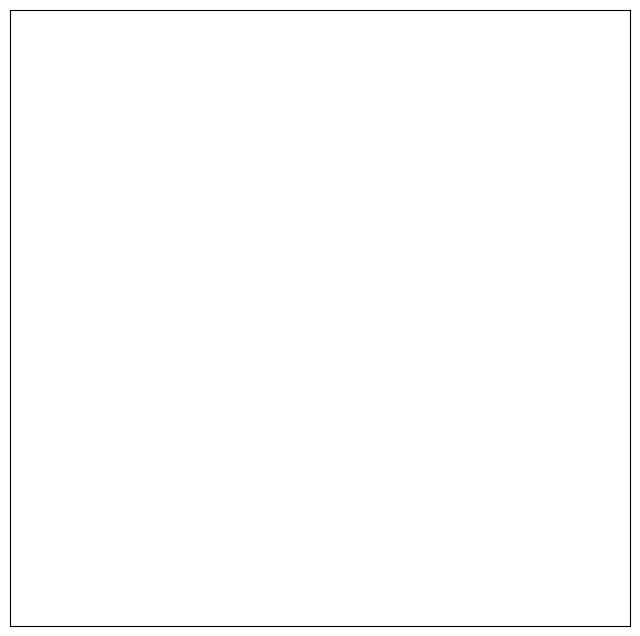

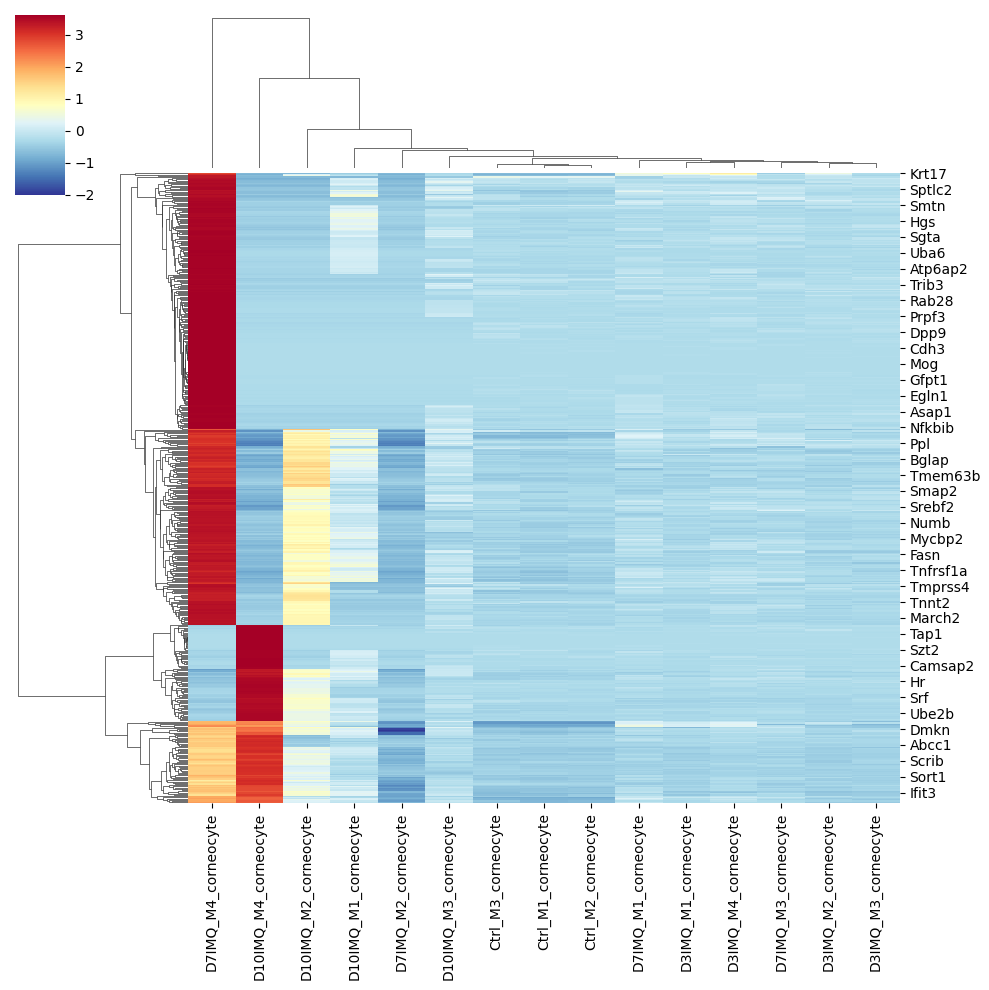

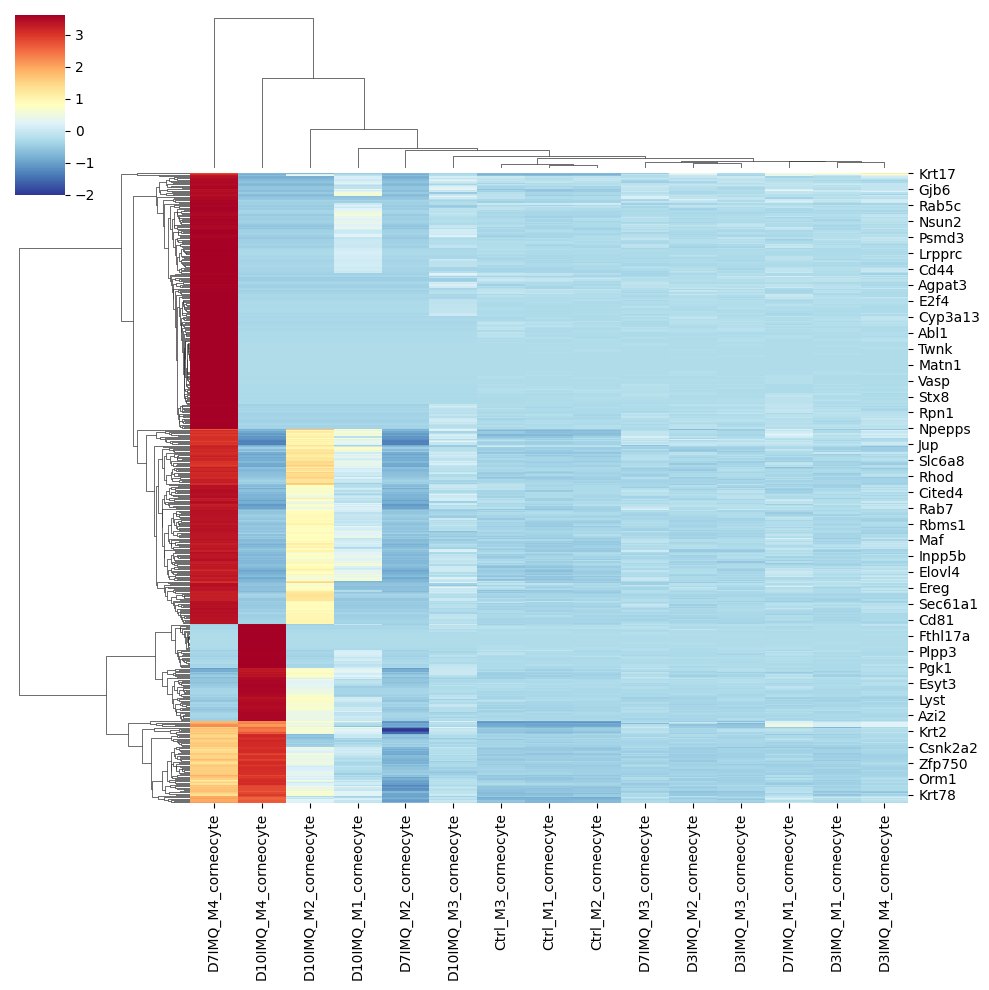

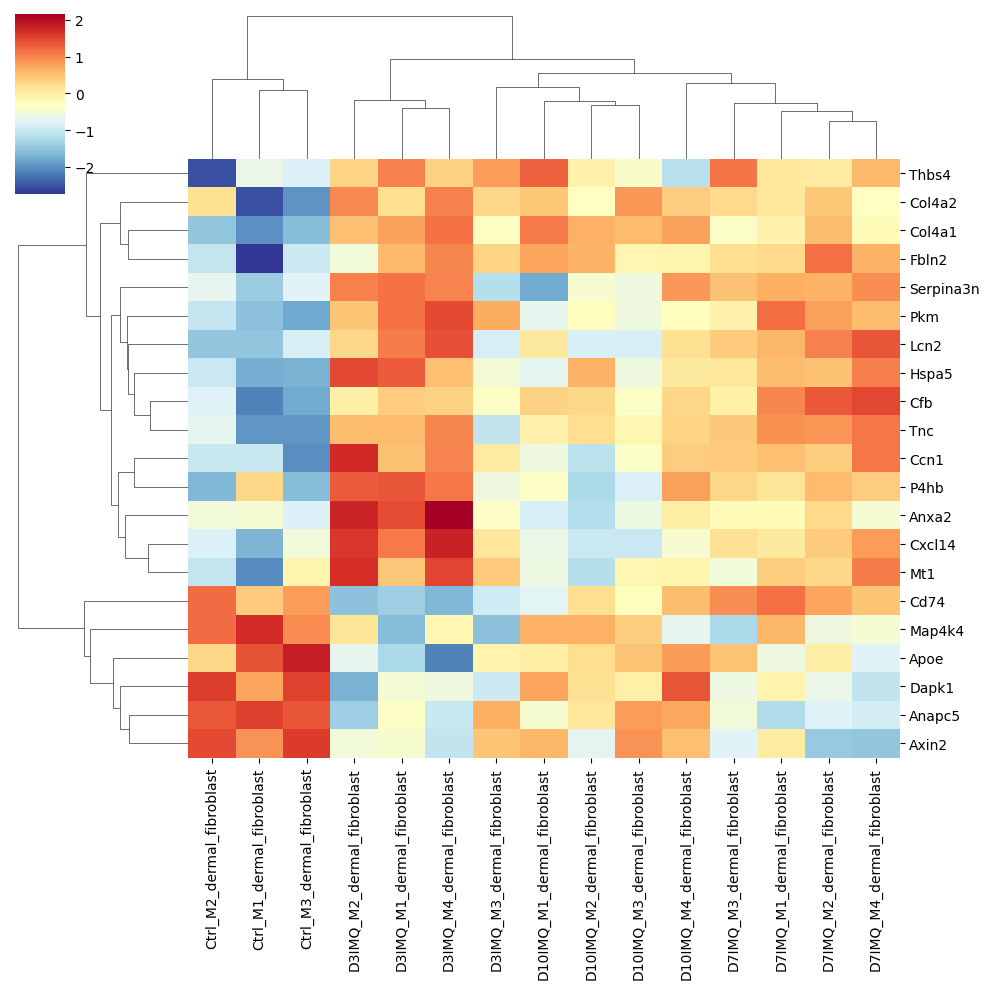

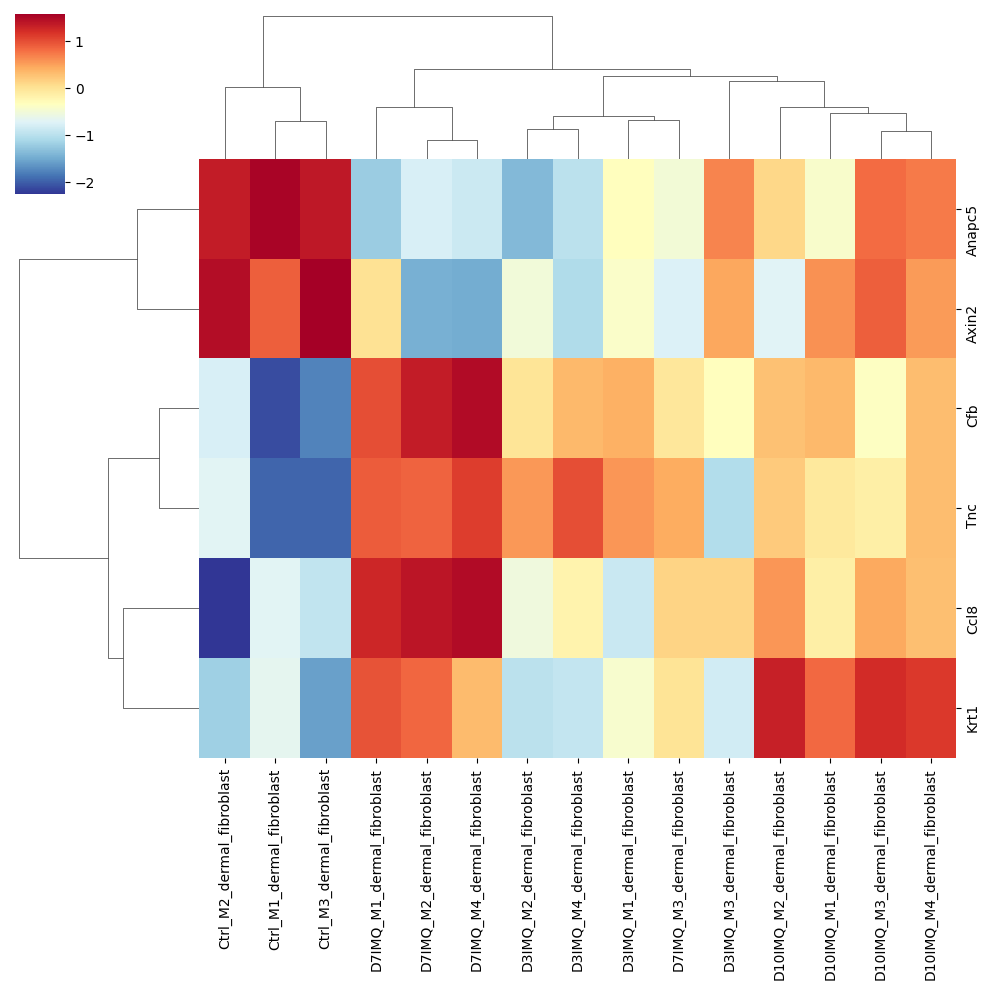

...

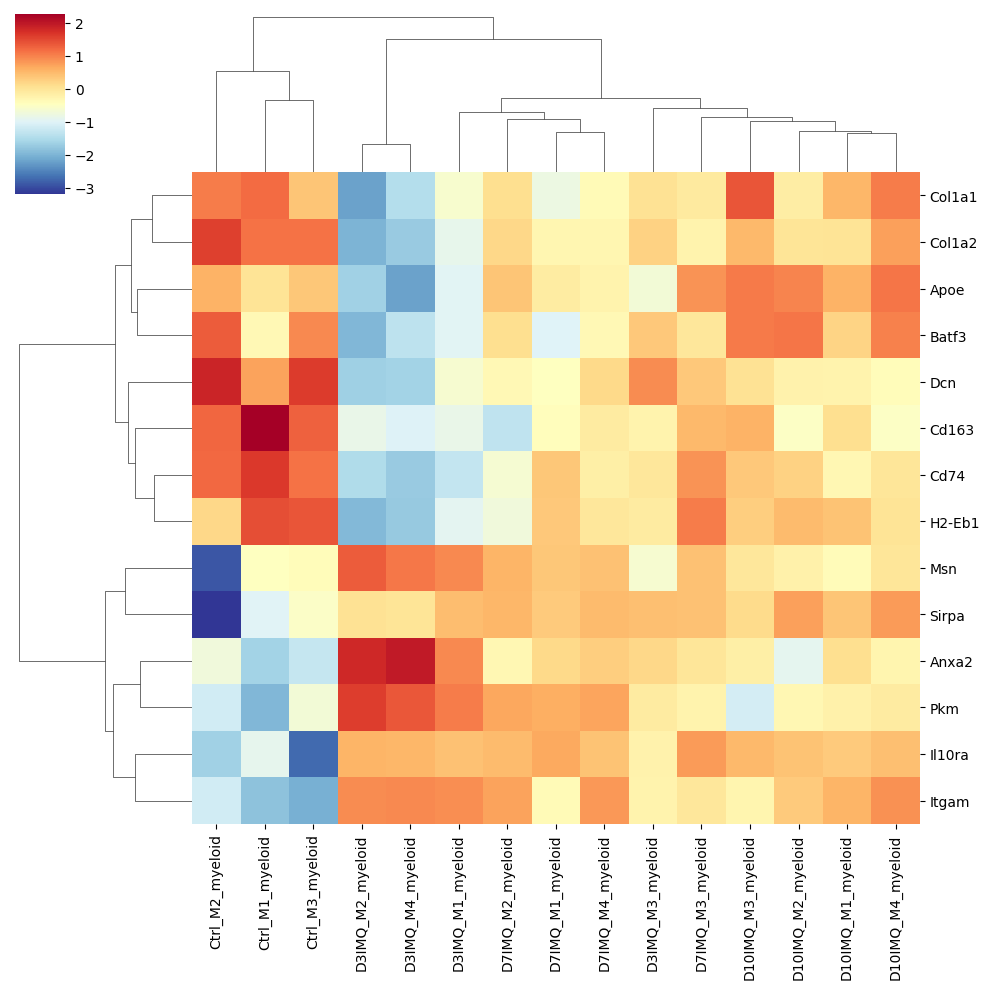

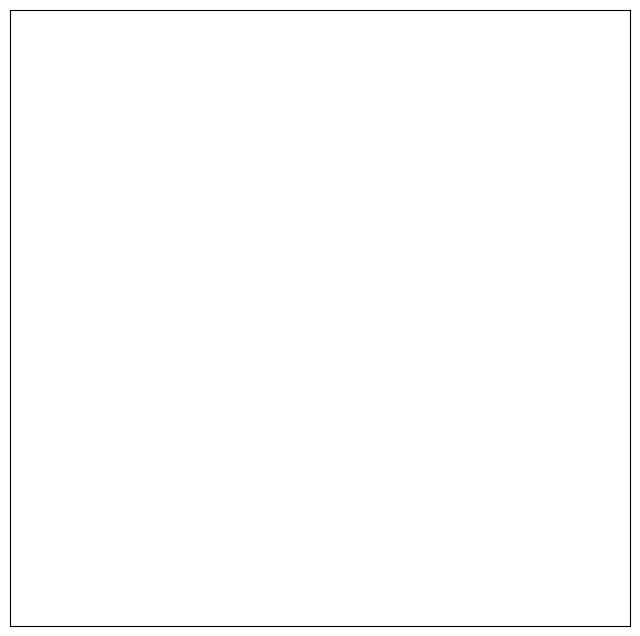

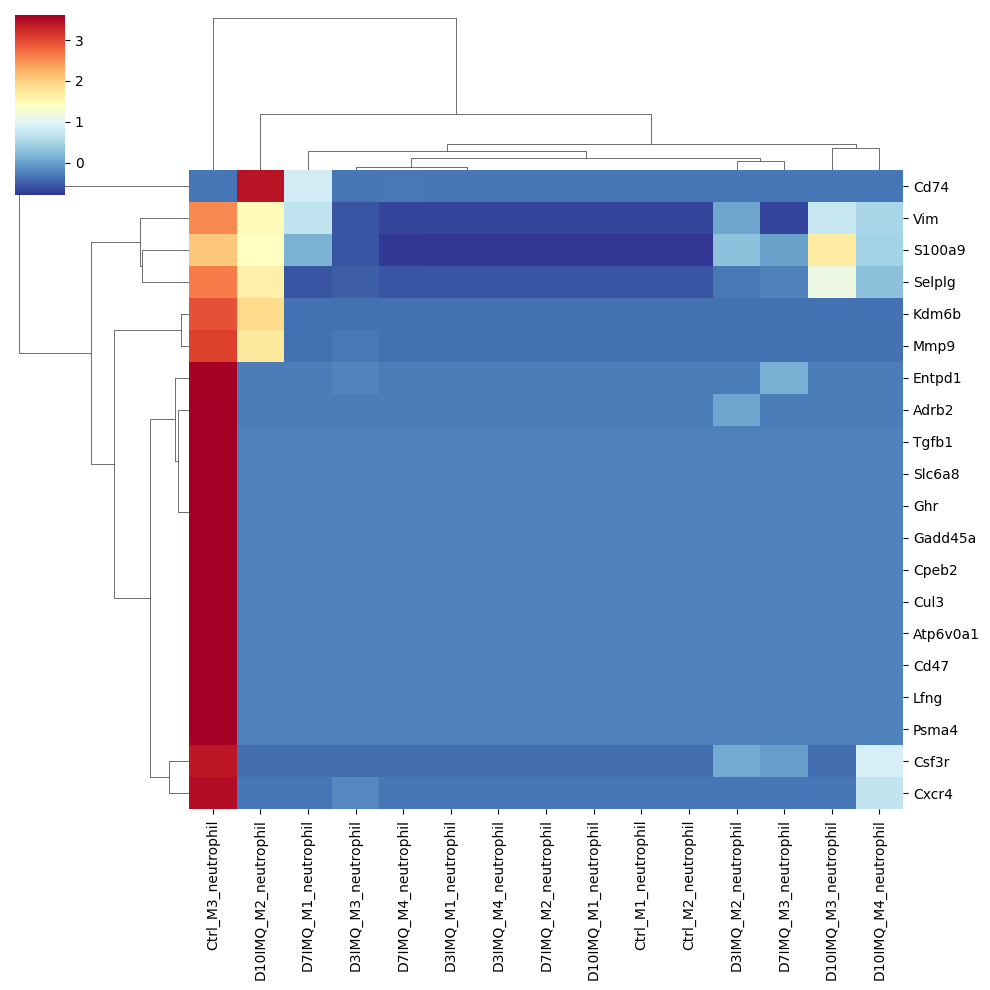

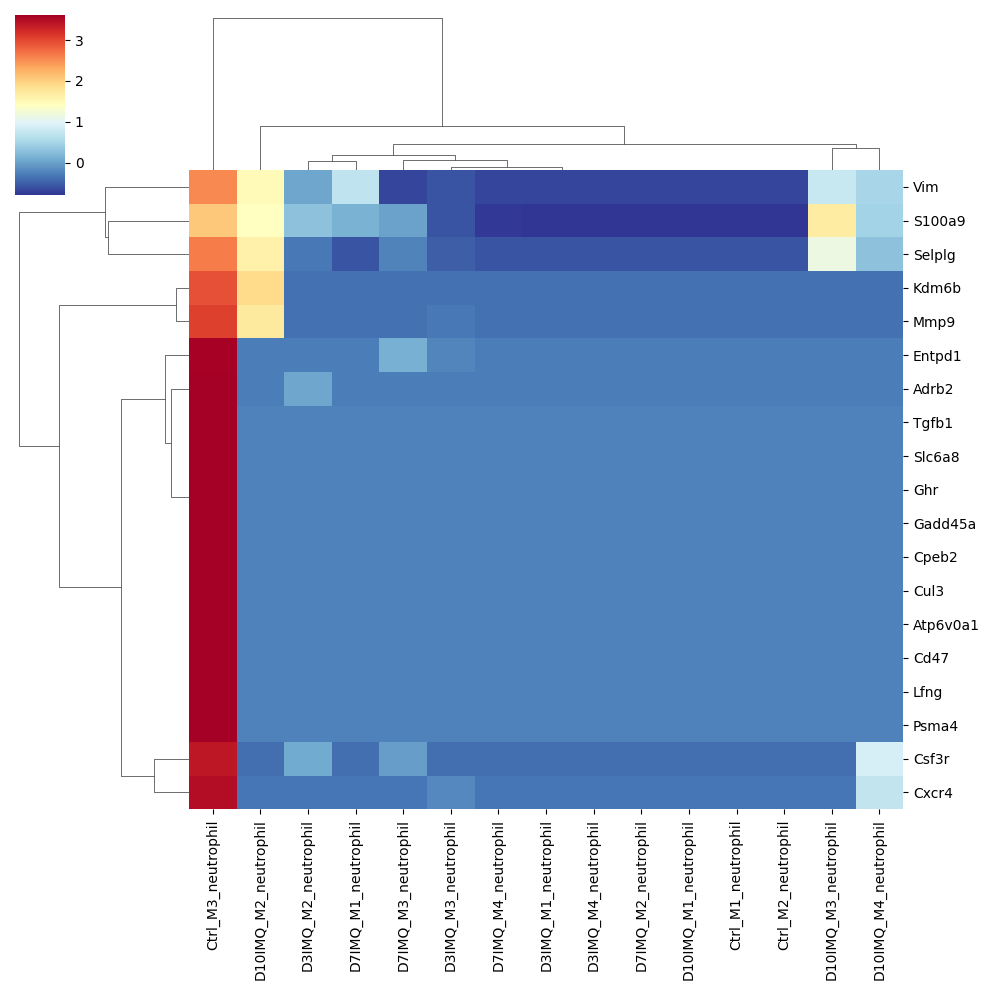

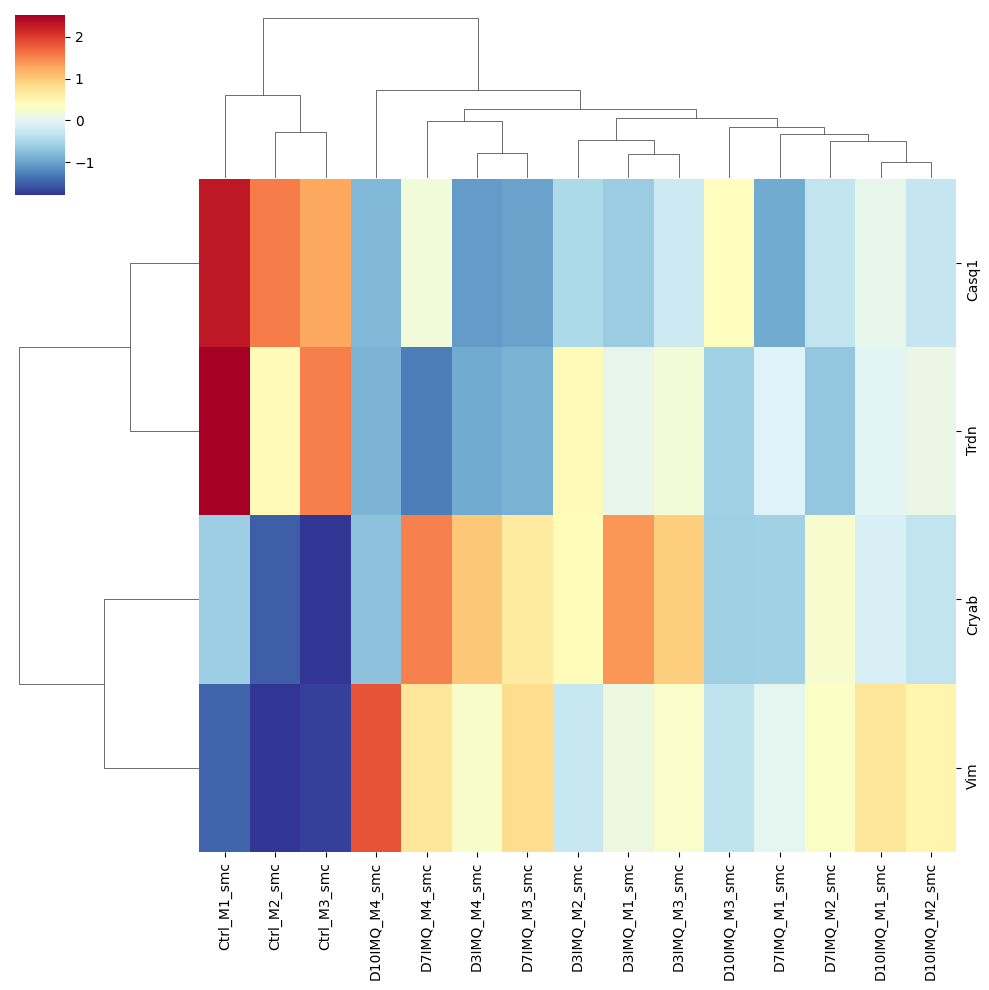

In [71]:
#run on a whole dictionary - single object workflow in following cells
failed_deseq2 = []
low_DEs = []
small_GSEAs = []
failed_enrichments = []

for name, bulk in celltypes_bulk_split.items():
    # if 'celltype' in name: #ignore celltype bulks
    #     continue
    #make a deseq data set from your anndata

    if Path(results_path/ f'{name}_Ctrl_D3IMQ_DEgenes.csv').exists(): #bit jammy, but if D3 is calced, then so are D7/D10
        continue

    dds = DeseqDataSet(counts = bulk.X,
                   metadata = bulk.obs,
                   design_factors = 'condition')
    dds.var = bulk.var


    #run deseq2 on it
    try:
        dds.deseq2()
    except:
        failed_deseq2.append(f'{name}')
        continue

    #get the stats
    for day in ['D3IMQ', 'D7IMQ', 'D10IMQ']:
        stat_res = DeseqStats(dds, contrast = ['condition', day, 'Ctrl']) #pairwise comparison of days with each condition
        stat_res.summary()
        #get diffexp dataframe
        res = stat_res.results_df
        res_file = f'{name}_Ctrl_{day}_DEgenes.csv'
        res.to_csv(results_path / res_file) #save table with stats of DE genes
        
        #filtering any genes with baseMean <10, choice is somewhat arbitrary
        res = res[res.baseMean >10]
        #then filter all those that are not significant or large enough
        sigs = res[(abs(res.log2FoldChange) > 1)&(res.padj <0.05)] #again, log2fc threshold is bit arbitrary,being stringent so using 1.
        #check if yap1 is in the list of significantly expressed genes
        if 'Yap1' in sigs.index.to_list():
            print(f'{name}_Ctrl_{day} has a significant change in YAP1')
        
        #plot VOLCANO PLOT and save
        volcano_plot_name = f'{name}_ctrl_{day}_volcano.png'

        save_dir = results_path / 'Volcano_plots'
        volcano_plot(res, volcano_plot_name, save_dir)
        
        #plot CLUSTERMAP for significant genes
        cluster_map_name = f'{name}_ctrl_{day}_cluster.png'
        cluster_map_path = results_path / 'clustermaps' / cluster_map_name
        if len(sigs) >2:
            dds.layers['log1p'] = np.log1p(dds.layers['normed_counts'])
            dds_sigs = dds[:, sigs.index].copy()

            grapher = pd.DataFrame(dds_sigs.layers['log1p'].T,
                        index = dds_sigs.var_names, columns = dds_sigs.obs_names)
            
            clustermap = sns.clustermap(grapher, z_score = 0, cmap = 'RdYlBu_r')
            clustermap.savefig(cluster_map_path, bbox_inches = 'tight')
            plt.close
        else:
            low_DEs.append(f'{name}_Ctrl_{day}')

        #do GSEA on your diffexped genes
        ranking = res['stat'].dropna().sort_values(ascending = False)

        for gene_set in ['GO_Biological_Process_2026', 'KEGG_2026']:
            try:
                pre_res = gp.prerank(rnk = ranking,
                        gene_sets = gene_set, #this can be a list, e.g. if you wanted to look at molecular function, or KEGG
                        organism = 'mouse',
                        seed = 6, permutation_num=100)
                
                out = []
                for term in list(pre_res.results):
                    out.append([term,
                                pre_res.results[term]['fdr'],
                                pre_res.results[term]['es'],
                                pre_res.results[term]['nes']])
                    
                out_df = pd.DataFrame(out, columns = ['Term', 'fdr', 'es', 'nes']).sort_values('fdr').reset_index(drop = True)
                out_df.sort_values('nes', ascending = False)

                if gene_set == 'GO_Biological_Process_2026':
                    database = 'GO'
                else:
                    database = 'KEGG' 
                out_df.to_csv(results_path / 'GSEA_csvs' / f'{name}_ctrl_{day}_{database}.csv')

                #plotting the ENRICHMENT MAP
                output_path = results_path / 'GSEA plots'/ f'{name}_ctrl_{day}_{database}.png'
                try:
                    enrichment_plot(pre_res, output_path)
                except:
                    print(f'no signficant {database} terms for {name}_Ctrl_{day}')
                    failed_enrichments.append(f'{name}_Ctrl_{day}_{database}')
            except:
                small_GSEAs.append(f'{name}_Ctrl_{day}_{database}')


In [ ]:
# saving then reloading doesn't work --> will have to work out how to logic this into the loop
stat_res = DeseqStats(dds, contrast = ['condition', 'D3IMQ', 'Ctrl']) #note you will need to repeat this pairwise comparison for all 

AttributeError: 'AnnData' object has no attribute 'contrast'

In [76]:
stat_res

In [77]:
# summary statistics, must be run prior to stat_res.results_df
stat_res.summary()

Running Wald tests...


Log2 fold change & Wald test p-value: condition D3IMQ vs Ctrl
          baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1cf      3.224922       -1.439010  1.021326 -1.408963  0.158846  0.325711
A2m       6.196867       -0.583439  0.776584 -0.751289  0.452479  0.633777
Aanat     8.864367       -1.547721  0.568376 -2.723059  0.006468  0.035041
Aatf    188.950562        0.004707  0.151923  0.030983  0.975283  0.985773
Abca1   178.072072       -0.469179  0.181830 -2.580314  0.009871  0.047051
...            ...             ...       ...       ...       ...       ...
Zswim9    7.440184        0.478069  0.706172  0.676986  0.498415  0.673383
Zup1     19.374869       -0.420897  0.370645 -1.135579  0.256133  0.446745
Zyx      18.903959        0.757426  0.432946  1.749468  0.080210  0.202548
Zzef1   130.866450       -0.010049  0.163657 -0.061404  0.951038  0.972420
a         5.817857        1.281990  0.937843  1.366956  0.171639  0.344042

[5056 rows x 6 columns]


... done in 0.92 seconds.



In [78]:
res = stat_res.results_df
res # diffexp dataframe

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
A1cf,3.224922,-1.439010,1.021326,-1.408963,0.158846,0.325711
A2m,6.196867,-0.583439,0.776584,-0.751289,0.452479,0.633777
Aanat,8.864367,-1.547721,0.568376,-2.723059,0.006468,0.035041
Aatf,188.950562,0.004707,0.151923,0.030983,0.975283,0.985773
Abca1,178.072072,-0.469179,0.181830,-2.580314,0.009871,0.047051
...,...,...,...,...,...,...
Zswim9,7.440184,0.478069,0.706172,0.676986,0.498415,0.673383
Zup1,19.374869,-0.420897,0.370645,-1.135579,0.256133,0.446745
Zyx,18.903959,0.757426,0.432946,1.749468,0.080210,0.202548
Zzef1,130.866450,-0.010049,0.163657,-0.061404,0.951038,0.972420


In [79]:
#filtering any genes with baseMean <10, choice is somewhat arbitrary
res = res[res.baseMean >10]

#then filter all those that are not significant or large enough
sigs = res[(abs(res.log2FoldChange) > 1)&(res.padj <0.05)] #again, log2fc threshold is bit arbitrary,being stringent so using 1.

#check if yap1 is in the list of significantly expressed genes
'Yap1' in sigs.index.to_list()

False

As we can see, Yap1 is not differentially expressed at the bulk level between Ctrl and any other condition. 

## Looking at DE results

In [ ]:
de_nums = []
for csv in results_path.glob("*.csv"):
    df = pd.read_csv(results_path / csv)
    filtered = df[df.baseMean >10]
    #then filter all those that are not significant or large enough
    filtered = filtered[(abs(filtered.log2FoldChange) > 1)&(filtered.padj <0.05)] 
    if len(filtered) > 0:
        de_nums.append(len(filtered))
de_nums

[5,
 1,
 4,
 124,
 119,
 123,
 133,
 137,
 115,
 0,
 290,
 0,
 40,
 77,
 98,
 0,
 0,
 0,
 9,
 12,
 10,
 0,
 0,
 0,
 11,
 453,
 448,
 25,
 18,
 5,
 2,
 4,
 2,
 40,
 43,
 5,
 153,
 137,
 91,
 20,
 44,
 41,
 565,
 564,
 566,
 0,
 0,
 0,
 19,
 20,
 24,
 52,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 8,
 11,
 0,
 4,
 8,
 2,
 9,
 50,
 18,
 0,
 0,
 1,
 7,
 9,
 5,
 251,
 248,
 250,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 16,
 7,
 0,
 0,
 0,
 0,
 299,
 298,
 9,
 10,
 1,
 1,
 0,
 0,
 9,
 39,
 2,
 55,
 47,
 27,
 2,
 13,
 6,
 44,
 50,
 53,
 0,
 0,
 0,
 4,
 1,
 3,
 0,
 99,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 10,
 0,
 1,
 2,
 1,
 1,
 473,
 2,
 3,
 3,
 2,
 114,
 115,
 109,
 394,
 419,
 0,
 0,
 150,
 0,
 1,
 0,
 23,
 0,
 0,
 0,
 0,
 10,
 4,
 1,
 516,
 514,
 21,
 6,
 2,
 0,
 1,
 2,
 4,
 21,
 2,
 19,
 22,
 24,
 13,
 29,
 34,
 190,
 190,
 190,
 0,
 0,
 0,
 11,
 5,
 3,
 21,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 2,
 0,
 2,
 4,
 2,
 0,
 98,
 99,
 0,
 0,
 0,
 114,
 110,
 111,
 136,
 140,
 119,
 0,
 290,
 0,
 40,
 77,
 98

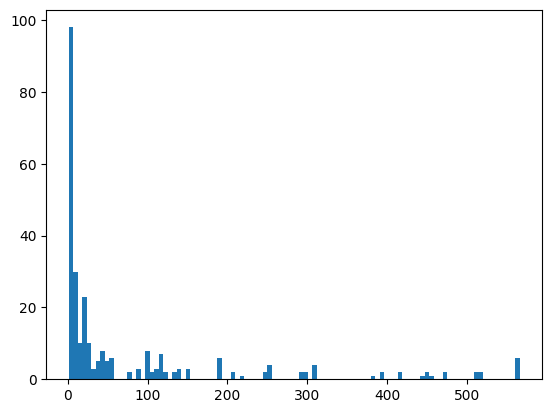

18.0
81.03971119133574
566


In [100]:
#visualising the distribution of no. DExp genes
import matplotlib.pyplot as plt
plt.hist(de_nums, bins = 100)
plt.show()

print(np.median(de_nums))
print(np.mean(de_nums))
print(np.max(de_nums))



In [ ]:
len
len([x for x in de_nums if x > 99]) #how many conditions are there where there are more than 100 differentially expressed genes?

67

### Volcano plot of DExped genes

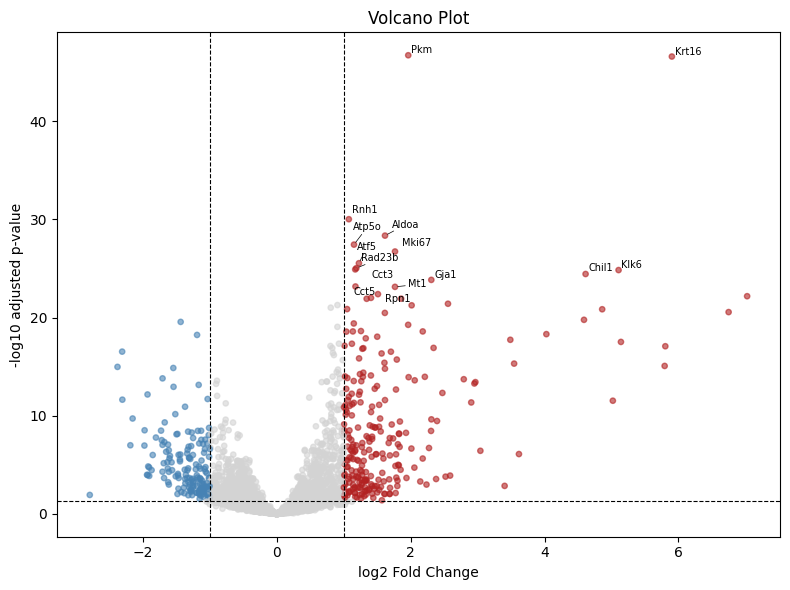

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from adjustText import adjust_text   # pip install adjustText

def volcano_plot(df, title, save_dir):
    df = df.dropna(subset=['log2FoldChange', 'padj'])
    df['-log10padj'] = -np.log10(df['padj'])

    fc_thresh = 1.0
    padj_thresh = 0.05
    n_labels = 20  # number of top genes to label

    fig, ax = plt.subplots(figsize=(8, 6))

    # Plot all points
    colours = np.where(
        (df['padj'] < padj_thresh) & (df['log2FoldChange'] > fc_thresh), 'firebrick',
        np.where(
            (df['padj'] < padj_thresh) & (df['log2FoldChange'] < -fc_thresh), 'steelblue', 'lightgrey'
        )
    )
    ax.scatter(df['log2FoldChange'], df['-log10padj'], c=colours, alpha=0.6, s=15)

    # Label top genes by significance
    top_genes = df.nsmallest(n_labels, 'padj')
    texts = [
        ax.text(row['log2FoldChange'], row['-log10padj'], gene, fontsize=7)
        for gene, row in top_genes.iterrows()
    ]
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', lw=0.5))

    ax.axhline(-np.log10(padj_thresh), color='black', linestyle='--', linewidth=0.8)
    ax.axvline(fc_thresh, color='black', linestyle='--', linewidth=0.8)
    ax.axvline(-fc_thresh, color='black', linestyle='--', linewidth=0.8)

    ax.set_xlabel('log2 Fold Change')
    ax.set_ylabel('-log10 adjusted p-value')
    ax.set_title(title)
    
    save_path = save_dir / (title)
    plt.save_fig(save_path)

## GSEA analysis --> not strictly part of analysis but good to have

In [17]:
import gseapy as gp
from gseapy import gseaplot

In [97]:
ranking = res['stat'].dropna().sort_values(ascending = False) #generate dataframe of DExped genes, sorted from most downregged to most upregged
ranking

Pkm        15.044512
Krt16      14.978822
Rnh1       12.150447
Aldoa      11.807532
Atp5o      11.609670
             ...    
Col7a1     -8.509131
Krt15      -8.540492
Nkd2       -8.966274
Plekha5    -9.420892
Gabbr1     -9.764410
Name: stat, Length: 3418, dtype: float64

In [22]:
#look at available gene ontology libraries
library_list = gp.get_library_name()
for i in library_list:
    if 'KEGG' in i:
        print(i)

KEGG_2013
KEGG_2015
KEGG_2016
KEGG_2019_Human
KEGG_2019_Mouse
KEGG_2021_Human
KEGG_2026


In [ ]:
pre_res = gp.prerank(rnk = ranking,
                     gene_sets = 'GO_Biological_Process_2026', #this can be a list, e.g. if you wanted to look at molecular function, or KEGG
                     organism = 'mouse',
                     seed = 6, permutation_num=100)

In [108]:
#get the dataframe from the pre_res object

out = []

for term in list(pre_res.results):
    out.append([term,
                pre_res.results[term]['fdr'],
                pre_res.results[term]['es'],
                pre_res.results[term]['nes']])
    
out_df = pd.DataFrame(out, columns = ['Term', 'fdr', 'es', 'nes']).sort_values('fdr').reset_index(drop = True)

In [110]:
out_df.sort_values('nes', ascending = False)

,Term,fdr,es,nes
0,Aerobic Respiration (GO:0009060),0.000000,0.728792,2.279332
2,Regulation of Telomere Maintenance via Telomer...,0.000000,0.811968,2.162615
1,Cell Cycle G2/M Phase Transition (GO:0044839),0.000000,0.714487,2.142911
3,Cytoskeleton-dependent Cytokinesis (GO:0061640),0.002272,0.715187,2.095781
4,Cellular Response to Type I Interferon (GO:007...,0.003635,0.680359,2.088727
...,...,...,...,...
177,Collagen Fibril Organization (GO:0030199),0.377362,-0.492635,-1.776452
179,Embryonic Organ Development (GO:0048568),0.379153,-0.472765,-1.803497
119,Regulation of Neuronal Synaptic Plasticity (GO...,0.274662,-0.628294,-1.856853
27,Skeletal System Morphogenesis (GO:0048705),0.059709,-0.631307,-2.031722


### Plot a GSEA plot for a term

[<Axes: xlabel='Gene Rank', ylabel='Ranked metric'>,
 <Axes: >,
 <Axes: >,
 <Axes: ylabel='Enrichment Score'>]

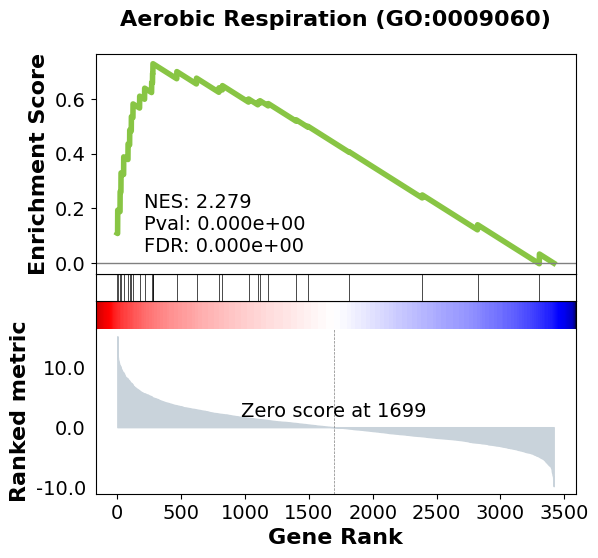

In [ ]:

term_to_graph = out_df.iloc[0]['Term']


result = pre_res.results[term_to_graph]

gseapy.gseaplot(
    rank_metric=pre_res.ranking,
    term=term_to_graph,
    hits=result['hits'],
    nes=result['nes'],
    pval=result['pval'],
    fdr=result['fdr'],
    RES=result['RES'],
)

### Plot barplot/dotplot for enrichment test

<Axes: xlabel='fdr'>

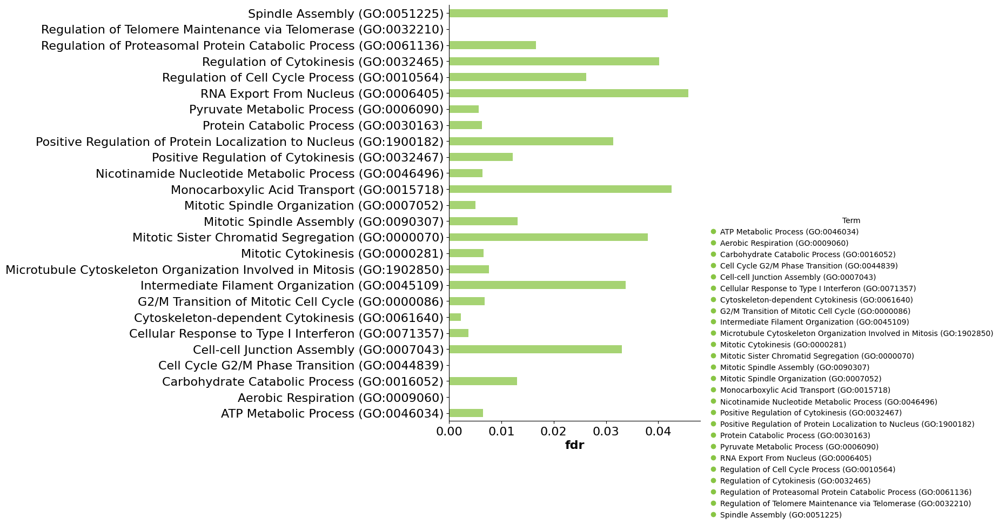

In [141]:
from gseapy import barplot

barplot(
    df=out_df,           # your enrichment results dataframe
    column='fdr',  # column to colour by
    group='Term',
    color='#88C544',
    figsize=(6, 10),
    ofname=None          # set a path to save
)

<Axes: title={'center': 'GSEA'}, xlabel='nes'>

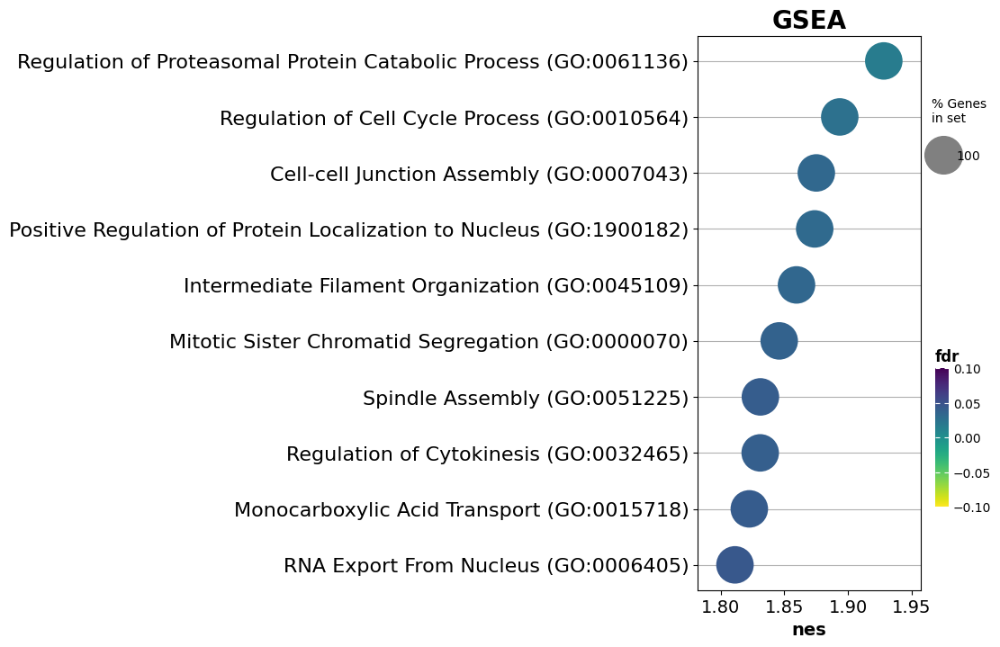

In [140]:
from gseapy import dotplot

dotplot(
    df=out_df,
    column='fdr',
    x='nes',
    title='GSEA',
    figsize=(4, 8),
    cutoff=0.05
)

## Plotting a clustermap of DExped genes --> again, not strictly YAP1 analysis, but may be interesting

In [116]:
import numpy as np
import seaborn as sns

In [ ]:
dds.layers['log1p'] = np.log1p(dds.layers['normed_counts']) #log1p your normalised counts from your deseq dataset object
dds

AnnData object with n_obs × n_vars = 30 × 5056
    obs: 'batch_key', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'region', 'z_level', 'replicate', 'condition', '_scvi_batch', '_scvi_labels', 'highlight', 'psbulk_cells', 'psbulk_counts', 'size_factors', 'replaceable'
    var: 'gene_ids', 'feature_types', 'genome', 'mean_log1p_expression', '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_coeffs', 'disp_function_type', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', '_mu_LFC', '_hat_diagonals'
    varm: 'LFC'
    layers: 'normed_counts', '_mu_hat', 'cooks', 'log1p'

In [118]:
#filter dds by your sigs 
dds_sigs = dds[:, sigs.index]
dds_sigs

View of AnnData object with n_obs × n_vars = 30 × 423
    obs: 'batch_key', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'region', 'z_level', 'replicate', 'condition', '_scvi_batch', '_scvi_labels', 'highlight', 'psbulk_cells', 'psbulk_counts', 'size_factors', 'replaceable'
    var: 'gene_ids', 'feature_types', 'genome', 'mean_log1p_expression', '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_coeffs', 'disp_function_type', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', '_mu_LFC', '_hat_diagonals'
    varm: 'LFC'
    layers: 'normed_counts', '_mu_hat', 'cooks', 'log1p'

In [120]:
grapher = pd.DataFrame(dds_sigs.layers['log1p'].T,
                       index = dds_sigs.var_names, columns = dds_sigs.obs_names)

d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Dom\Virtual_Environments\napari_registration_project\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


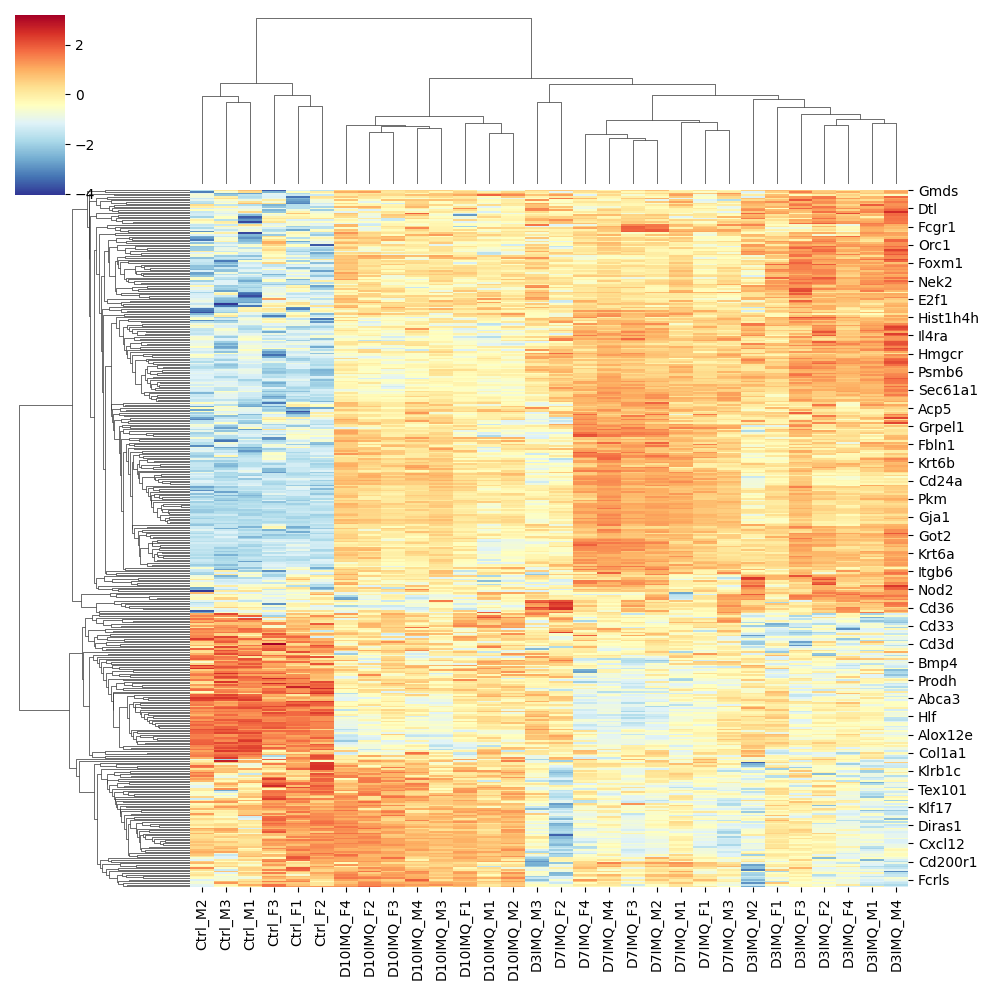

In [122]:
sns.clustermap(grapher, z_score = 0, cmap = 'RdYlBu_r')